# Model Selection, Tuning and Evaluation 

In [2]:
# General imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import scipy.stats as stats
import joblib

# Statsmodels imports
import statsmodels.formula.api as smf
from statsmodels.stats.diagnostic import het_breuschpagan, het_white

# Scikit-learn imports
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.metrics import make_scorer, mean_squared_error, r2_score
from sklearn.model_selection import KFold, GridSearchCV, cross_val_predict, cross_val_score, learning_curve, train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import ElasticNet, Lasso, LinearRegression, Ridge, SGDRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR

# XGBoost imports
import xgboost as xgb
from xgboost import XGBRegressor

# Scipy optimization
from scipy.optimize import minimize


## 1. Introduction 

We will now begin looking at selecting models, tune them, and evaluate them based on the training set.

### 1.1 Loading Sets

We begin by downloading the training and test sets.

In [3]:
df_train = pd.read_csv(r'C:\Users\gustm\Desktop\preprocessed_apartments_train.csv')
df_test = pd.read_csv(r'C:\Users\gustm\Desktop\preprocessed_apartments_test.csv')

### 1.2 Highlights of Tasks in this Notebook

- Scaling of the training set (incl. saving feature and target scaling)
- Initial evaluation of models
- Examining the level of over-/underfitting (before tuning)
- Hyperparameter tuning of models
- Reexamining over-/underfitting (after tuning)
- Final evaluation of tuned models
- Identifying the best models
- Creating a final Ensemble model (*Weighted Average*)
- Final training on the whole set
- Final model validation

## 2. Scaling

In [4]:
df_train.head()

,Price_log,Area_log,Expenses_per_sqm_sqrt,Subway Station_sqrt,Grocery Store_log,Gym,Bakery_log,Elevator,Balcony,Patio,Fireplace,District_Hökmossen_Floor_Lo,District_LM-Staden_Floor_Lo,District_Midsommarkransen_Floor_Mid,District_Midsommarkransen_Floor_Hi,District_Telefonplan_Floor_Lo,District_Telefonplan_Floor_Mid,District_Telefonplan_Floor_Hi
0,15.377857,4.290459,8.360921,21.330729,5.996452,208,5.068904,1,1,0,0,0,0,0,0,0,1,0
1,14.771022,4.043051,8.682509,26.324893,6.364751,553,6.637258,0,0,0,0,1,0,0,0,0,0,0
2,15.135932,3.931826,9.166221,17.349352,5.463832,345,4.859812,0,0,0,0,0,1,0,0,0,0,0
3,14.830741,3.828641,8.266822,19.493589,4.234107,96,5.468060,1,1,0,0,0,0,0,0,1,0,0
4,15.297115,4.110874,7.762879,14.696938,4.653960,233,5.545177,1,1,0,0,0,0,0,0,0,1,0


### 2.1 Creation of Splits of Datasets 

In [5]:
X_train = df_train.drop(columns=['Price_log']) # Features
y_train = df_train['Price_log'] # Target variable

X_test = df_test.drop(columns=['Price_log']) # Features
y_test = df_test['Price_log'] # Target variable

In [6]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(380, 17)
(95, 17)
(380,)
(95,)


In [7]:
X_train.columns

Index(['Area_log', 'Expenses_per_sqm_sqrt', 'Subway Station_sqrt',
       'Grocery Store_log', 'Gym', 'Bakery_log', 'Elevator', 'Balcony',
       'Patio', 'Fireplace', 'District_Hökmossen_Floor_Lo',
       'District_LM-Staden_Floor_Lo', 'District_Midsommarkransen_Floor_Mid',
       'District_Midsommarkransen_Floor_Hi', 'District_Telefonplan_Floor_Lo',
       'District_Telefonplan_Floor_Mid', 'District_Telefonplan_Floor_Hi'],
      dtype='object')

### 2.2 Scaling of Features and Target

We will now scale the data, but we need to know if we will apply it to y_train and y_test as well.
<br> This is typically only done if they are on a different ranges as compared to the features in X_train and X_test.
<br> Let's examine.

In [8]:
df_train.describe()

,Price_log,Area_log,Expenses_per_sqm_sqrt,Subway Station_sqrt,Grocery Store_log,Gym,Bakery_log,Elevator,Balcony,Patio,Fireplace,District_Hökmossen_Floor_Lo,District_LM-Staden_Floor_Lo,District_Midsommarkransen_Floor_Mid,District_Midsommarkransen_Floor_Hi,District_Telefonplan_Floor_Lo,District_Telefonplan_Floor_Mid,District_Telefonplan_Floor_Hi
count,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000
mean,15.069408,3.876732,8.566662,18.320527,5.282733,304.536842,5.167849,0.471053,0.510526,0.042105,0.044737,0.094737,0.152632,0.036842,0.002632,0.171053,0.092105,0.028947
std,0.356026,0.337270,0.745623,3.936888,0.574462,202.247416,0.789905,0.499819,0.500548,0.201094,0.206998,0.293237,0.360106,0.188622,0.051299,0.377051,0.289556,0.167880
min,14.346139,3.091042,6.154944,7.681146,2.397895,2.000000,1.386294,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,14.811535,3.610918,8.152304,15.984344,4.941642,116.000000,4.757863,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,14.946913,3.828641,8.555137,18.867962,5.332719,289.500000,5.228428,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,15.274996,4.110874,9.035191,20.976177,5.595639,443.000000,5.598422,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,16.308716,4.897840,11.547005,28.670542,6.692084,790.000000,6.872128,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


**Comment**
- We can clearly see that `Price_log` ranges from 14.3 to 16.3, while `Area_log` ranges from 3.1 to 4.9. 
- Also, `Gym` ranges from 2 to 790, so yes, they are indeed in different ranges.

Thus, we will scale y_train and y_test as well. 

In [9]:
# Initialize scalers
feature_scaler = StandardScaler()
target_scaler = StandardScaler()

# Fit and transform the training features
X_train_scaled = feature_scaler.fit_transform(X_train)

# Transform the test features using the same scaler
X_test_scaled = feature_scaler.transform(X_test)

# Convert y_train and y_test to numpy arrays and reshape to 2D arrays for scaling
y_train_array = np.array(y_train).reshape(-1, 1)
y_test_array = np.array(y_test).reshape(-1, 1)

# Fit and transform the training target variable
y_train_scaled = target_scaler.fit_transform(y_train_array)

# Transform the test target variable using the same scaler
y_test_scaled = target_scaler.transform(y_test_array)

# Reshape y_train_scaled and y_test_scaled back to 1D arrays if needed
y_train_scaled = y_train_scaled.ravel()
y_test_scaled = y_test_scaled.ravel()

# Print shapes to verify
print("X_train_scaled shape:", X_train_scaled.shape)
print("X_test_scaled shape:", X_test_scaled.shape)
print("y_train_scaled shape:", y_train_scaled.shape)
print("y_test_scaled shape:", y_test_scaled.shape)

# Save the scalers
joblib.dump(feature_scaler, 'feature_scaler.pkl')
joblib.dump(target_scaler, 'target_scaler.pkl')


X_train_scaled shape: (380, 17)
X_test_scaled shape: (95, 17)
y_train_scaled shape: (380,)
y_test_scaled shape: (95,)


['target_scaler.pkl']

In [10]:
X_train_scaled

array([[ 1.22830924, -0.27629485,  0.76562275, ..., -0.45425676,
         3.13960871, -0.17265659],
       [ 0.493782  ,  0.15557428,  2.03585159, ..., -0.45425676,
        -0.31851103, -0.17265659],
       [ 0.1635655 ,  0.80516459, -0.24701126, ..., -0.45425676,
        -0.31851103, -0.17265659],
       ...,
       [-1.04021514, -0.40266393,  0.29835965, ...,  2.20139816,
        -0.31851103, -0.17265659],
       [ 1.50016202, -1.79600706, -1.11710806, ..., -0.45425676,
        -0.31851103, -0.17265659],
       [ 0.1635655 ,  0.72880083, -0.03233239, ..., -0.45425676,
        -0.31851103, -0.17265659]])

Looks good.

## 3. Defining Functions for Model Evaluation

We will follow this structured approach for several models.
1. Initial Model Training and Evaluation
2. Check for Overfitting/Underfitting
3. Hyperparameter Tuning
4. Final Evaluation

After that we will run Ensemble methods to combine the strengths of the best-performing models, potentially improving overall performance.
<br> We define functions for evaluation and tuning.

In [11]:
# Setting up a kfold object
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

### 3.1 Initial Model Training and Evaluation

In [12]:
def evaluate_model(model):
    # Fit the model to the training data
    model.fit(X_train_scaled, y_train_scaled)

    # Predict on the test data
    y_pred = model.predict(X_test_scaled)

    # Evaluate the model
    mse_initial = mean_squared_error(y_test_scaled, y_pred)
    r2_initial = r2_score(y_test_scaled, y_pred)

    # Print results
    print(f'R² Score - test (untuned): {r2_initial:.3f}')
    print(f'MSE Score - test (untuned): {mse_initial:.3f}')

    return r2_initial, mse_initial

### 3.2 Overfitting/Underfitting

In [13]:
def model_analysis(model, r2_test, mse_test):
    
    ''' Purpose: By comparing performance on the training set and the test set, we can quickly identify overfitting (if the model performs significantly better on the training set) 
    or underfitting (if the model performs poorly on both the training and test sets).
    '''    
    
    # Subfunction to compare training and test performance
    def compare_performance():
        # Predict on training data
        y_train_pred = model.predict(X_train_scaled)

        # Calculate metrics for training set
        mse_train = mean_squared_error(y_train_scaled, y_train_pred)
        r2_train = r2_score(y_train_scaled, y_train_pred)

        # Print results
        print(f'Comparison between train and test scores:\n')
        print(f'R² Score - train: {r2_train:.3f}')
        print(f'R² Score - test: {r2_test:.3f}')
        print(f'MSE Score - train: {mse_train:.3f}')
        print(f'MSE Score - test: {mse_test:.3f}')

        return r2_train, mse_train

    
    ''' Purpose: The learning curves help visualize how the model performance evolves with increasing training data size. 
    They give insight into whether adding more data could improve the model or if it's already saturated.
    '''   
    
    # Subfunction to plot learning curves for both MSE and R²
    def plot_learning_curve():
        # Learning curve for MSE
        train_sizes, train_scores_mse, test_scores_mse = learning_curve(
            model, X_train_scaled, y_train_scaled,
            n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10),
            cv=kfold, scoring='neg_mean_squared_error'
        )
    
        # Learning curve for R²
        train_sizes_r2, train_scores_r2, test_scores_r2 = learning_curve(
            model, X_train_scaled, y_train_scaled,
            n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10),
            cv=kfold, scoring='r2'
        )
    
        # Convert negative MSE to positive
        train_scores_mse_mean = -train_scores_mse.mean(axis=1)
        test_scores_mse_mean = -test_scores_mse.mean(axis=1)
    
        train_scores_r2_mean = train_scores_r2.mean(axis=1)
        test_scores_r2_mean = test_scores_r2.mean(axis=1)
    
        # Create a DataFrame for learning curve values
        learning_curve_df = pd.DataFrame({
            'Training Size': train_sizes.astype(int),
            'Training MSE': train_scores_mse_mean.round(3),
            'Validation MSE': test_scores_mse_mean.round(3),
            'Training R²': train_scores_r2_mean.round(3),
            'Validation R²': test_scores_r2_mean.round(3)
        })
    
        # Print the learning curve values in a table format
        print("\nLearning Curves:\n")
        print(learning_curve_df.to_string(index=False))
    
        # Plot with twin axes
        fig, ax1 = plt.subplots(figsize=(10, 6))
    
        # Plot MSE learning curve
        ax1.plot(train_sizes, train_scores_mse_mean, 'o-', color='lightcoral', label='Training MSE')  # Light red for Training MSE
        ax1.plot(train_sizes, test_scores_mse_mean, 'o-', color='#4682B4', label='Cross-validation MSE')  # Steel Blue for Validation MSE
    
        ax1.fill_between(train_sizes, 
                         train_scores_mse_mean - train_scores_mse.std(axis=1),
                         train_scores_mse_mean + train_scores_mse.std(axis=1), 
                         alpha=0.2, color='lightcoral')  # Shade for Training MSE
        ax1.fill_between(train_sizes, 
                         test_scores_mse_mean - test_scores_mse.std(axis=1),
                         test_scores_mse_mean + test_scores_mse.std(axis=1), 
                         alpha=0.2, color='lightblue')  # Shade for Validation MSE
        ax1.set_xlabel('Training Size', color='black')
        ax1.set_ylabel('Mean Squared Error', color='black')
        ax1.tick_params(axis='y', labelcolor='black')
        
        # Create twin axis for R²-score
        ax2 = ax1.twinx()
        ax2.plot(train_sizes_r2, train_scores_r2_mean, 'o--', color='darkred', label='Training R²')  # Dark red for Training R²
        ax2.plot(train_sizes_r2, test_scores_r2_mean, 'o--', color='darkblue', label='Cross-validation R²')  # Dark blue for Validation R²
        ax2.fill_between(train_sizes_r2,
                         train_scores_r2_mean - train_scores_r2.std(axis=1),
                         train_scores_r2_mean + train_scores_r2.std(axis=1),
                         alpha=0.2, color='black')  # Shade for Training R²
        ax2.fill_between(train_sizes_r2,
                         test_scores_r2_mean - test_scores_r2.std(axis=1),
                         test_scores_r2_mean + test_scores_r2.std(axis=1),
                         alpha=0.2, color='black')  # Shade for Validation R²
        ax2.set_ylabel('R² Score', color='black')  # Changed to black
        ax2.tick_params(axis='y', labelcolor='black')  # Changed to black
    
        # Add titles and legends
        plt.title('Learning Curves: MSE and R² Score')
        fig.tight_layout()  # Adjust layout to make space for both axes
    
        ax1.legend(loc='upper left')
        ax2.legend(loc='upper right')
    
        plt.grid()
        plt.show()


    
    ''' Purpose: Residuals help you understand how well the model's predictions match the true values. 
    Analyzing the residuals across cross-validation predictions provides a deeper insight into the model's generalization performance.
    '''
    
    # Subfunction for residual analysis
    def residual_analysis():
        # Perform cross-validation and get predictions for each validation fold
        y_val_pred = cross_val_predict(model, X_train_scaled, y_train_scaled, cv=kfold)

        # Calculate residuals: difference between actual and predicted values
        residuals = y_train_scaled - y_val_pred

        # 1. Residuals vs Predicted Values
        plt.scatter(y_val_pred, residuals, alpha=0.7)
        plt.axhline(y=0, color='red', linestyle='--')
        plt.title('Residuals vs. Predicted Values (Cross-Validation)')
        plt.xlabel('Predicted Values')
        plt.ylabel('Residuals')
        plt.show()

        # 2. Histogram of Residuals
        sns.histplot(residuals, bins=30, kde=True)
        plt.title('Histogram of Residuals (Cross-Validation)')
        plt.xlabel('Residuals')
        plt.ylabel('Frequency')
        plt.show()

        # 3. Q-Q Plot of Residuals
        stats.probplot(residuals, dist="norm", plot=plt)
        plt.title('Q-Q Plot of Residuals (Cross-Validation)')
        plt.show()

    # Call the subfunctions
    compare_performance()
    plot_learning_curve()
    residual_analysis()


### 3.3 Hyperparameter Tuning

In [14]:
def tune_hyperparameters(model, param_grid, scoring=make_scorer(mean_squared_error, greater_is_better=False), cv=kfold):
    """
    Function to perform hyperparameter tuning using GridSearchCV and print results.

    Parameters:
    - model: The machine learning model to tune.
    - param_grid: A dictionary of hyperparameters to tune.
    - scoring: Scoring metric for evaluating the models (default is MSE).
    - cv: Number of cross-validation folds (default is 10).

    Returns:
    - best_model: The best model after hyperparameter tuning.
    - best_params: The best hyperparameters found.
    """
    
    # Initialize GridSearchCV
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid,
                               scoring=scoring, cv=cv, n_jobs=-1, verbose=1)

    # Fit GridSearchCV using globally defined X_train_scaled and y_train_scaled
    grid_search.fit(X_train_scaled, y_train_scaled)

    # Get the best parameters and model
    best_params = grid_search.best_params_
    best_model = grid_search.best_estimator_

    # Perform cross-validation with the best model to evaluate MSE
    mse_cv_results = cross_val_score(best_model, X_train_scaled, y_train_scaled, cv=cv, scoring='neg_mean_squared_error')
    mse_cv_results = -mse_cv_results  # Convert negative MSE to positive

    # Calculate the mean and standard deviation of the cross-validated MSE
    mean_mse = np.mean(mse_cv_results)
    std_mse = np.std(mse_cv_results)

    # Perform cross-validation with the best model to evaluate R²
    r2_cv_results = cross_val_score(best_model, X_train_scaled, y_train_scaled, cv=cv, scoring='r2')

    # Calculate the mean and standard deviation of the cross-validated R² scores
    mean_r2 = np.mean(r2_cv_results)
    std_r2 = np.std(r2_cv_results)

    # Print results
    print(f"Average R² Score: {mean_r2:.3f} (± {std_r2:.3f})")
    print(f"Average MSE Score: {mean_mse:.3f} (± {std_mse:.3f})\n")
    print("Best Hyperparameters:")
    for key, value in best_params.items():
        print(f"{key}: {value}")

    return best_model, best_params


### 3.4 Final Evaluation

In [15]:
def final_evaluation(best_model, r2_initial, mse_initial):
    """
    Function to evaluate the best model on the training and test data.

    Parameters:
    - best_model: The optimized model obtained from hyperparameter tuning.
    - r2_initial: R² score of the initial (untuned) model on the test set.
    - mse_initial: Mean squared error of the initial (untuned) model on the test set.
    """
    
    # Ensure that the best_model is already fitted; skip refitting
    # best_model already contains the best parameters
    
    # Predict on the training data
    y_train_pred = best_model.predict(X_train_scaled)
    
    # Predict on the test data
    y_test_pred = best_model.predict(X_test_scaled)

    # Calculate metrics for the training set
    mse_train = mean_squared_error(y_train_scaled, y_train_pred)
    r2_train = r2_score(y_train_scaled, y_train_pred)

    # Calculate metrics for the test set
    mse_test = mean_squared_error(y_test_scaled, y_test_pred)
    r2_test = r2_score(y_test_scaled, y_test_pred)

    # Calculate meterics for performance increase (test set)
    perf_mse_test = 100 * (mse_test - mse_initial) / mse_initial
    perf_r2_test = 100 * (r2_test - r2_initial) / r2_initial

    # Print results: compare initial test performance with tuned model's performance
    print(f'Initial R² Score - Test: {r2_initial:.3f}')
    print(f'Tuned R² Score - Train: {r2_train:.3f}')
    print(f'Tuned R² Score - Test: {r2_test:.3f}')
    print(f'Performance change: R² Score - test: {perf_r2_test:.1f}%\n')

    print(f'Initial MSE Score - Test: {mse_initial:.3f}')
    print(f'Tuned MSE Score - Train: {mse_train:.3f}')
    print(f'Tuned MSE Score - Test: {mse_test:.3f}')
    print(f'Performance change: MSE Score - test: {perf_mse_test:.1f}%')

## 4. Model Evaluation

Since we have a small dataset that isn't overly complex, we expect to simple models to perform the best.
<br> More advanced models may result in overfitting, but we will evaluate several models to see if these assumptions are held true.

### 4.1 SGD Regression

I want to explore Gradient Descent a bit, but as I understand it, it is really good for larger datasets. 
<br> However, having a small dataset, the SciKit-Learn's Orinary Least Squares (OLS) may be enough (Linear Regression).
<br> Let's do them in tandem and evaluate them. we *are* here to learn after all.

#### 4.1.1 Initial Model Training and Evaluation

In [15]:
# Initialize the Model
model = SGDRegressor(max_iter=1000, tol=1e-3, learning_rate='optimal', random_state=42)

# Call the Function
r2_initial, mse_initial = evaluate_model(model)

R² Score - test (untuned): -101687533703055924959117312.000
MSE Score - test (untuned): 118737824536460876127928320.000


**Comment**
<br> We can see that the model is not converging right away. 
<br> We will have to set the parameters differently, before moving on.

In [16]:
# Initialize the Model
model = SGDRegressor(max_iter=1000, tol=1e-3, learning_rate='constant', eta0=0.0001, random_state=42)

# Call the Function
r2_initial, mse_initial = evaluate_model(model)

R² Score - test (untuned): 0.883
MSE Score - test (untuned): 0.137


**Comment**
<br> That looks a lot better - we have convergence.
<br> Let's move on to checking for overfitting/underfitting before moving on to fine-tuning.

#### 4.1.2 Overfitting/Underfitting (untuned model)

To check for overfitting and underfitting, we will look at:
1. Compare Training and Test Performance
2. Learning Curves
3. Residual Analysis

*Learning Curves* are graphical representations that show how a model's performance changes with varying amounts of training data. 
<br> They typically plot the training and test errors (or metrics like MSE or R²) against the size of the training dataset.

We perform a *Residual Analysis* since we want to gain insights to model's performance and identify any systematic errors or outliers that might not be apparent from MSE alone.

Comparison between train and test scores:

R² Score - train: 0.866
R² Score - test: 0.883
MSE Score - train: 0.134
MSE Score - test: 0.137

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34         0.299           0.473        0.684          0.513
            68         0.257           0.339        0.711          0.648
           102         0.197           0.246        0.779          0.747
           136         0.167           0.212        0.806          0.781
           171         0.156           0.205        0.820          0.789
           205         0.151           0.187        0.835          0.807
           239         0.152           0.178        0.837          0.816
           273         0.143           0.168        0.853          0.825
           307         0.139           0.153        0.861          0.841
           342         0.138           0.149        0.862          0.844


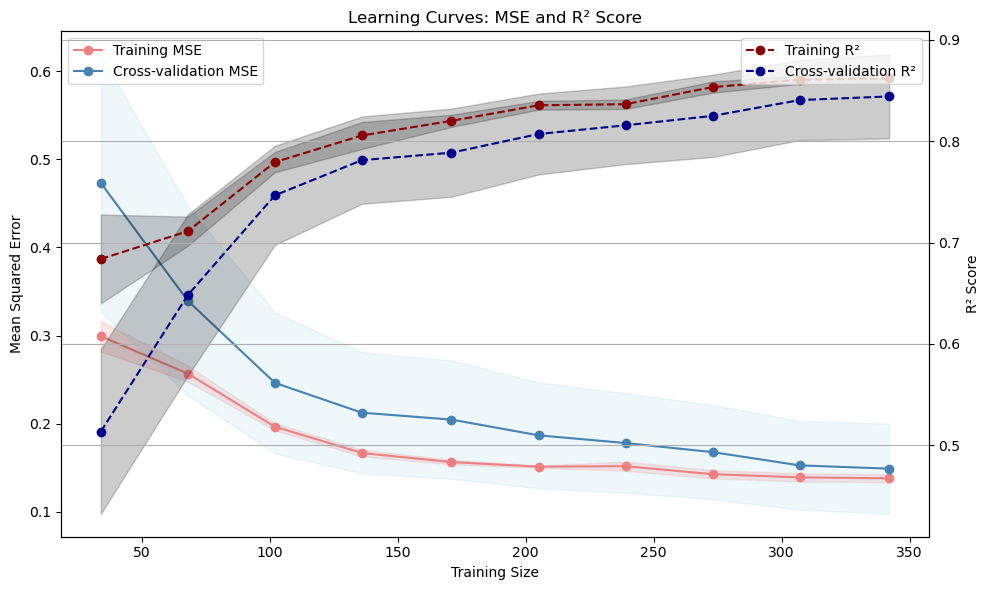

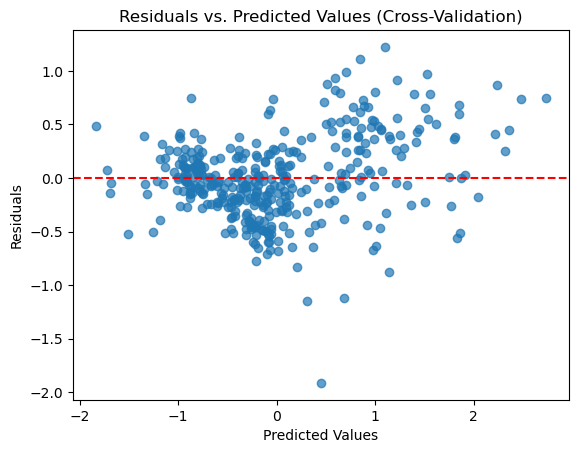

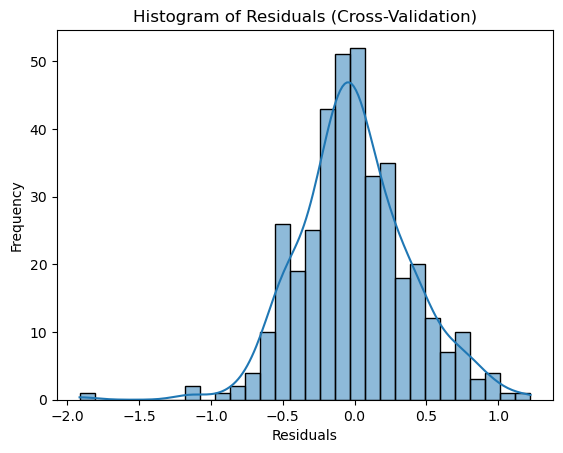

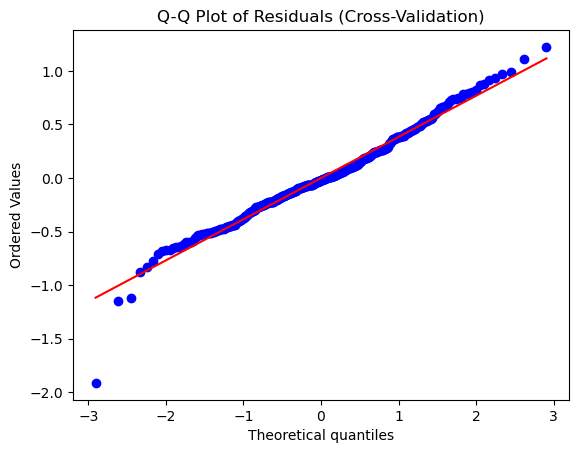

In [17]:
# Fit the Model to the Training Data
model.fit(X_train_scaled, y_train_scaled)

# Call the Function
model_analysis(model, r2_initial, mse_initial)

**Comment**

*Compare Training and Test Performance*
<br> Both the R² and MSE scores look good and they are close together, which indicates that there doesn't seem to be any overfitting (or underfitting)

*Learning Curves*
<br> The model is *well-fitted* to the data, since:
- `Training MSE` and `Validation(CV) MSE` converges as training size increases and are close to each other (<10% difference).
- Both the `Training MSE` and `Validation MSE` are reasonably low.
- `Training R²` and `Validation R²` scores are close (<5% difference), and are fairly high.

It's possible that the we can see a further convergence with increased data to the dataset.

*Residual Plots*
- The *Residual Plot* has its points randomly scattered around the 0-line. This is good as it suggests that the model has captured the overall pattern well
- However, there is also a slight *upward movement* in *Residual Values* as the *Predicted Values* increase. This suggests that there is non-linearity in the data that this linear model is not able to capture.
- This could indicate *heteroscedasticity* meaning that the error variance is not constant across all levels of predicted values. This can lead to less reliable predictions for larger values.

- The histogram looks as the residuals have a normal distribution
- The Q-Q Plot has its points on the line, except for in the lower theoretical quantiles. This indicates that I may have issues with the tails and outliers.

#### 4.1.3 Examining Heteroscedasticity

Knowing that we may have problems with heteroscedasticity, we can investigate the training set to see if it is the dataset that *intrinsically* has heteroscedasticity, or if it is a *model-induced* heteroscedasticity.

In [18]:
# Assuming X_train_scaled is a NumPy array, create a DataFrame
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train.columns)

# Change special characters and replace spaces in column names
X_train_scaled_df.columns = [
    col.replace(' ', '_').replace('ö', 'o').replace('-', '_') for col in X_train_scaled_df.columns
]

# Create a DataFrame for the dependent variable
y_train_df = pd.Series(y_train_scaled, name='Price_log')

# Combine both into a single DataFrame
data = pd.concat([X_train_scaled_df, y_train_df], axis=1)

# Create the formula dynamically, using updated column names
formula = 'Price_log ~ ' + ' + '.join(X_train_scaled_df.columns)

# Fit the model using statsmodels
model = smf.ols(formula, data=data).fit()

# Print the summary of the model
print(model.summary())

# Get residuals and independent variable(s)
residuals = model.resid
exog = model.model.exog

# Perform Breusch-Pagan test
bp_test = het_breuschpagan(residuals, exog)
bp_test_results = dict(zip(['Lagrange multiplier statistic', 'p-value', 'f-value', 'f p-value'], bp_test))
print("Breusch-Pagan Test Results:")
print(bp_test_results)

# Perform White test
white_test = het_white(residuals, exog)
white_test_results = dict(zip(['Lagrange multiplier statistic', 'p-value', 'f-value', 'f p-value'], white_test))
print("\nWhite Test Results:")
print(white_test_results)


                            OLS Regression Results                            
Dep. Variable:              Price_log   R-squared:                       0.892
Model:                            OLS   Adj. R-squared:                  0.887
Method:                 Least Squares   F-statistic:                     176.5
Date:                Tue, 24 Sep 2024   Prob (F-statistic):          1.90e-163
Time:                        21:39:34   Log-Likelihood:                -115.69
No. Observations:                 380   AIC:                             267.4
Df Residuals:                     362   BIC:                             338.3
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
In

**Comments**

1. **OLS Regression Results**
<br> **R-squared Value:** The R-squared value of 0.892 indicates that approximately 89.2% of the variance in the dependent variable (Price_log) is explained by the model, which is a strong indication of model fit.
<br> **P-values for Coefficients:** Some predictors (e.g., `Area_log`, `Expenses_per_sqm_sqrt`, `Fireplace`, and certain district indicators) have significant p-values (less than 0.05), suggesting they are statistically significant predictors of `Price_log`.

2. **Breusch-Pagan Test Results**
<br> **Lagrange Multiplier Statistic:** The value is approximately 55.59.
<br> **P-value:** The p-value (5.50e-06) is significantly less than 0.05. This indicates strong evidence against the null hypothesis of *homoskedasticity*, suggesting the presence of *heteroskedasticity* in the model.

3. **White Test Results**
<br> **Lagrange Multiplier Statistic:** The value is approximately 301.42.
<br> **P-value:** The p-value (3.22e-18) is also far below 0.05, further supporting the conclusion that there is *heteroskedasticity* in the model.

**Summary**
<br> Both the Breusch-Pagan and White tests indicate the presence of *heteroskedasticity* in the dataset, suggesting that the variance of the errors is not constant across all levels independent variables. 
<br> This finding could impact the efficiency of coefficient estimates and the validity of statistical tests.

**Recommendations**
1. **Robust Standard Errors:** It is advisable to utilize heteroskedasticity-robust standard errors for interpreting coefficients and conducting hypothesis tests.
2. **Model Refinement:** Further investigation into potential transformations of the dependent variable or the addition of interaction terms and nonlinear effects may improve the model's ability to account for variability in the errors.
3. **Further Diagnostics:** Plotting residuals against fitted values can provide a visual assessment of *heteroskedasticity* and inform possible model refinements based on observed patterns.

**Conclusions**
- There are thing we could do to examine what can be done to heteroskedasticity of the dataset.
- But since we are focused on learning about models here, we will save this for another time.

#### 4.1.4 Hyperparameter Tuning

In [19]:
# Initialize the Model
model = SGDRegressor(random_state=42)

# Set up the Hyperparameter Grid
param_grid = {
    'alpha': [0.00001, 0.0001, 0.001, 0.01, 0.05, 0.1, 0.5],  # Regularization strength
    'eta0': [0.00001, 0.0001, 0.001, 0.01, 0.1],
    'learning_rate': ['constant', 'optimal', 'invscaling'],
    'max_iter': [10, 50, 100, 250, 500, 1000, 5000, 10000, 50000, 100000],
    'tol': [1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2],
}

# Call the Function
best_model, best_params = tune_hyperparameters(model, param_grid)

Fitting 10 folds for each of 6300 candidates, totalling 63000 fits
Average R² Score: 0.874 (± 0.040)
Mean Squared Error: 0.119 (± 0.045)

Best Hyperparameters:
alpha: 0.01
eta0: 0.001
learning_rate: constant
max_iter: 50
tol: 0.0001


**Comment**
<br> Our initial, untuned model on the training set yielded:
<br> R² Score: 0.866, MSE Score: 0.134

After hyperparameter tuning, using the training set (incl. validation):
<br> R² Score: 0.874, MSE Score: 0.119

Thus, we have improved the scores a bit.

**Conclusions:**
<br> We have improved the scores a bit.

1. **Model Complexity:** The relatively low `max_iter` and moderate `alpha` suggest that the problem doesn't require a highly complex model to fit well. This is often a good sign, indicating that we're not overfitting.
2. **Convergence:** The low `max_iter` value suggests quick convergence. However, it might be worth checking the convergence curve to ensure the model has truly reached its optimal state.
3. **Regularization:** The chosen `alpha` indicates that some regularization is helpful. This can improve generalization and prevent overfitting.
4. **Learning Rate:** The constant `learning rate` was chosen over `adaptive` methods. While this works well, we might want to experiment with a smaller grid around the chosen `eta0` value to fine-tune it further.
5. **Robustness:** Given the wide ranges in our parameter grid, the fact that moderate values were often chosen suggests a robust problem that doesn't require extreme parameter values.

In [20]:
# Initialize the Model
model = SGDRegressor(random_state=42)

# Set up the hyperparameter grid
param_grid = {
    'alpha': [0.005, 0.010, 0.015, 0.020, 0.025],  # Regularization strength
    'eta0': [0.0005, 0.0010, 0.0015],
    'learning_rate': ['constant', 'optimal', 'invscaling'],
    'max_iter': [10, 20, 30, 40, 50, 60, 70],
    'tol': [1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2],
}

# Call the Function
best_model, best_params = tune_hyperparameters(model, param_grid)

Fitting 10 folds for each of 1890 candidates, totalling 18900 fits
Average R² Score: 0.874 (± 0.040)
Mean Squared Error: 0.119 (± 0.045)

Best Hyperparameters:
alpha: 0.01
eta0: 0.001
learning_rate: constant
max_iter: 30
tol: 0.0001


**Comment**
<br> The results are the same after tuning. No need to further this.

Let's examine `Lasso` regularization, and see if it has any effect. 
<br> When we initialize SGDRegressor() without arguments, it uses L2 regularization (Ridge) by default.

In [21]:
# Initialize the Model, with Lasso (L1) regularization
model = SGDRegressor(penalty='l1', random_state=42)

# Set up the hyperparameter grid
param_grid = {
    'alpha': [0.00001, 0.0001, 0.001, 0.01, 0.05, 0.1, 0.5, 1, 5, 10],  # Regularization strength
    'eta0': [0.00001, 0.0001, 0.001, 0.01, 0.1],
    'learning_rate': ['constant', 'optimal', 'invscaling'],
    'max_iter': [10, 20, 30, 40, 50, 100, 250, 500, 1000],
    'tol': [1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2],
}

# Call the Function
best_model, best_params = tune_hyperparameters(model, param_grid)

Fitting 10 folds for each of 8100 candidates, totalling 81000 fits
Average R² Score: 0.875 (± 0.039)
Mean Squared Error: 0.119 (± 0.046)

Best Hyperparameters:
alpha: 0.01
eta0: 0.001
learning_rate: constant
max_iter: 40
tol: 1e-05


**Comment**
<br> Not much af a change. 
<br> Let's try a combination of the two regularization models, `Elastic Net`.

In [19]:
# Initialize the Model, with Elastic Net (L1 and L2 regularization)
model = SGDRegressor(penalty='elasticnet', random_state=42)

# Set up the hyperparameter grid
param_grid = {
    'alpha': [0.0001, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5],  # Regularization strength for both L1 and L2
    'eta0': [0.0001, 0.0005, 0.001, 0.005],  # Learning rates
    'l1_ratio': [0.7, 0.8, 0.9, 0.95, 1],  # Mix ratio between L1 and L2
    'learning_rate': ['constant', 'optimal', 'invscaling'],
    'max_iter': [80, 90, 100],  # Focus on higher iterations for convergence
    'tol': [1e-09, 1e-08, 1e-07, 1e-6, 1e-5, 1e-4],  # Tolerance for stopping criteria
}

# Call the Function
best_model, best_params = tune_hyperparameters(model, param_grid)

Fitting 10 folds for each of 7560 candidates, totalling 75600 fits
Average R² Score: 0.875 (± 0.039)
Average MSE Score: 0.119 (± 0.046)

Best Hyperparameters:
alpha: 0.01
eta0: 0.001
l1_ratio: 1
learning_rate: constant
max_iter: 80
tol: 1e-05


We can see that it chooses to behave like a pure `Lasso` model (`l1_ratio`=1), when it has an option between 0 an 1 in its ratio between `Ridge` and `Lasso`.
<br> It mimics the `Lasso` regularization above.

#### 4.1.5 Overfitting/Underfitting (tuned model)

Comparison between train and test scores:

R² Score - train: 0.890
R² Score - test: 0.883
MSE Score - train: 0.110
MSE Score - test: 0.137

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34         0.096           0.179        0.899          0.812
            68         0.099           0.137        0.888          0.856
           102         0.095           0.126        0.893          0.868
           136         0.092           0.121        0.893          0.873
           171         0.093           0.123        0.893          0.872
           205         0.099           0.123        0.892          0.871
           239         0.109           0.125        0.883          0.869
           273         0.106           0.121        0.891          0.873
           307         0.108           0.119        0.892          0.874
           342         0.109           0.119        0.891          0.875


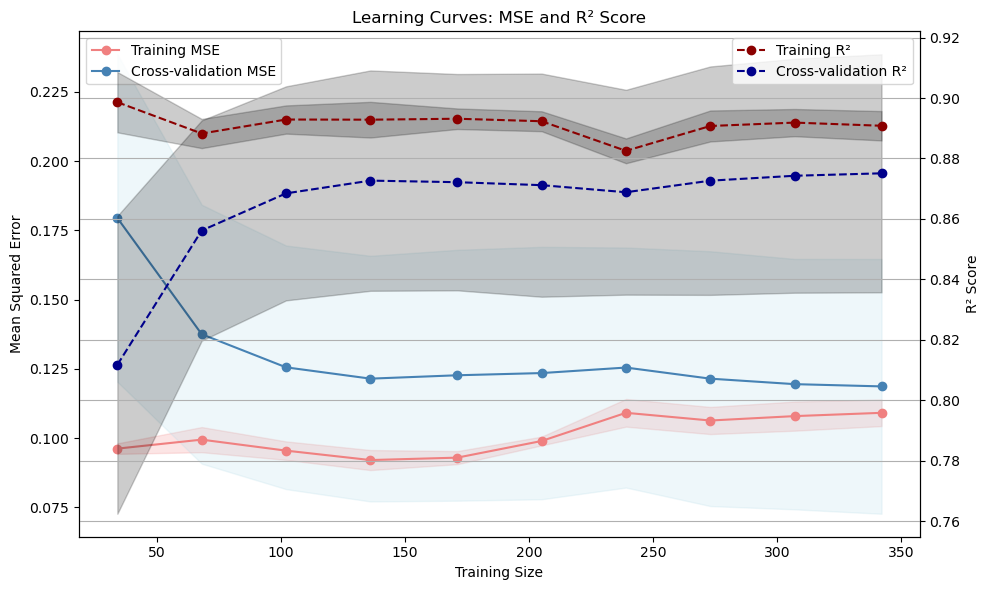

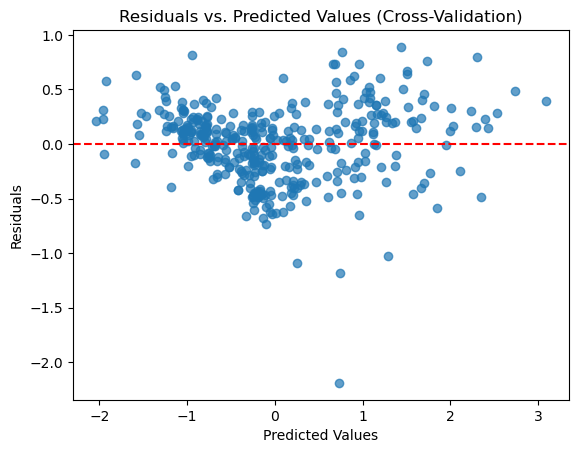

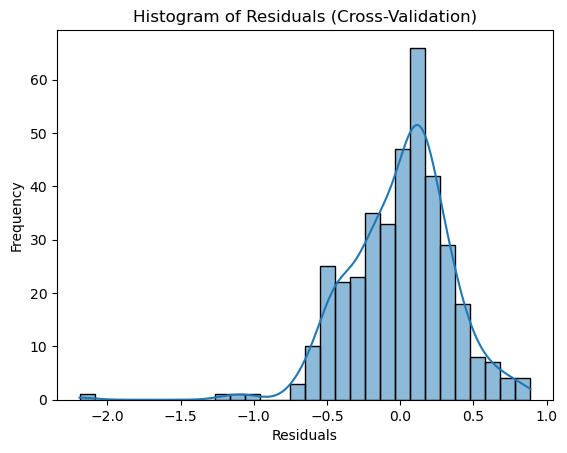

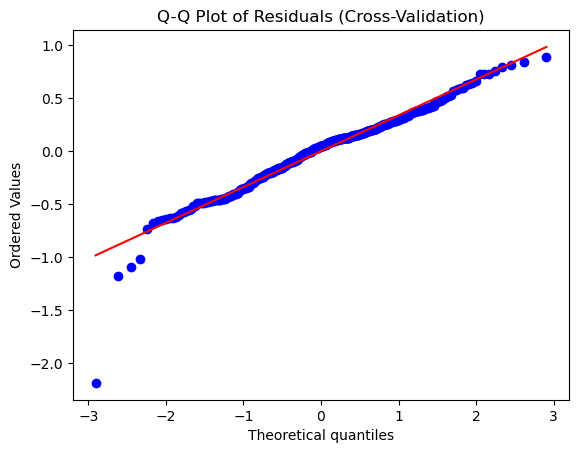

In [20]:
# Call the Function
model_analysis(best_model, r2_initial, mse_initial)

**Comment**

*Training set (excl. validation set):*
<br> R² Score: 0.862, MSE Score: 0.138 (before tuning)
<br> R² Score: 0.891, MSE Score: 0.109 (after tuning)

*Change (Training set):*
<br> R² Score: +3.4%, MSE Score: -21.0%

*Validation set (cv test):*
<br> R² Score: 0.844, MSE Score: 0.149 (before tuning)
<br> R² Score: 0.875, MSE Score: 0.119 (after tuning)

*Change (Validation set):*
<br> R² Score: +3,7%, MSE Score: -20.1%


*Percental differences between `Training`and `Validation` scores (tuned) - Overfitting or Not (R² Score: <5%, MSE Score: <10%)*
<br> R² Score: 2% (Ok!)
<br> MSE Score: -8% (Ok!)

**Conclusion**
- `Lasso` is preferred of `Ridge` (l1=1), and the tuning has improved both the Training and the Validation scores of R² and MSE.
- No *overfitting* to speak of.

#### 4.1.6 Final Evaluation

We now run our parameter-optimized model with our test data.

In [27]:
# Call the Function
final_evaluation(best_model, r2_initial, mse_initial)

Initial R² Score - Test: 0.883
Tuned R² Score - Train: 0.890
Tuned R² Score - Test: 0.915
Performance change: R² Score - test: 3.7%

Initial MSE Score - Test: 0.137
Tuned MSE Score - Train: 0.110
Tuned MSE Score - Test: 0.099
Performance change: MSE Score - test: -27.7%


**Comment**
- The tuned model shows an improvement in both R² and MSE scores, indicative of the tuned model appearing to generalize well.
- The training score is slightly lower than the test score, which is still acceptable, but typically, we would want the training score to be at least as high as the test score to confirm good generalization.

### 4.2. Linear Regression

#### 4.2.1 Initial Model Training and Evaluation

Linear Regression model is less complex compared to SGDRegressor, so it may work better on this limited dataset.

In [28]:
# Initialize the Model
model = LinearRegression()

# Call the Function
r2_initial, mse_initial = evaluate_model(model)

R² Score - test (untuned): 0.915
MSE Score - test (untuned): 0.100


**Comment**
<br> This is a strong result straight away, even comparable to the *tuned* SGD regression model.

#### 4.2.2 Overfitting/Underfitting (untuned model)

To check for overfitting and underfitting, we will look at:
1. Compare Training and Test Performance
2. Learning Curves
3. Residual Analysis

*Learning Curves* are graphical representations that show how a model's performance changes with varying amounts of training data. 
<br> They typically plot the training and test errors (or metrics like MSE or R²) against the size of the training dataset.

We perform a *Residual Analysis* since we want to gain insights to model's performance and identify any systematic errors or outliers that might not be apparent from MSE alone.

Comparison between train and test scores:

R² Score - train: 0.892
R² Score - test: 0.915
MSE Score - train: 0.108
MSE Score - test: 0.100

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34         0.070           0.186        0.926          0.798
            68         0.094           0.152        0.894          0.839
           102         0.093           0.125        0.896          0.867
           136         0.090           0.123        0.895          0.869
           171         0.091           0.123        0.896          0.869
           205         0.097           0.125        0.895          0.868
           239         0.107           0.127        0.885          0.865
           273         0.104           0.123        0.893          0.870
           307         0.106           0.120        0.894          0.872
           342         0.107           0.120        0.893          0.873


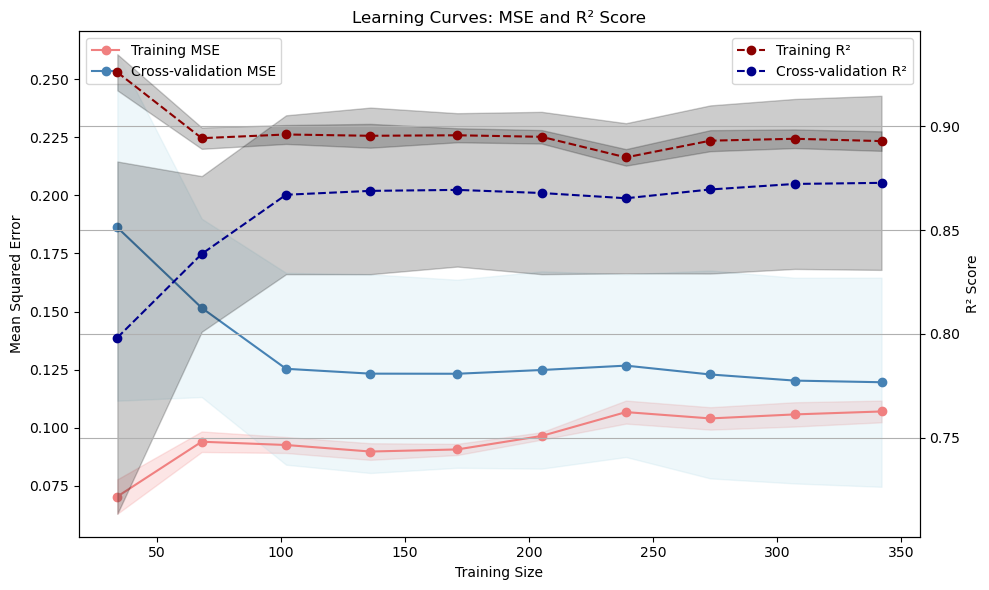

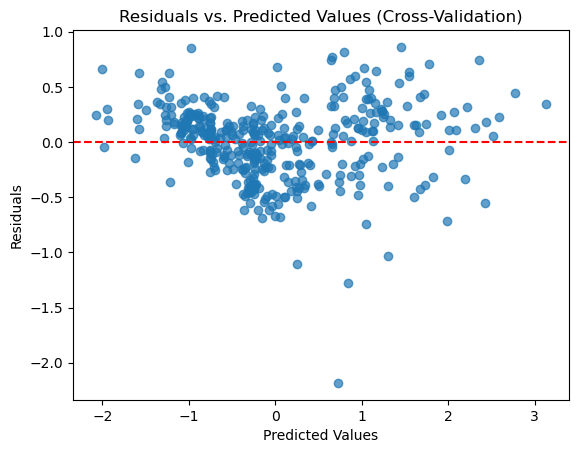

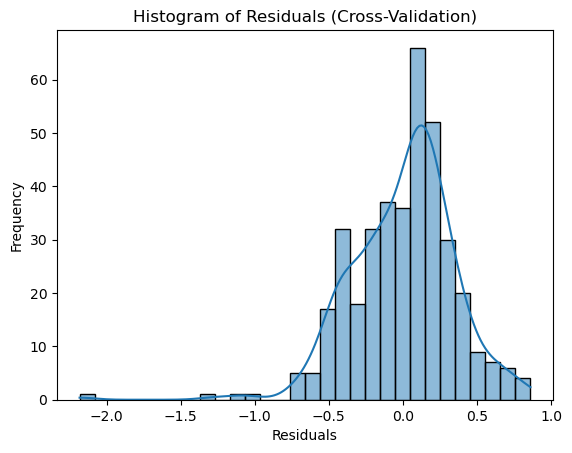

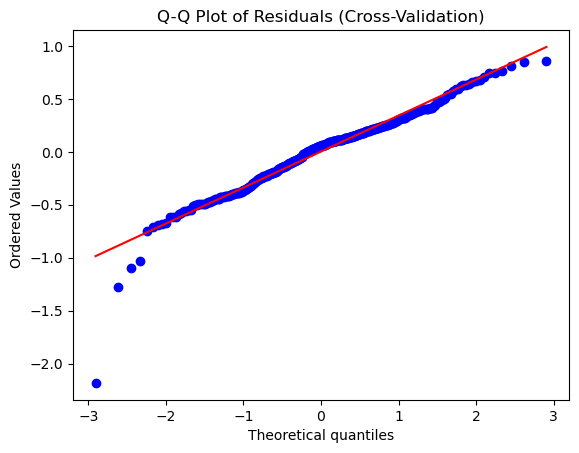

In [29]:
# Initialize the Model
model = LinearRegression()

# Fit the Model to the Training Data
model.fit(X_train_scaled, y_train_scaled)

# Call the Function
model_analysis(model, r2_initial, mse_initial)

**Comment**
<br> Similar to SGD Regression, both the R² and MSE scores look good and they are close together, which indicates that there doesn't seem to be any overfitting (or underfitting)

*Learning Curves*
<br> The model is *well-fitted* to the data, since:
- `Training MSE` and `Validation(CV) MSE` converges as training size increases and are close to each other (<10% difference).
- Both the `Training MSE` and `Validation MSE` are reasonably low.
- `Training R²` and `Validation R²` scores are close (<5% difference), and are fairly high (close to 1).

**Comment**
<br> The plots are similar to the SGD regression model. 
- The *Residial Plot* has its points randomly scattered around the 0-line. This is good as it suggests that the model has captured the overall pattern well
- However, there is also a slight upward movement in *Residual Values* as the *Predicted Values* increase, almost looking like a heart. This suggests that there is non-linearity in the data that this linear model is not able to capture.
- This could indicate *heteroscedasticity* meaning that the error variance is not constant across all levels of predicted values. This can lead to less reliable predictions for larger values.

- The histogram looks as the residuals have a normal distribution
- The Q-Q Plot has its points on the line, except for in the lower theoretical quantiles. This indicates that I may have issues with the tails and outliers.  

#### 4.2.3 Hyperparameter Tuning

We will now try out some hyperparameters, but since `LinearRegressor()` really can't be tuned with hyperparameters, we will use `Ridge()`, `Lasso()` and `Elastic Net` (a combination of the two regulaization models) instead. 
<br> They are essentially LinearRegressor() with a regularization added to it. 
<br> Note that it won't reiterate, but uses a `Direct Solver` using matrix calculation.

In [53]:
# Initialize the Model
model = Ridge(random_state=42)

# Set up the Hyperparameter Grid
param_grid = {
    'alpha': [5, 5.5, 5.6, 5.7, 5.8, 5.9, 6, 6.1, 6.2, 6.3, 6.4, 6.5, 7],  # Regularization strength
    'max_iter': [1, 2, 3, 4, 5, 10, 50, 100, 250],  # Optional: for convergence control (Not important, since it uses a Direct Solver)
    'tol': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5, 1e-4, 1e-3]  # Optional: tolerance for stopping criteria (Not important, since it uses a Direct Solver)
}

# Call the Function
best_model, best_params = tune_hyperparameters(model, param_grid)

Fitting 10 folds for each of 819 candidates, totalling 8190 fits
Average R² Score: 0.874 (± 0.040)
Average MSE Score: 0.119 (± 0.045)

Best Hyperparameters:
alpha: 6.1
max_iter: 1
tol: 1e-09


**Comment**
<br> Our initial, untuned model on the training set yielded:
<br> R² Score: 0.892, MSE Score: 0.108

After hyperparameter tuning, using the training set (incl. validation):
<br> R² Score: 0.874, MSE Score: 0.119

So, `Ridge` doesn't seem to improve the model, compared to the basic Linear Regression model. 

We will now try `Lasso`.

In [54]:
# Initialize the Model
model = Lasso(random_state=42)

# Set up the hyperparameter grid
param_grid = {
    'alpha': [0.005, 0.01, 0.05, 0.1],  # Regularization strength
    'max_iter': [10, 50, 80, 100, 120, 140, 250],  # Lasso often needs more iterations
    'tol': [1e-9, 1e-6]  # Tolerance for optimization
}

# Call the Function
best_model, best_params = tune_hyperparameters(model, param_grid)

Fitting 10 folds for each of 56 candidates, totalling 560 fits
Average R² Score: 0.875 (± 0.039)
Average MSE Score: 0.119 (± 0.046)

Best Hyperparameters:
alpha: 0.01
max_iter: 80
tol: 1e-09


Very similar results.
<br> Let's try `Elastic Net` as well.

In [30]:
# Initilize the model
model = ElasticNet(random_state=42)

# Set up the hyperparameter grid
param_grid = {
    'alpha': [0.005, 0.01, 0.05, 0.1],  # Overall regularization strength
    'l1_ratio': [0.9, 0.925, 0.95, 0.975, 1],  # Mix of L1 and L2 regularization
    'max_iter': [1000, 5000, 10000],  # Maximum number of iterations
    'tol': [1e-9, 1e-6, 1e-3]  # Tolerance for optimization
}

# Call the function
best_model, best_params = tune_hyperparameters(model, param_grid)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits
Average R² Score: 0.875 (± 0.039)
Average MSE Score: 0.119 (± 0.046)

Best Hyperparameters:
alpha: 0.01
l1_ratio: 1
max_iter: 1000
tol: 1e-09


**Comment**
<br> Similar to the `SGD Regression`, the model wants `Lasso` (l1_ratio = 1).

#### 4.2.4 Overfitting/Underfitting (tuned model)

Comparison between train and test scores:

R² Score - train: 0.890
R² Score - test: 0.915
MSE Score - train: 0.110
MSE Score - test: 0.100

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34         0.076           0.149        0.921          0.844
            68         0.097           0.140        0.891          0.852
           102         0.095           0.127        0.893          0.867
           136         0.092           0.122        0.892          0.872
           171         0.093           0.123        0.893          0.872
           205         0.099           0.123        0.892          0.871
           239         0.109           0.125        0.882          0.869
           273         0.106           0.121        0.891          0.873
           307         0.108           0.120        0.892          0.874
           342         0.109           0.119        0.891          0.875


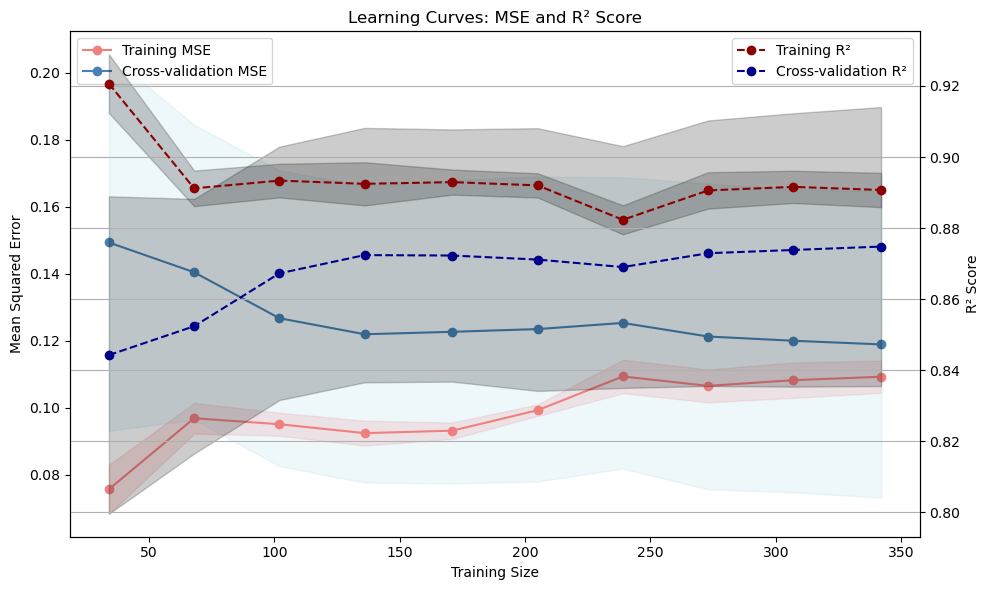

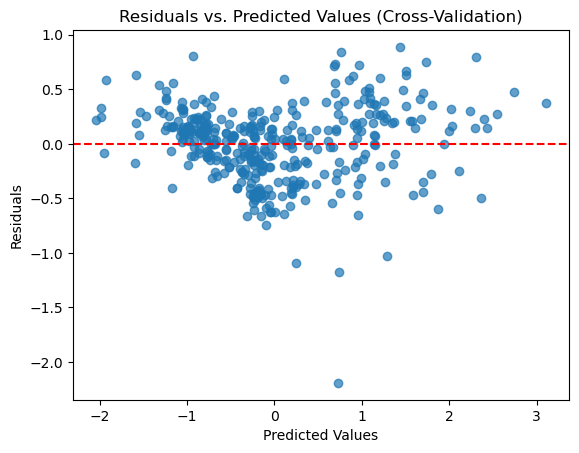

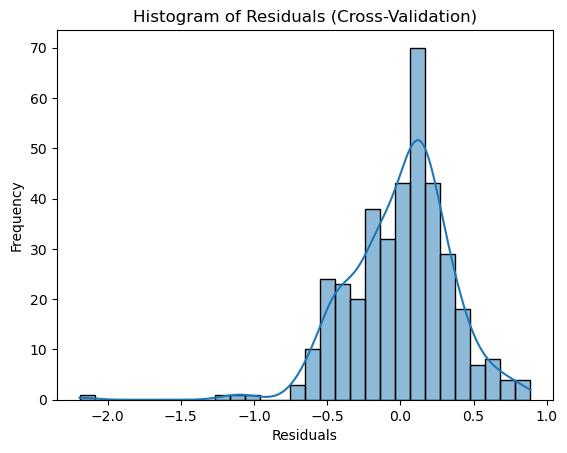

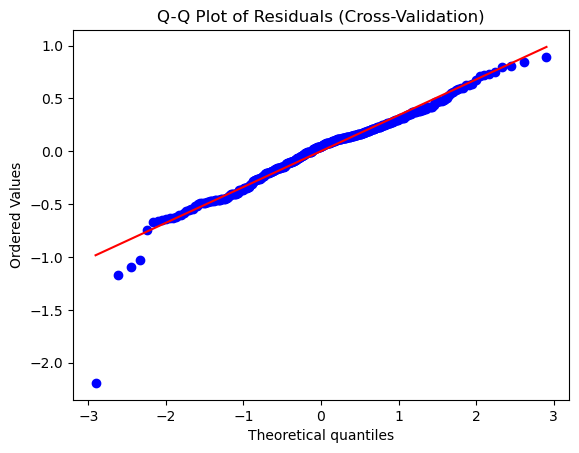

In [31]:
# Call the Function
model_analysis(best_model, r2_initial, mse_initial)

**Comment**

*Training set (excl. validation set):*
<br> R² Score: 0.893, MSE Score: 0.107 (before tuning)
<br> R² Score: 0.891, MSE Score: 0.109 (after tuning)

*Change (Training set):*
<br> R² Score: -0.2%, MSE Score: +1.9%

*Validation set (cv test):*
<br> R² Score: 0.873, MSE Score: 0.120 (before tuning)
<br> R² Score: 0.875, MSE Score: 0.119 (after tuning)

*Change (Validation set):*
<br> R² Score: +0.2%, MSE Score: -0.8%

*Percental differences between `Training`and `Validation` scores (tuned) - Overfitting or Not (R² Score: <5%, MSE Score: <10%)*
<br> R² Score: 2% (Ok!)
<br> MSE Score: -8% (Ok!)

**Conclusion**
- After moving from `LinReg` model to `Elastic Net` (with l1=1, effectively `Lasso`), we can see that we have *identical* scores to the SGD Regression. 
- The `Elastic Net` validation score scores a bit higher than the `LineReg` model, so we choose the former model.
- No *overfitting* to speak of.

#### 4.2.5 Final Evaluation

In [32]:
# Call the Function
final_evaluation(best_model, r2_initial, mse_initial)

Initial R² Score - Test: 0.915
Tuned R² Score - Train: 0.890
Tuned R² Score - Test: 0.914
Performance change: R² Score - test: -0.0%

Initial MSE Score - Test: 0.100
Tuned MSE Score - Train: 0.110
Tuned MSE Score - Test: 0.100
Performance change: MSE Score - test: 0.2%


**Comment**
- Even though the tuned models showed a very small positive change for the `Elastic Net` model over the `LineReg` model, we can see that when we evaluate on the test set, we get a slightly worse result.
- We will keep the `Elastic Net` as it is slightly better on a larger set

### 4.3 Decision Tree Regressor

#### 4.3.1 Initial Model Training and Evaluation

In [33]:
# Initialize the model
model = DecisionTreeRegressor(random_state=42)

# Call the Function
r2_initial, mse_initial = evaluate_model(model)

R² Score - test (untuned): 0.860
MSE Score - test (untuned): 0.163


**Comment**
<br> The result is quite good, but worse compared to `Linear Regressor()`.

#### 4.3.2 Overfitting/Underfitting (untuned model)

To check for overfitting and underfitting, we will look at:
1. Compare Training and Test Performance
2. Learning Curves
3. Residual Analysis

Comparison between train and test scores:

R² Score - train: 0.999
R² Score - test: 0.860
MSE Score - train: 0.001
MSE Score - test: 0.163

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34        -0.000           0.300        1.000          0.693
            68         0.001           0.293        0.999          0.689
           102         0.000           0.215        1.000          0.774
           136         0.001           0.167        0.999          0.824
           171         0.001           0.160        0.999          0.830
           205         0.001           0.163        0.999          0.827
           239         0.001           0.229        0.999          0.767
           273         0.001           0.166        0.999          0.825
           307         0.001           0.167        0.999          0.824
           342         0.001           0.175        0.999          0.812


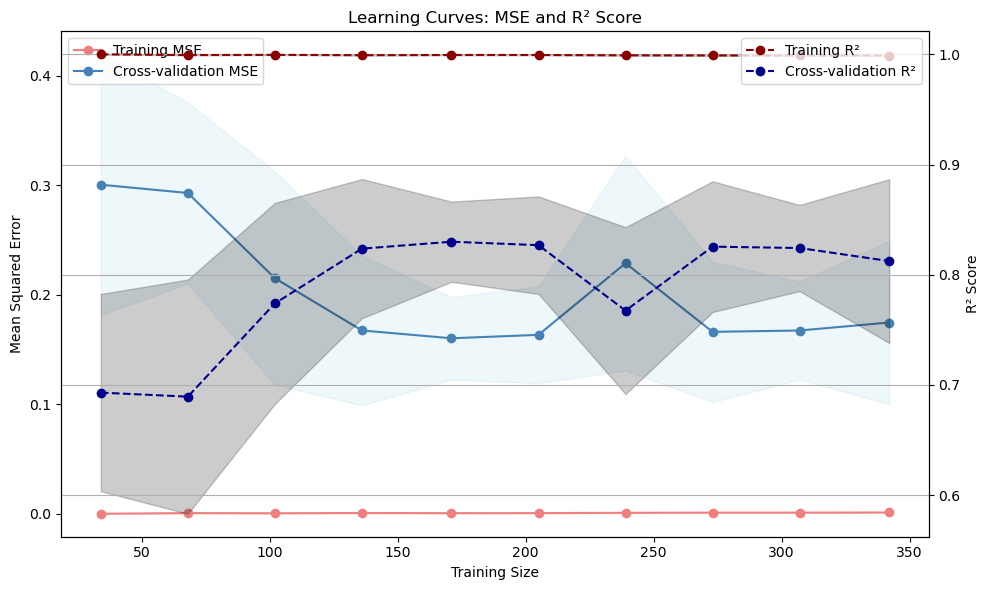

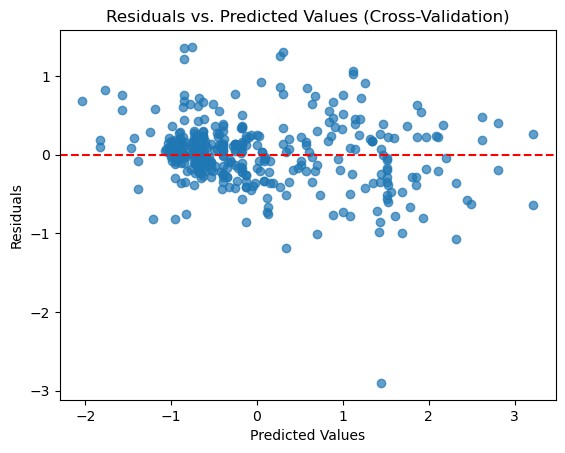

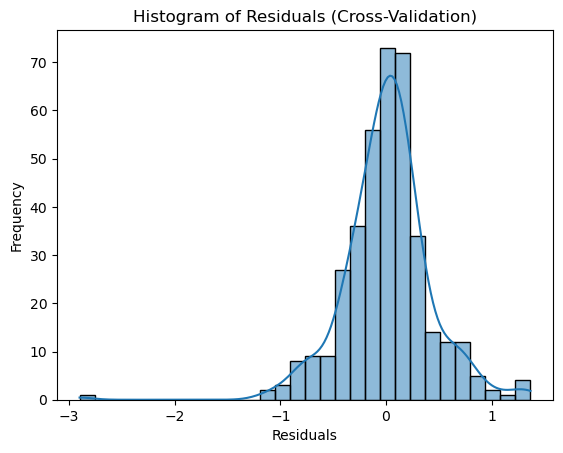

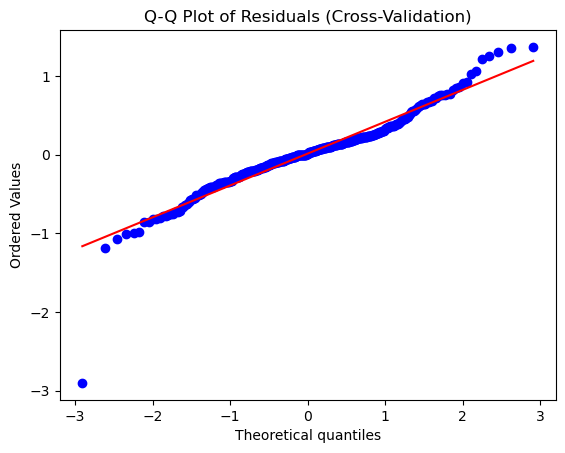

In [34]:
# Fit the Model to the Training Data
model.fit(X_train_scaled, y_train_scaled)

# Call the Function
model_analysis(model, r2_initial, mse_initial)

**Comment**
<br> *Compare Training and Test Performance*
- The scores for the training value indicates that the model fits the training data *extremely well*, almost perfectly. This indicates that it has likely learned the training data, including its noise.
- The sharp contrast between the training and test metrics indicates *overfitting*. The model has learned the training data too well, including its noise and outliers, which results in poor performance on the test set.

*Learning Curve* 
<br> In summary, the untuned Decision Tree Regressor exhibits a strong ability to fit training data perfectly but *struggles* to generalize to unseen data, as evidenced by the significant gap between training and validation performance. 
<br> The learning curves indicate *potential overfitting*, and further tuning or regularization methods may be necessary to enhance model performance and ensure better consistency in validation results. 
<br> Adjusting hyperparameters such as maximum depth or minimum samples per leaf could help mitigate overfitting and improve the model's predictive power on unseen data.

*Residual Plots*
<br> The plots are better than for the `SGDRegressor` and the `LinearRegressor()` model. 
- The *Residial Plot* has its points randomly scattered around the 0-line. This is good as it suggests that the model has captured the overall pattern well.
- The histogram looks as if the residuals have a normal distribution
- The Q-Q Plot has its points on the line, except for in the lower theoretical quantiles. This indicates that I may have issues with the tails and outliers.  

#### 4.3.3 Hyperparameter Tuning

We will now try out some hyperparameters.

In [35]:
# Initialize the model
model = DecisionTreeRegressor(random_state=42)

# Set up the Hyperparameter Grid
param_grid = {
    'criterion': ['absolute_error', 'squared_error', 'friedman_mse'],   # Function to measure the quality of a split
    'max_depth': [None, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10],            # Limits the depth of the tree
    'max_features': [20, 'sqrt', 'log2'],     # Number of features to consider when looking for the best split
    'min_samples_leaf': [5, 6, 7],            # Minimum samples required to be at a leaf node
    'min_samples_split': [2, 3]               # Minimum samples required to split an internal node
}

# Call the Function
best_model, best_params = tune_hyperparameters(model, param_grid)

Fitting 10 folds for each of 594 candidates, totalling 5940 fits
Average R² Score: 0.869 (± 0.060)
Average MSE Score: 0.123 (± 0.067)

Best Hyperparameters:
criterion: squared_error
max_depth: 8
max_features: 20
min_samples_leaf: 6
min_samples_split: 2


**Comment**
<br> It looks as it the model is perhaps not picking up as much noise as before. 
<br> Let's look at overfitting/underfitting for the tuned model.

#### 4.3.4 Overfitting/Underfitting (tuned model)

Comparison between train and test scores:

R² Score - train: 0.944
R² Score - test: 0.860
MSE Score - train: 0.056
MSE Score - test: 0.163

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34         0.139           0.317        0.853          0.675
            68         0.101           0.262        0.887          0.729
           102         0.086           0.221        0.903          0.770
           136         0.057           0.170        0.934          0.822
           171         0.056           0.177        0.936          0.812
           205         0.065           0.170        0.929          0.822
           239         0.073           0.164        0.922          0.831
           273         0.066           0.163        0.932          0.825
           307         0.069           0.137        0.931          0.855
           342         0.061           0.123        0.939          0.869


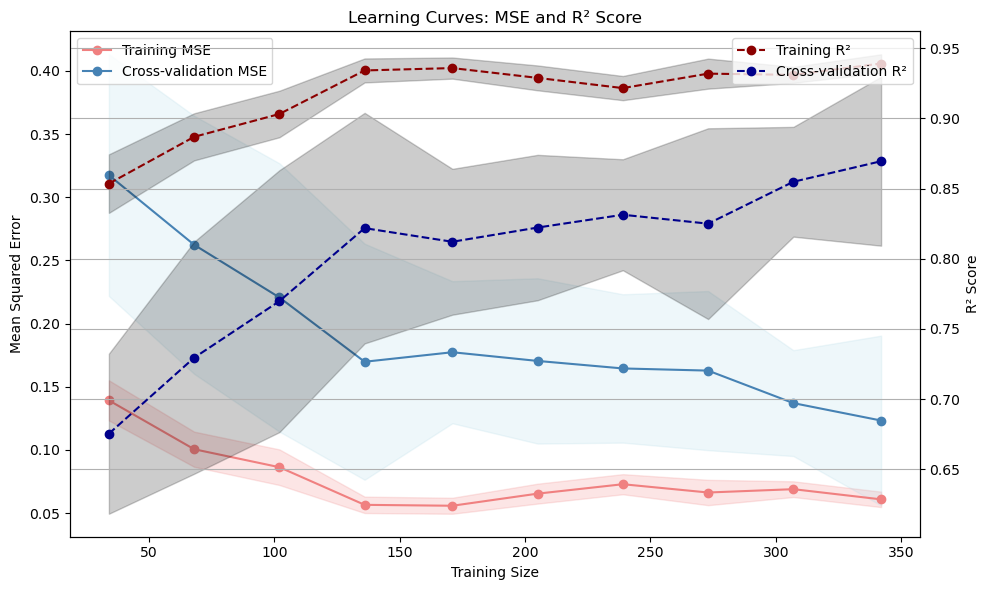

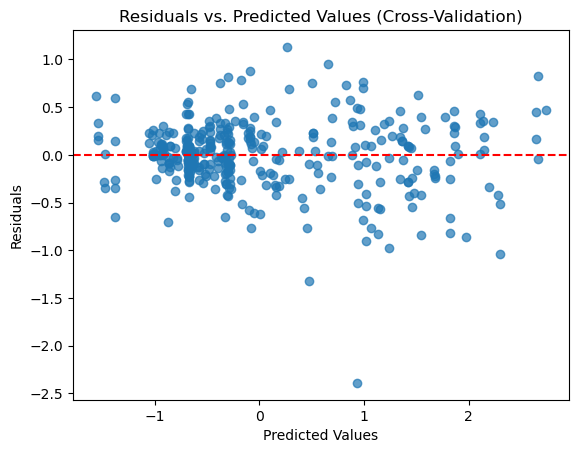

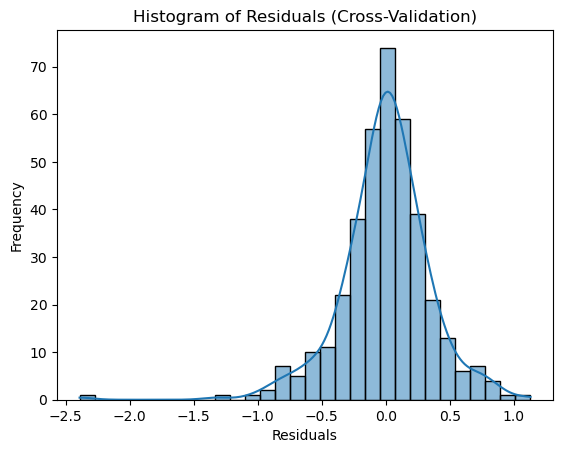

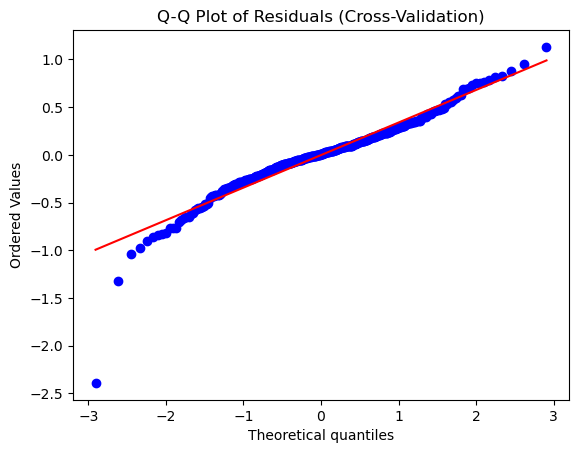

In [36]:
# Call the Function
model_analysis(best_model, r2_initial, mse_initial)

**Comment**

*Training set (excl. validation set):*
<br> R² Score: 0.999, MSE Score: 0.001 (before tuning)
<br> R² Score: 0.939, MSE Score: 0.061 (after tuning)

*Change (Training set):*
<br> R² Score: -6.0%, MSE Score: +6000%

*Validation set (cv test):*
<br> R² Score: 0.812, MSE Score: 0.175 (before tuning)
<br> R² Score: 0.869, MSE Score: 0.123 (after tuning)

*Change (Validation set):*
<br> R² Score: +7.0%, MSE Score: -29.7%

*Percental differences between `Training`and `Validation` scores (tuned) - Overfitting or Not (R² Score: <5%, MSE Score: <10%)*
<br> R² Score: 8% (Not ok!)
<br> MSE Score: -50% (Not ok!)

**Conclusion**
- The most important scores are the `Validation` scores, that we can se improve significantly after tuning.
- But the we are not within the boundries for not seing overfitting
- We need to tweak the parameters to get rid of the *overfit*

In [37]:
best_params

{'criterion': 'squared_error',
 'max_depth': 8,
 'max_features': 20,
 'min_samples_leaf': 6,
 'min_samples_split': 2}

In [78]:
# Initialize the model
model = DecisionTreeRegressor(random_state=42)

# Set up the Hyperparameter Grid
param_grid = {
    'criterion': ['squared_error'],   # Function to measure the quality of a split
    'max_depth': [8],            # Limits the depth of the tree
    'max_features': [20],     # Number of features to consider when looking for the best split
    'min_samples_leaf': [17],            # Minimum samples required to be at a leaf node
    'min_samples_split': [2]               # Minimum samples required to split an internal node
}

# Call the Function
best_model, best_params = tune_hyperparameters(model, param_grid)

Fitting 10 folds for each of 1 candidates, totalling 10 fits
Average R² Score: 0.835 (± 0.062)
Average MSE Score: 0.155 (± 0.067)

Best Hyperparameters:
criterion: squared_error
max_depth: 8
max_features: 20
min_samples_leaf: 17
min_samples_split: 2


Comparison between train and test scores:

R² Score - train: 0.883
R² Score - test: 0.860
MSE Score - train: 0.117
MSE Score - test: 0.163

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34         0.550           0.666        0.430          0.336
            68         0.205           0.320        0.769          0.667
           102         0.172           0.281        0.808          0.717
           136         0.169           0.254        0.803          0.738
           171         0.143           0.233        0.836          0.756
           205         0.135           0.201        0.854          0.790
           239         0.140           0.182        0.849          0.814
           273         0.124           0.170        0.872          0.824
           307         0.122           0.150        0.877          0.842
           342         0.118           0.155        0.881          0.835


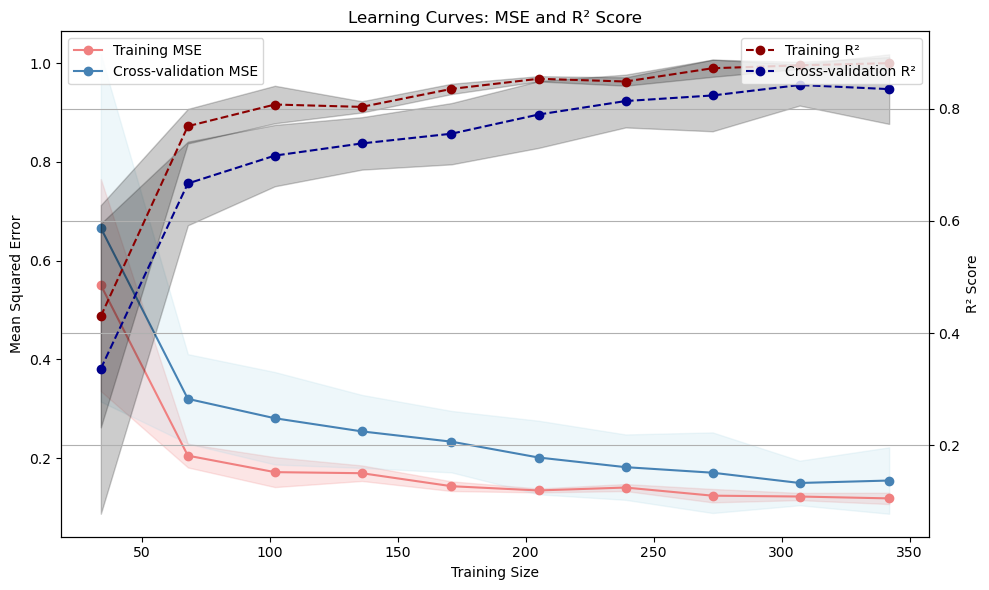

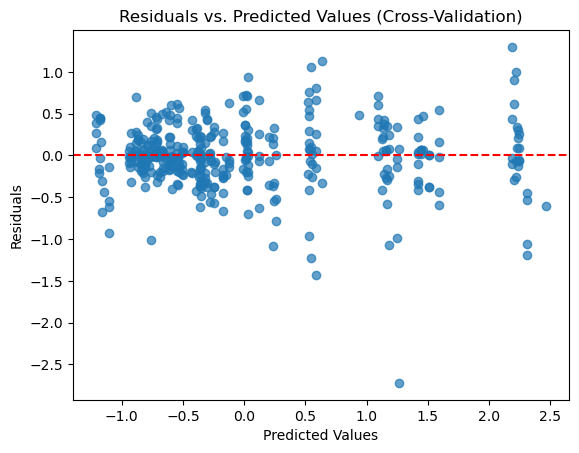

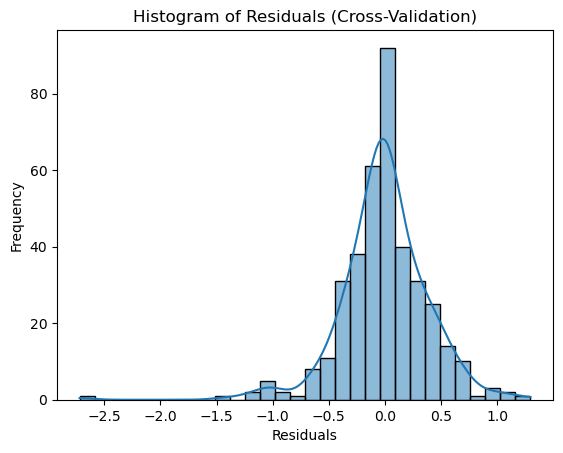

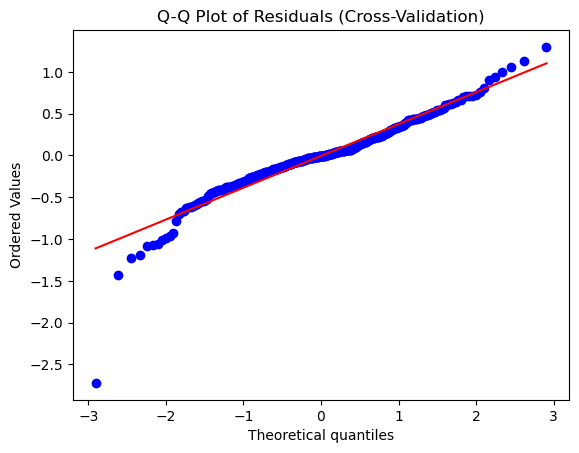

In [79]:
# Call the Function
model_analysis(best_model, r2_initial, mse_initial)

**Comment**
<br> After some adjustments of `min_samle_split` (increase from 6 to 17), we have taken care of most of the overfitting.
<br> Note that the learning curves now converge and are close to each other, which indicates a fairly good model fit.
<br> Let's look at the numbers.

*Training set (excl. validation set):*
<br> R² Score: 0.999, MSE Score: 0.001 (before tuning)
<br> R² Score: 0.881, MSE Score: 0.118 (after tuning)

*Change (Training set):*
<br> R² Score: -11.8%, MSE Score: +11700%

*Validation set (cv test):*
<br> R² Score: 0.812, MSE Score: 0.175 (before tuning)
<br> R² Score: 0.835, MSE Score: 0.155 (after tuning)

*Change (Validation set):*
<br> R² Score: +2.8%, MSE Score: -11.4%

*Percental differences between `Training`and `Validation` scores (tuned) - Overfitting or Not (R² Score: <5%, MSE Score: <10%)*
<br> R² Score: 6% (max 5% to be ok)
<br> MSE Score: -24% (max -10% to be ok)

**Conclusion**
- The most important scores are the `Validation` scores, that we can see it improve significantly after tuning.
- But the we are not within the boundries for not seing overfitting
- But here we can't force away the *overfitting* as it leads to unacceptable poor scores
- We have to be ok with some degree of *overfitting* when applying a complex model to a small dataset 

#### 4.3.5 Final Evaluation

We now run our parameter-optimized model with our test data.

In [81]:
# Call the Function
final_evaluation(best_model, r2_initial, mse_initial)

Initial R² Score - Test: 0.860
Tuned R² Score - Train: 0.883
Tuned R² Score - Test: 0.841
Performance change: R² Score - test: -2.2%

Initial MSE Score - Test: 0.163
Tuned MSE Score - Train: 0.117
Tuned MSE Score - Test: 0.185
Performance change: MSE Score - test: 13.3%


**Comment**
- Although the model works a lot better on new data (converging validation score), the scores are not that impressive (high MSE score for test set (tuned model)). 

### 4.4 Polynomial Regression

#### 4.4.1 Initial Model Training and Evaluation

In [82]:
# Transforming the features
degree = 2  # Change this to the desired polynomial degree
poly_features = PolynomialFeatures(degree=degree)

# Fit and transform the training data
X_poly_train = poly_features.fit_transform(X_train_scaled)

# Initialize the model
model = LinearRegression()

# Define the new evaluation function
def evaluate_model_poly(model, X, y):
    # Fit the model to the transformed training data
    model.fit(X, y)

    # Predict on the test data (transform the test set similarly)
    X_poly_test = poly_features.transform(X_test_scaled)
    y_pred = model.predict(X_poly_test)

    # Evaluate the model
    mse_initial = mean_squared_error(y_test_scaled, y_pred)
    r2_initial = r2_score(y_test_scaled, y_pred)

    # Print results
    print(f'R² Score: {r2_initial:.3f}')
    print(f'Mean Squared Error: {mse_initial:.3f}')

    return r2_initial, mse_initial

# Call the Function
r2_initial, mse_initial = evaluate_model_poly(model, X_poly_train, y_train_scaled)

R² Score: -1096657148093348608.000
Mean Squared Error: 1280537341059048448.000


**Comment**
- Well that didn't really work. Maybe due to lack of convergence.
- Let's try `Ridge`, `Lasso`, and `Elastic Net`. 

In [83]:
# Initialize the model
model = Ridge()

# Call the Function
r2_initial, mse_initial = evaluate_model_poly(model, X_poly_train, y_train_scaled)

R² Score: 0.540
Mean Squared Error: 0.537


**Comment**
- Not great, but much better.

In [84]:
# Initialize the model
model = Lasso()

# Call the Function
r2_initial, mse_initial = evaluate_model_poly(model, X_poly_train, y_train_scaled)

R² Score: 0.048
Mean Squared Error: 1.112


**Comment**
- Really poor result.

In [85]:
# Initialize the model
model = ElasticNet(random_state=42)

# Call the Function
r2_initial, mse_initial = evaluate_model_poly(model, X_poly_train, y_train_scaled)

R² Score: 0.437
Mean Squared Error: 0.657


**Comment**
- Looks like we may want to go for Elastic Net as it is stable, and then will hyperparameter tune it, to see what we will get.

#### 4.4.2 Overfitting/Underfitting (untunded model)

To check for overfitting and underfitting, we will look at:
1. Compare Training and Test Performance
2. Learning Curves
3. Residual Analysis

Comparison between train and test scores:

R² Score - train: 0.468
R² Score - test: 0.437
MSE Score - train: 0.532
MSE Score - test: 0.657

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34         0.495           0.619        0.478          0.365
            68         0.529           0.627        0.404          0.363
           102         0.529           0.627        0.406          0.365
           136         0.532           0.639        0.380          0.350
           171         0.517           0.621        0.405          0.362
           205         0.527           0.585        0.427          0.399
           239         0.543           0.593        0.414          0.393
           273         0.528           0.566        0.457          0.417
           307         0.532           0.544        0.467          0.442
           342         0.532           0.547        0.467          0.436


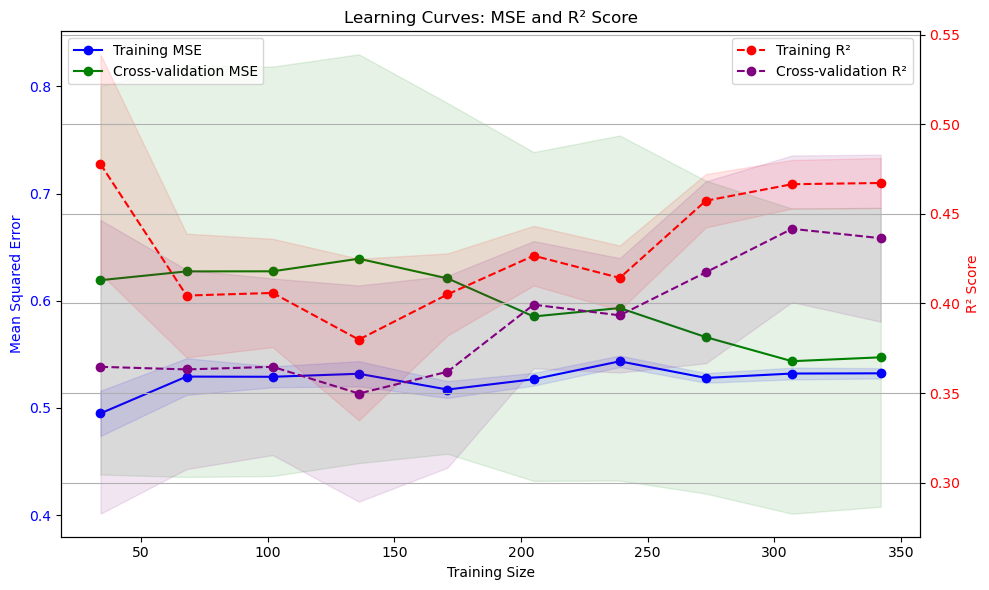

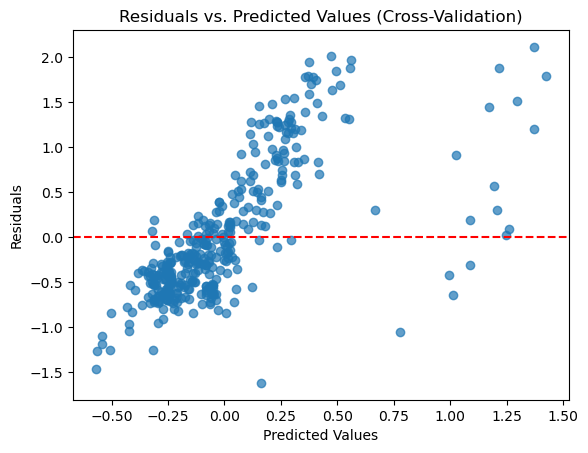

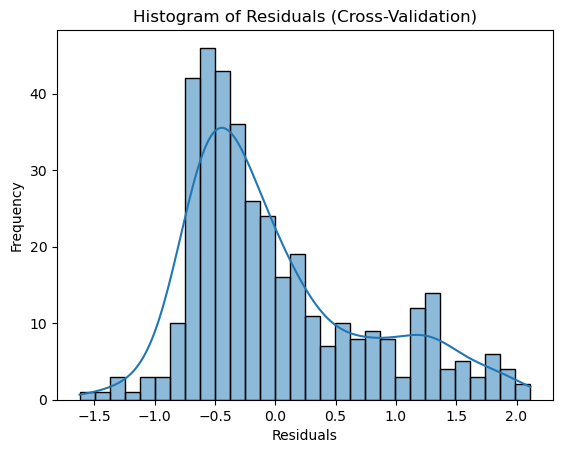

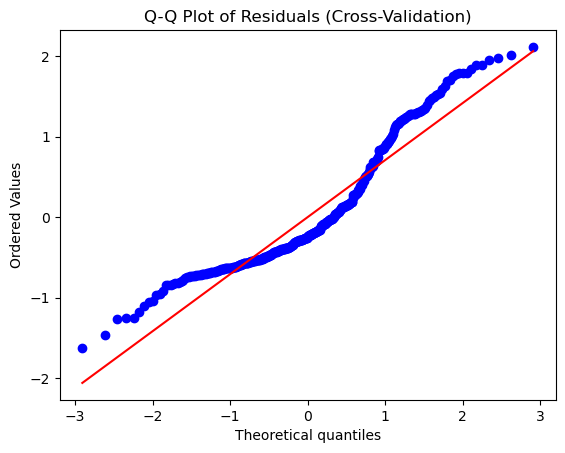

In [86]:
# Initialize the Model
X_poly_train = poly_features.transform(X_train_scaled)
model = ElasticNet(random_state=42)

# Fit the model to the polynomial training data
model.fit(X_poly_train, y_train_scaled)  

# Predict on training data
y_train_pred = model.predict(X_poly_train)

def poly_model_analysis(model, r2_test, mse_test):
    
    ''' Purpose: By comparing performance on the training set and the test set, we can quickly identify overfitting (if the model performs significantly better on the training set) 
    or underfitting (if the model performs poorly on both the training and test sets).
    '''    
        # Subfunction to compare training and test performance
    def compare_performance():
        
        # Calculate metrics for training set
        mse_train = mean_squared_error(y_train_scaled, y_train_pred)
        r2_train = r2_score(y_train_scaled, y_train_pred)

        # Print results
        print(f'Comparison between train and test scores:\n')
        print(f'R² Score - train: {r2_train:.3f}')
        print(f'R² Score - test: {r2_test:.3f}')
        print(f'MSE Score - train: {mse_train:.3f}')
        print(f'MSE Score - test: {mse_test:.3f}')

        return r2_train, mse_train

       
    ''' Purpose: The learning curves help visualize how the model performance evolves with increasing training data size. 
    They give insight into whether adding more data could improve the model or if it's already saturated.
    '''   
    
    # Subfunction to plot learning curves for both MSE and R²
    def plot_learning_curve():
        # Learning curve for MSE
        train_sizes, train_scores_mse, test_scores_mse = learning_curve(
            model, X_poly_train, y_train_scaled,
            n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10),
            cv=kfold, scoring='neg_mean_squared_error'
        )

        # Learning curve for R²
        train_sizes_r2, train_scores_r2, test_scores_r2 = learning_curve(
            model, X_poly_train, y_train_scaled,
            n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10),
            cv=kfold, scoring='r2'
        )

        # Convert negative MSE to positive
        train_scores_mse_mean = -train_scores_mse.mean(axis=1)
        test_scores_mse_mean = -test_scores_mse.mean(axis=1)

        train_scores_r2_mean = train_scores_r2.mean(axis=1)
        test_scores_r2_mean = test_scores_r2.mean(axis=1)

        # Create a DataFrame for learning curve values
        learning_curve_df = pd.DataFrame({
            'Training Size': train_sizes.astype(int),
            'Training MSE': train_scores_mse_mean.round(3),
            'Validation MSE': test_scores_mse_mean.round(3),
            'Training R²': train_scores_r2_mean.round(3),
            'Validation R²': test_scores_r2_mean.round(3)
        })
    
        # Print the learning curve values in a table format
        print("\nLearning Curves:\n")
        print(learning_curve_df.to_string(index=False))
        
        # Plot with twin axes
        fig, ax1 = plt.subplots(figsize=(10, 6))

        # Plot MSE learning curve
        ax1.plot(train_sizes, train_scores_mse_mean, 'o-', color='blue', label='Training MSE')
        ax1.plot(train_sizes, test_scores_mse_mean, 'o-', color='green', label='Cross-validation MSE')
        ax1.fill_between(train_sizes, 
                         train_scores_mse_mean - train_scores_mse.std(axis=1),
                         train_scores_mse_mean + train_scores_mse.std(axis=1), 
                         alpha=0.1, color='blue')
        ax1.fill_between(train_sizes, 
                         test_scores_mse_mean - test_scores_mse.std(axis=1),
                         test_scores_mse_mean + test_scores_mse.std(axis=1), 
                         alpha=0.1, color='green')
        ax1.set_xlabel('Training Size')
        ax1.set_ylabel('Mean Squared Error', color='blue')
        ax1.tick_params(axis='y', labelcolor='blue')

        # Create twin axis for R²-score
        ax2 = ax1.twinx()
        ax2.plot(train_sizes_r2, train_scores_r2_mean, 'o--', color='red', label='Training R²')
        ax2.plot(train_sizes_r2, test_scores_r2_mean, 'o--', color='purple', label='Cross-validation R²')
        ax2.fill_between(train_sizes_r2,
                         train_scores_r2_mean - train_scores_r2.std(axis=1),
                         train_scores_r2_mean + train_scores_r2.std(axis=1),
                         alpha=0.1, color='red')
        ax2.fill_between(train_sizes_r2,
                         test_scores_r2_mean - test_scores_r2.std(axis=1),
                         test_scores_r2_mean + test_scores_r2.std(axis=1),
                         alpha=0.1, color='purple')
        ax2.set_ylabel('R² Score', color='red')
        ax2.tick_params(axis='y', labelcolor='red')

        # Add titles and legends
        plt.title('Learning Curves: MSE and R² Score')
        fig.tight_layout()  # Adjust layout to make space for both axes

        ax1.legend(loc='upper left')
        ax2.legend(loc='upper right')

        plt.grid()
        plt.show()


    
    # Subfunction for residual analysis
    def residual_analysis():
        # Perform cross-validation and get predictions for each validation fold
        y_val_pred = cross_val_predict(model, X_poly_train, y_train_scaled, cv=kfold)

        # Calculate residuals: difference between actual and predicted values
        residuals = y_train_scaled - y_val_pred

        # 1. Residuals vs Predicted Values
        plt.scatter(y_val_pred, residuals, alpha=0.7)
        plt.axhline(y=0, color='red', linestyle='--')
        plt.title('Residuals vs. Predicted Values (Cross-Validation)')
        plt.xlabel('Predicted Values')
        plt.ylabel('Residuals')
        plt.show()

        # 2. Histogram of Residuals
        sns.histplot(residuals, bins=30, kde=True)
        plt.title('Histogram of Residuals (Cross-Validation)')
        plt.xlabel('Residuals')
        plt.ylabel('Frequency')
        plt.show()

        # 3. Q-Q Plot of Residuals
        stats.probplot(residuals, dist="norm", plot=plt)
        plt.title('Q-Q Plot of Residuals (Cross-Validation)')
        plt.show()

    # Call the subfunctions
    compare_performance()
    plot_learning_curve()
    residual_analysis()


# Call the Function
poly_model_analysis(model, r2_initial, mse_initial)

**Comment**
<br> *Compare Training and Test Performance*
- Very high MSE and quite low R² Scores.
- Underfitting suspected, due to low R² Scores.

*Learning Curve* 
- Even if the curves converge and are close to each other, we can see underfitting as a result of poor result for Training and Validation sets.
- The convergence of both metrics suggests that the model is learning effectively, but the relatively low R² score (around 0.45) indicates that the model explains only a small fraction of the variance in the data.
- This may imply that the relationship between features and the target variable is not being fully captured.

*Residual Plots*
<br> The plots are way worse than we have seen before. 
- The positive linear trend in the residuals suggests that the model may be systematically underestimating or overestimating predictions.
<br> This indicates a potential issue with model bias, implying that the model might not be capturing the underlying relationship in the data effectively.
- The positive skewness of the histogram suggests that there are more significant positive errors (overpredictions) than negative errors (underpredictions).
<br> This can lead to issues in interpretation and might signal that the model may benefit from transformations or more complex interactions.
- The points deviating from the line at lower quantiles indicate that the model struggles to predict smaller values accurately, while the behavior at higher quantiles suggests it might be overpredicting for larger values.
<br> This reinforces the idea of potential model bias.  

#### 4.4.3 Hyperparameter Tuning

We will now try out some hyperparameters.

In [87]:
def poly_tune_hyperparameters(model, param_grid, scoring=make_scorer(mean_squared_error, greater_is_better=False), cv=kfold):
    """
    Function to perform hyperparameter tuning using GridSearchCV and print results.

    Parameters:
    - model: The machine learning model to tune.
    - param_grid: A dictionary of hyperparameters to tune.
    - scoring: Scoring metric for evaluating the models (default is MSE).
    - cv: Number of cross-validation folds (default is 10).

    Returns:
    - best_model: The best model after hyperparameter tuning.
    - best_params: The best hyperparameters found.
    """
    
    # Initialize GridSearchCV
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid,
                               scoring=scoring, cv=cv, n_jobs=-1)

    # Fit GridSearchCV using globally defined X_train_scaled and y_train_scaled
    grid_search.fit(X_poly_train, y_train_scaled)

    # Get the best parameters and model
    best_params = grid_search.best_params_
    best_model = grid_search.best_estimator_

    # Perform cross-validation with the best model to evaluate MSE
    mse_cv_results = cross_val_score(best_model, X_poly_train, y_train_scaled, cv=cv, scoring='neg_mean_squared_error')
    mse_cv_results = -mse_cv_results  # Convert negative MSE to positive

    # Calculate the mean and standard deviation of the cross-validated MSE
    mean_mse = np.mean(mse_cv_results)
    std_mse = np.std(mse_cv_results)

    # Perform cross-validation with the best model to evaluate R²
    r2_cv_results = cross_val_score(best_model, X_poly_train, y_train_scaled, cv=cv, scoring='r2')

    # Calculate the mean and standard deviation of the cross-validated R² scores
    mean_r2 = np.mean(r2_cv_results)
    std_r2 = np.std(r2_cv_results)

    # Print results
    print(f"Average R² Score: {mean_r2:.3f} (± {std_r2:.3f})")
    print(f"Mean Squared Error: {mean_mse:.3f} (± {std_mse:.3f})\n")
    print("Best Hyperparameters:")
    for key, value in best_params.items():
        print(f"{key}: {value}")

    return best_model, best_params


# Initialize the Model
model = ElasticNet(random_state=42)

# Set up the Hyperparameter Grid
param_grid = {
    'alpha': [0.01, 0.1, 1, 10, 100],          # Regularization strength
    'l1_ratio': [0.0, 0.25, 0.5, 0.75, 1.0],  # L1/L2 mix
}

# Call the Function
best_model, best_params = poly_tune_hyperparameters(model, param_grid)

Average R² Score: 0.884 (± 0.050)
Mean Squared Error: 0.111 (± 0.058)

Best Hyperparameters:
alpha: 0.1
l1_ratio: 0.25


**Comment**
<br> It does look significantly better now. Let's see how well its learning curves look.

#### 4.4.4 Overfitting/Underfitting (tuned model)

Comparison between train and test scores:

R² Score - train: 0.910
R² Score - test: 0.437
MSE Score - train: 0.090
MSE Score - test: 0.657

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34         0.038           0.190        0.960          0.803
            68         0.058           0.164        0.935          0.833
           102         0.065           0.126        0.927          0.870
           136         0.067           0.124        0.922          0.870
           171         0.073           0.121        0.916          0.875
           205         0.077           0.114        0.916          0.883
           239         0.082           0.119        0.912          0.875
           273         0.082           0.113        0.916          0.882
           307         0.084           0.111        0.916          0.884
           342         0.088           0.111        0.912          0.884


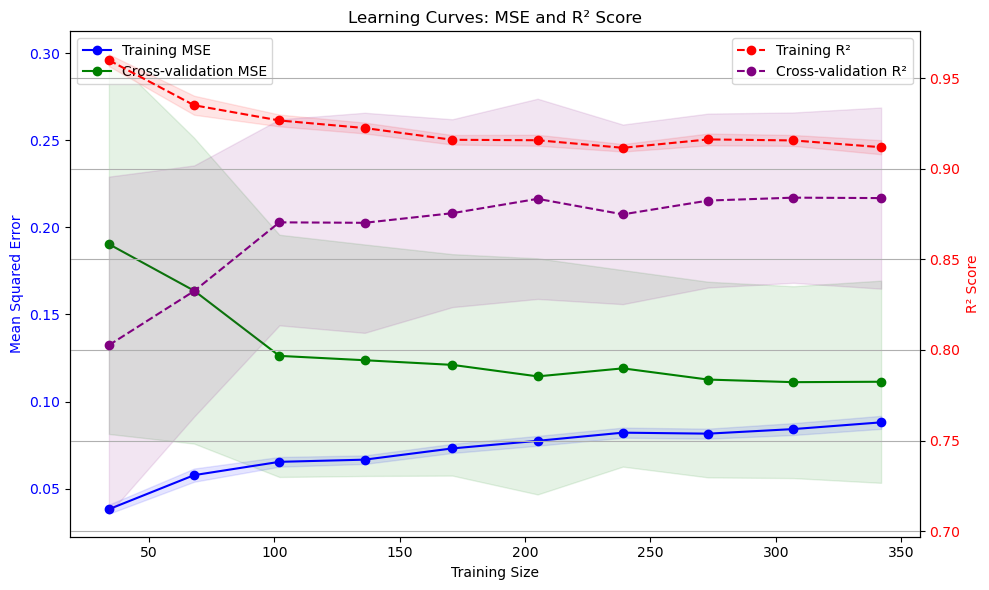

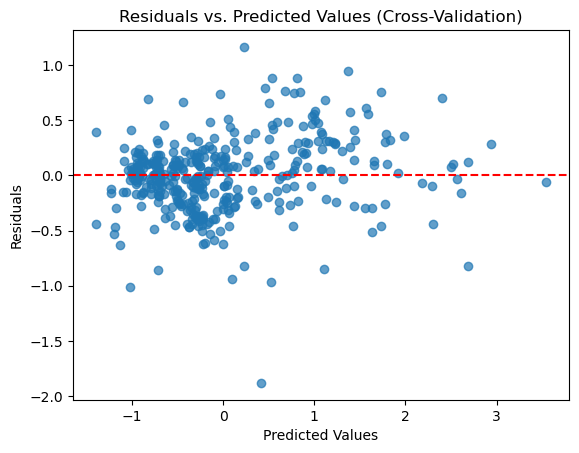

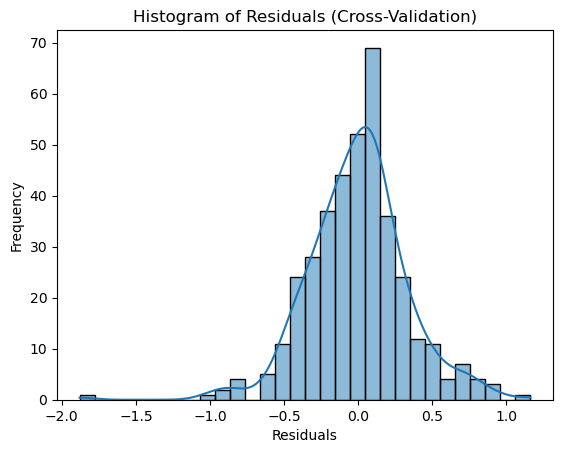

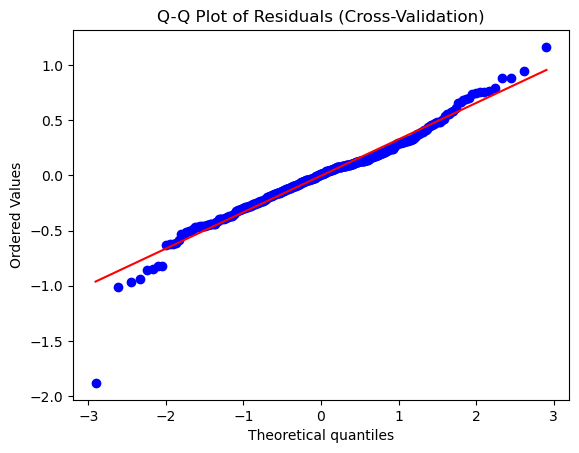

In [88]:
# Fit the model to the polynomial training data
best_model.fit(X_poly_train, y_train_scaled)  

# Predict on training data
y_train_pred = best_model.predict(X_poly_train)

def poly_model_analysis(model, r2_test, mse_test):
    
    ''' Purpose: By comparing performance on the training set and the test set, we can quickly identify overfitting (if the model performs significantly better on the training set) 
    or underfitting (if the model performs poorly on both the training and test sets).
    '''    
        # Subfunction to compare training and test performance
    def compare_performance():
        
        # Calculate metrics for training set
        mse_train = mean_squared_error(y_train_scaled, y_train_pred)
        r2_train = r2_score(y_train_scaled, y_train_pred)

        # Print results
        print(f'Comparison between train and test scores:\n')
        print(f'R² Score - train: {r2_train:.3f}')
        print(f'R² Score - test: {r2_test:.3f}')
        print(f'MSE Score - train: {mse_train:.3f}')
        print(f'MSE Score - test: {mse_test:.3f}')

        return r2_train, mse_train

       
    ''' Purpose: The learning curves help visualize how the model performance evolves with increasing training data size. 
    They give insight into whether adding more data could improve the model or if it's already saturated.
    '''   
    
    # Subfunction to plot learning curves for both MSE and R²
    def plot_learning_curve():
        # Learning curve for MSE
        train_sizes, train_scores_mse, test_scores_mse = learning_curve(
            model, X_poly_train, y_train_scaled,
            n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10),
            cv=kfold, scoring='neg_mean_squared_error'
        )

        # Learning curve for R²
        train_sizes_r2, train_scores_r2, test_scores_r2 = learning_curve(
            model, X_poly_train, y_train_scaled,
            n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10),
            cv=kfold, scoring='r2'
        )

        # Convert negative MSE to positive
        train_scores_mse_mean = -train_scores_mse.mean(axis=1)
        test_scores_mse_mean = -test_scores_mse.mean(axis=1)

        train_scores_r2_mean = train_scores_r2.mean(axis=1)
        test_scores_r2_mean = test_scores_r2.mean(axis=1)

        # Create a DataFrame for learning curve values
        learning_curve_df = pd.DataFrame({
            'Training Size': train_sizes.astype(int),
            'Training MSE': train_scores_mse_mean.round(3),
            'Validation MSE': test_scores_mse_mean.round(3),
            'Training R²': train_scores_r2_mean.round(3),
            'Validation R²': test_scores_r2_mean.round(3)
        })
    
        # Print the learning curve values in a table format
        print("\nLearning Curves:\n")
        print(learning_curve_df.to_string(index=False))
        
        # Plot with twin axes
        fig, ax1 = plt.subplots(figsize=(10, 6))

        # Plot MSE learning curve
        ax1.plot(train_sizes, train_scores_mse_mean, 'o-', color='blue', label='Training MSE')
        ax1.plot(train_sizes, test_scores_mse_mean, 'o-', color='green', label='Cross-validation MSE')
        ax1.fill_between(train_sizes, 
                         train_scores_mse_mean - train_scores_mse.std(axis=1),
                         train_scores_mse_mean + train_scores_mse.std(axis=1), 
                         alpha=0.1, color='blue')
        ax1.fill_between(train_sizes, 
                         test_scores_mse_mean - test_scores_mse.std(axis=1),
                         test_scores_mse_mean + test_scores_mse.std(axis=1), 
                         alpha=0.1, color='green')
        ax1.set_xlabel('Training Size')
        ax1.set_ylabel('Mean Squared Error', color='blue')
        ax1.tick_params(axis='y', labelcolor='blue')

        # Create twin axis for R²-score
        ax2 = ax1.twinx()
        ax2.plot(train_sizes_r2, train_scores_r2_mean, 'o--', color='red', label='Training R²')
        ax2.plot(train_sizes_r2, test_scores_r2_mean, 'o--', color='purple', label='Cross-validation R²')
        ax2.fill_between(train_sizes_r2,
                         train_scores_r2_mean - train_scores_r2.std(axis=1),
                         train_scores_r2_mean + train_scores_r2.std(axis=1),
                         alpha=0.1, color='red')
        ax2.fill_between(train_sizes_r2,
                         test_scores_r2_mean - test_scores_r2.std(axis=1),
                         test_scores_r2_mean + test_scores_r2.std(axis=1),
                         alpha=0.1, color='purple')
        ax2.set_ylabel('R² Score', color='red')
        ax2.tick_params(axis='y', labelcolor='red')

        # Add titles and legends
        plt.title('Learning Curves: MSE and R² Score')
        fig.tight_layout()  # Adjust layout to make space for both axes

        ax1.legend(loc='upper left')
        ax2.legend(loc='upper right')

        plt.grid()
        plt.show()


    
    # Subfunction for residual analysis
    def residual_analysis():
        # Perform cross-validation and get predictions for each validation fold
        y_val_pred = cross_val_predict(model, X_poly_train, y_train_scaled, cv=kfold)

        # Calculate residuals: difference between actual and predicted values
        residuals = y_train_scaled - y_val_pred

        # 1. Residuals vs Predicted Values
        plt.scatter(y_val_pred, residuals, alpha=0.7)
        plt.axhline(y=0, color='red', linestyle='--')
        plt.title('Residuals vs. Predicted Values (Cross-Validation)')
        plt.xlabel('Predicted Values')
        plt.ylabel('Residuals')
        plt.show()

        # 2. Histogram of Residuals
        sns.histplot(residuals, bins=30, kde=True)
        plt.title('Histogram of Residuals (Cross-Validation)')
        plt.xlabel('Residuals')
        plt.ylabel('Frequency')
        plt.show()

        # 3. Q-Q Plot of Residuals
        stats.probplot(residuals, dist="norm", plot=plt)
        plt.title('Q-Q Plot of Residuals (Cross-Validation)')
        plt.show()

    # Call the subfunctions
    compare_performance()
    plot_learning_curve()
    residual_analysis()


# Call the Function
poly_model_analysis(best_model, r2_initial, mse_initial)

**Comment**

*Training set (excl. validation set):*
<br> R² Score: 0,467, MSE Score: 0.532 (before tuning)
<br> R² Score: 0.912, MSE Score: 0.088 (after tuning)

*Change (Training set):*
<br> R² Score: +95.3%, MSE Score: -83.5%

*Validation set (cv test):*
<br> R² Score: 0.436, MSE Score: 0.547 (before tuning)
<br> R² Score: 0.884, MSE Score: 0.111 (after tuning)

*Change (Validation set):*
<br> R² Score: +102.8%, MSE Score: -79.7%

*Percental differences between `Training`and `Validation` scores (tuned) - Overfitting or Not (R² Score: <5%, MSE Score: <10%)*
<br> R² Score: 3% (max 5% to be ok)
<br> MSE Score: -21% (max -10% to be ok)

**Conclusion**
- The most important scores are the `Validation` scores, that we can see it improve significantly after tuning.
- But the we are almost within the boundries of escaping *overfitting*
- Let's see if it is possible to tweak it further.

In [89]:
best_params

{'alpha': 0.1, 'l1_ratio': 0.25}

In [101]:
def poly_tune_hyperparameters(model, param_grid, scoring=make_scorer(mean_squared_error, greater_is_better=False), cv=kfold):
    """
    Function to perform hyperparameter tuning using GridSearchCV and print results.

    Parameters:
    - model: The machine learning model to tune.
    - param_grid: A dictionary of hyperparameters to tune.
    - scoring: Scoring metric for evaluating the models (default is MSE).
    - cv: Number of cross-validation folds (default is 10).

    Returns:
    - best_model: The best model after hyperparameter tuning.
    - best_params: The best hyperparameters found.
    """
    
    # Initialize GridSearchCV
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid,
                               scoring=scoring, cv=cv, n_jobs=-1)

    # Fit GridSearchCV using globally defined X_train_scaled and y_train_scaled
    grid_search.fit(X_poly_train, y_train_scaled)

    # Get the best parameters and model
    best_params = grid_search.best_params_
    best_model = grid_search.best_estimator_

    # Perform cross-validation with the best model to evaluate MSE
    mse_cv_results = cross_val_score(best_model, X_poly_train, y_train_scaled, cv=cv, scoring='neg_mean_squared_error')
    mse_cv_results = -mse_cv_results  # Convert negative MSE to positive

    # Calculate the mean and standard deviation of the cross-validated MSE
    mean_mse = np.mean(mse_cv_results)
    std_mse = np.std(mse_cv_results)

    # Perform cross-validation with the best model to evaluate R²
    r2_cv_results = cross_val_score(best_model, X_poly_train, y_train_scaled, cv=cv, scoring='r2')

    # Calculate the mean and standard deviation of the cross-validated R² scores
    mean_r2 = np.mean(r2_cv_results)
    std_r2 = np.std(r2_cv_results)

    # Print results
    print(f"Average R² Score: {mean_r2:.3f} (± {std_r2:.3f})")
    print(f"Mean Squared Error: {mean_mse:.3f} (± {std_mse:.3f})\n")
    print("Best Hyperparameters:")
    for key, value in best_params.items():
        print(f"{key}: {value}")

    return best_model, best_params


# Initialize the Model
model = ElasticNet(random_state=42)

# Set up the Hyperparameter Grid
param_grid = {
    'alpha': [0.2],          # Regularization strength
    'l1_ratio': [0.25],  # L1/L2 mix
}

# Call the Function
best_model, best_params = poly_tune_hyperparameters(model, param_grid)

Average R² Score: 0.868 (± 0.049)
Mean Squared Error: 0.129 (± 0.063)

Best Hyperparameters:
alpha: 0.2
l1_ratio: 0.25


Comparison between train and test scores:

R² Score - train: 0.882
R² Score - test: 0.437
MSE Score - train: 0.118
MSE Score - test: 0.657

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34         0.077           0.188        0.919          0.809
            68         0.094           0.170        0.895          0.828
           102         0.097           0.142        0.891          0.856
           136         0.097           0.145        0.888          0.851
           171         0.101           0.144        0.884          0.853
           205         0.105           0.139        0.885          0.859
           239         0.112           0.137        0.880          0.860
           273         0.109           0.132        0.888          0.864
           307         0.114           0.129        0.886          0.868
           342         0.117           0.129        0.883          0.868


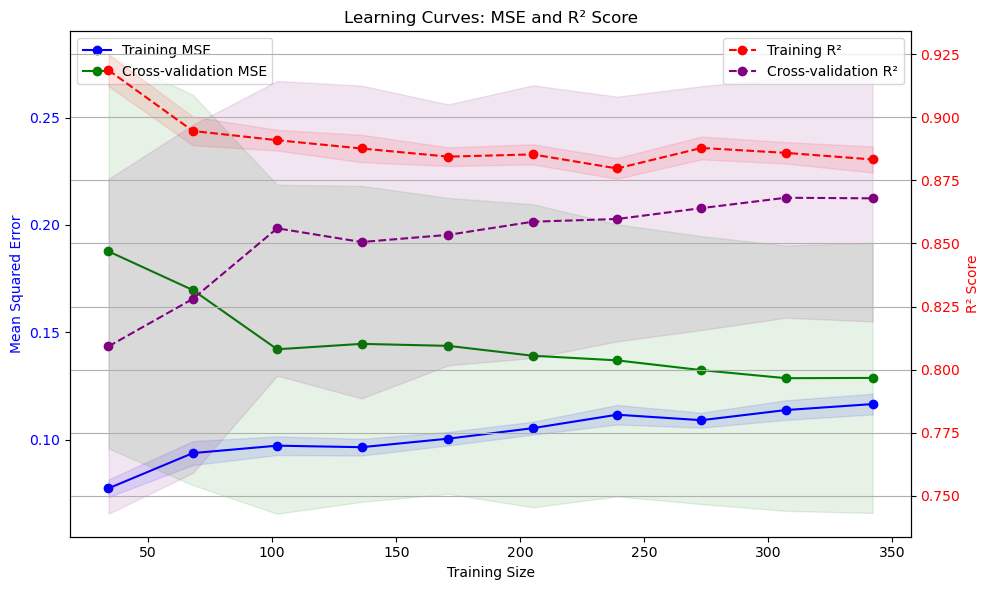

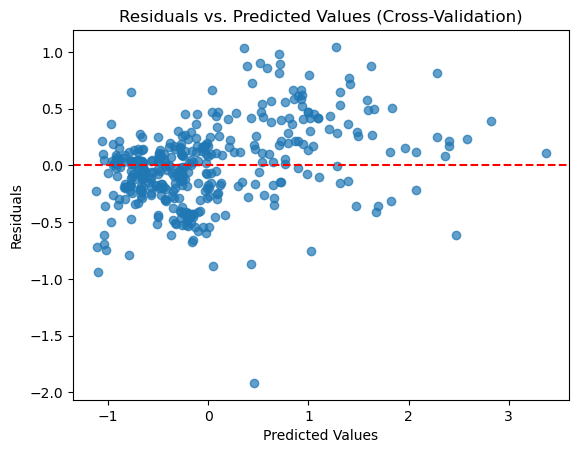

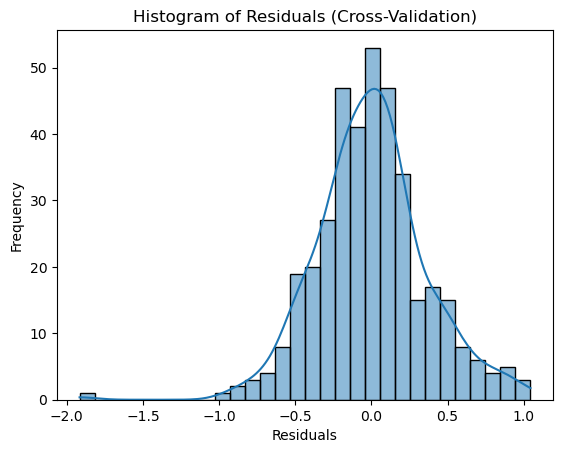

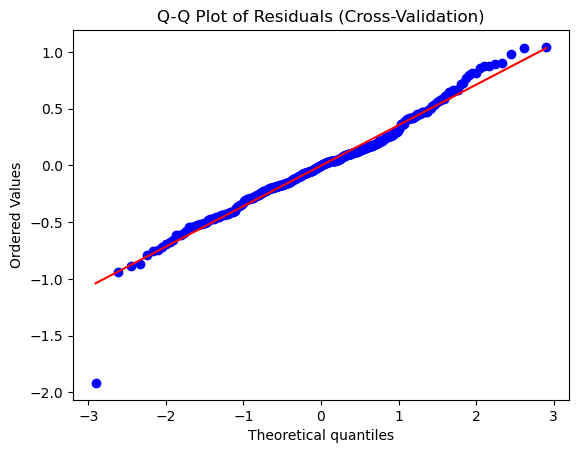

In [102]:
# Fit the model to the polynomial training data
best_model.fit(X_poly_train, y_train_scaled)  

# Predict on training data
y_train_pred = best_model.predict(X_poly_train)

def poly_model_analysis(model, r2_test, mse_test):
    
    ''' Purpose: By comparing performance on the training set and the test set, we can quickly identify overfitting (if the model performs significantly better on the training set) 
    or underfitting (if the model performs poorly on both the training and test sets).
    '''    
        # Subfunction to compare training and test performance
    def compare_performance():
        
        # Calculate metrics for training set
        mse_train = mean_squared_error(y_train_scaled, y_train_pred)
        r2_train = r2_score(y_train_scaled, y_train_pred)

        # Print results
        print(f'Comparison between train and test scores:\n')
        print(f'R² Score - train: {r2_train:.3f}')
        print(f'R² Score - test: {r2_test:.3f}')
        print(f'MSE Score - train: {mse_train:.3f}')
        print(f'MSE Score - test: {mse_test:.3f}')

        return r2_train, mse_train

       
    ''' Purpose: The learning curves help visualize how the model performance evolves with increasing training data size. 
    They give insight into whether adding more data could improve the model or if it's already saturated.
    '''   
    
    # Subfunction to plot learning curves for both MSE and R²
    def plot_learning_curve():
        # Learning curve for MSE
        train_sizes, train_scores_mse, test_scores_mse = learning_curve(
            model, X_poly_train, y_train_scaled,
            n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10),
            cv=kfold, scoring='neg_mean_squared_error'
        )

        # Learning curve for R²
        train_sizes_r2, train_scores_r2, test_scores_r2 = learning_curve(
            model, X_poly_train, y_train_scaled,
            n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10),
            cv=kfold, scoring='r2'
        )

        # Convert negative MSE to positive
        train_scores_mse_mean = -train_scores_mse.mean(axis=1)
        test_scores_mse_mean = -test_scores_mse.mean(axis=1)

        train_scores_r2_mean = train_scores_r2.mean(axis=1)
        test_scores_r2_mean = test_scores_r2.mean(axis=1)

        # Create a DataFrame for learning curve values
        learning_curve_df = pd.DataFrame({
            'Training Size': train_sizes.astype(int),
            'Training MSE': train_scores_mse_mean.round(3),
            'Validation MSE': test_scores_mse_mean.round(3),
            'Training R²': train_scores_r2_mean.round(3),
            'Validation R²': test_scores_r2_mean.round(3)
        })
    
        # Print the learning curve values in a table format
        print("\nLearning Curves:\n")
        print(learning_curve_df.to_string(index=False))
        
        # Plot with twin axes
        fig, ax1 = plt.subplots(figsize=(10, 6))

        # Plot MSE learning curve
        ax1.plot(train_sizes, train_scores_mse_mean, 'o-', color='blue', label='Training MSE')
        ax1.plot(train_sizes, test_scores_mse_mean, 'o-', color='green', label='Cross-validation MSE')
        ax1.fill_between(train_sizes, 
                         train_scores_mse_mean - train_scores_mse.std(axis=1),
                         train_scores_mse_mean + train_scores_mse.std(axis=1), 
                         alpha=0.1, color='blue')
        ax1.fill_between(train_sizes, 
                         test_scores_mse_mean - test_scores_mse.std(axis=1),
                         test_scores_mse_mean + test_scores_mse.std(axis=1), 
                         alpha=0.1, color='green')
        ax1.set_xlabel('Training Size')
        ax1.set_ylabel('Mean Squared Error', color='blue')
        ax1.tick_params(axis='y', labelcolor='blue')

        # Create twin axis for R²-score
        ax2 = ax1.twinx()
        ax2.plot(train_sizes_r2, train_scores_r2_mean, 'o--', color='red', label='Training R²')
        ax2.plot(train_sizes_r2, test_scores_r2_mean, 'o--', color='purple', label='Cross-validation R²')
        ax2.fill_between(train_sizes_r2,
                         train_scores_r2_mean - train_scores_r2.std(axis=1),
                         train_scores_r2_mean + train_scores_r2.std(axis=1),
                         alpha=0.1, color='red')
        ax2.fill_between(train_sizes_r2,
                         test_scores_r2_mean - test_scores_r2.std(axis=1),
                         test_scores_r2_mean + test_scores_r2.std(axis=1),
                         alpha=0.1, color='purple')
        ax2.set_ylabel('R² Score', color='red')
        ax2.tick_params(axis='y', labelcolor='red')

        # Add titles and legends
        plt.title('Learning Curves: MSE and R² Score')
        fig.tight_layout()  # Adjust layout to make space for both axes

        ax1.legend(loc='upper left')
        ax2.legend(loc='upper right')

        plt.grid()
        plt.show()


    
    # Subfunction for residual analysis
    def residual_analysis():
        # Perform cross-validation and get predictions for each validation fold
        y_val_pred = cross_val_predict(model, X_poly_train, y_train_scaled, cv=kfold)

        # Calculate residuals: difference between actual and predicted values
        residuals = y_train_scaled - y_val_pred

        # 1. Residuals vs Predicted Values
        plt.scatter(y_val_pred, residuals, alpha=0.7)
        plt.axhline(y=0, color='red', linestyle='--')
        plt.title('Residuals vs. Predicted Values (Cross-Validation)')
        plt.xlabel('Predicted Values')
        plt.ylabel('Residuals')
        plt.show()

        # 2. Histogram of Residuals
        sns.histplot(residuals, bins=30, kde=True)
        plt.title('Histogram of Residuals (Cross-Validation)')
        plt.xlabel('Residuals')
        plt.ylabel('Frequency')
        plt.show()

        # 3. Q-Q Plot of Residuals
        stats.probplot(residuals, dist="norm", plot=plt)
        plt.title('Q-Q Plot of Residuals (Cross-Validation)')
        plt.show()

    # Call the subfunctions
    compare_performance()
    plot_learning_curve()
    residual_analysis()


# Call the Function
poly_model_analysis(best_model, r2_initial, mse_initial)

**Comment**
- Setting a higher degree of penalty brings *overfitting* down within limits. 

#### 4.4.5 Final Evaluation

In [103]:
# Fit and transform the training data
X_poly_train = poly_features.fit_transform(X_train_scaled)
X_poly_test = poly_features.fit_transform(X_test_scaled)

def poly_final_evaluation(best_model, r2_initial, mse_initial):
    """
    Function to evaluate the best model on the training and test data.

    Parameters:
    - best_model: The optimized model obtained from hyperparameter tuning.
    - r2_initial: R² score of the initial (untuned) model on the test set.
    - mse_initial: Mean squared error of the initial (untuned) model on the test set.
    """
    
    # Ensure that the best_model is already fitted; skip refitting
    # best_model already contains the best parameters
    
    # Predict on the training data
    y_train_pred = best_model.predict(X_poly_train)
    
    # Predict on the test data
    y_test_pred = best_model.predict(X_poly_test)

    # Calculate metrics for the training set
    mse_train = mean_squared_error(y_train_scaled, y_train_pred)
    r2_train = r2_score(y_train_scaled, y_train_pred)

    # Calculate metrics for the test set
    mse_test = mean_squared_error(y_test_scaled, y_test_pred)
    r2_test = r2_score(y_test_scaled, y_test_pred)

    # Print results: compare initial test performance with tuned model's performance
    print(f'Initial R² Score - Test: {r2_initial:.3f}')
    print(f'Tuned R² Score - Train: {r2_train:.3f}')
    print(f'Tuned R² Score - Test: {r2_test:.3f}\n')

    print(f'Initial MSE Score - Test: {mse_initial:.3f}')
    print(f'Tuned MSE Score - Train: {mse_train:.3f}')
    print(f'Tuned MSE Score - Test: {mse_test:.3f}')


# Call the Function
poly_final_evaluation(best_model, r2_initial, mse_initial)

Initial R² Score - Test: 0.437
Tuned R² Score - Train: 0.882
Tuned R² Score - Test: 0.830

Initial MSE Score - Test: 0.657
Tuned MSE Score - Train: 0.118
Tuned MSE Score - Test: 0.198


**Comment**
- The test scores are a lot better after tuning, but still not that great scoring on the test set. 

### 4.5 k-Nearest Nighbors (kNN) Regression

#### 4.5.1 Initial Model Training and Evaluation

In [104]:
# Initialize the model
model = KNeighborsRegressor()

# Call the Function
r2_initial, mse_initial = evaluate_model(model)

R² Score - test (untuned): 0.640
MSE Score - test (untuned): 0.420


**Comment**
<br> The result is not great. 
<br> Let's look at it and see if we can tune it.

#### 4.5.2 Overfitting/Underfitting (untuned model)

To check for overfitting and underfitting, we will look at:
1. Compare Training and Test Performance
2. Learning Curves
3. Residual Analysis

Comparison between train and test scores:

R² Score - train: 0.822
R² Score - test: 0.640
MSE Score - train: 0.178
MSE Score - test: 0.420

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34         0.367           0.572        0.616          0.402
            68         0.323           0.475        0.638          0.493
           102         0.276           0.388        0.690          0.597
           136         0.216           0.375        0.748          0.609
           171         0.218           0.374        0.749          0.609
           205         0.193           0.350        0.790          0.626
           239         0.185           0.352        0.801          0.625
           273         0.166           0.298        0.829          0.672
           307         0.175           0.290        0.825          0.679
           342         0.179           0.279        0.821          0.693


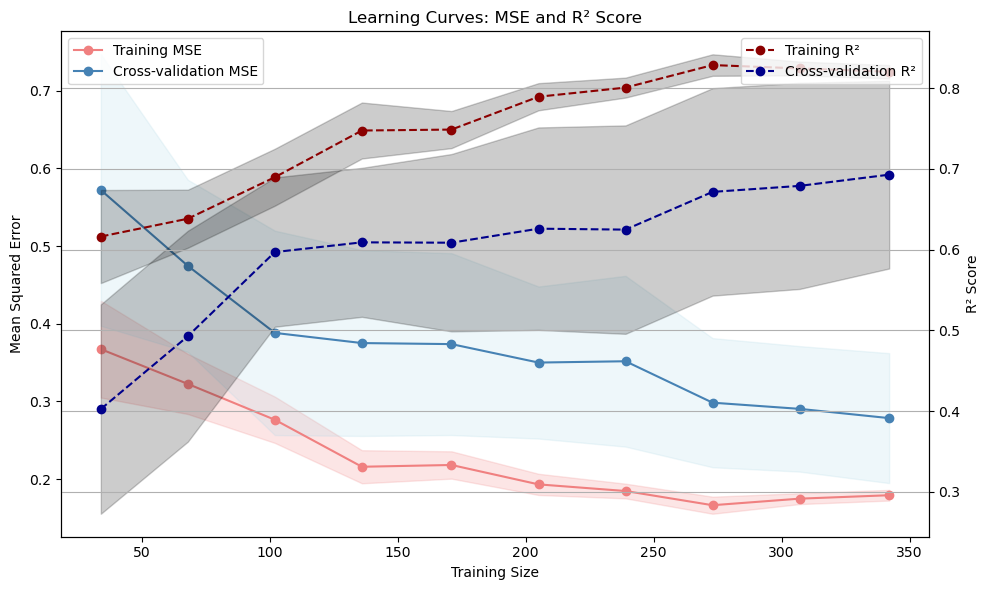

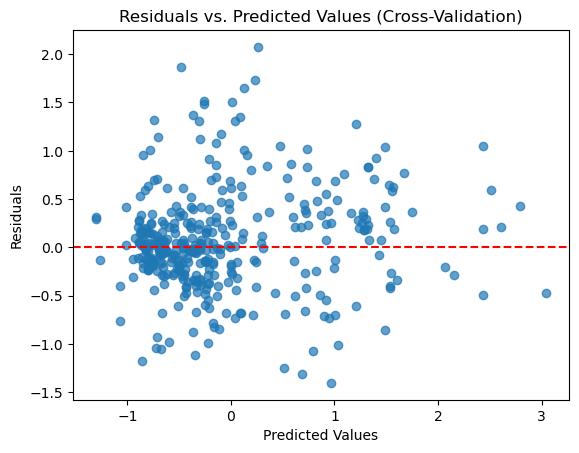

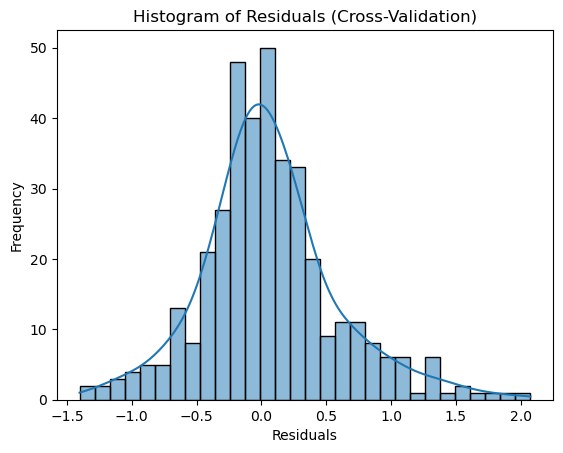

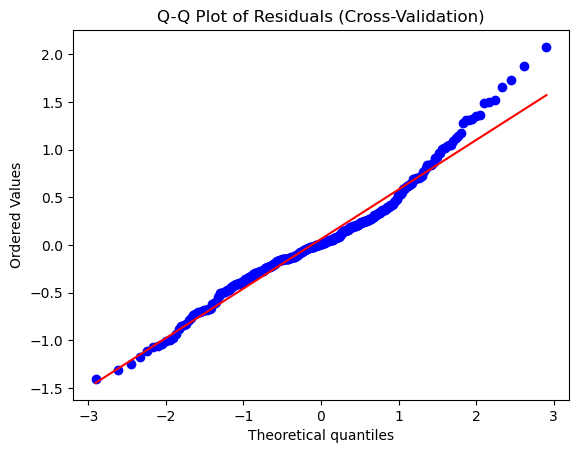

In [105]:
# Fit the Model to the Training Data
model.fit(X_train_scaled, y_train_scaled)

# Call the Function
model_analysis(model, r2_initial, mse_initial)

**Comment**
<br> *Compare Training and Test Performance*
- The scores for the training value indicates that the model fits the training data a lot better compared to the initial test set. This could indicate *overfitting* to the untuned model.

*Learning Curve* 
- The scores are converging, but they haven't stopped converging, ehich means more data may still help the untuned model to better results.
- MSE scores are high, for both the training and the validation set.
- Further, the validation set's R² score is still quite low.

Regularization and tuning of hyperparameters is going to be important.

*Residual Plots*
<br> The plots are slightly better than for the `SGDRegressor` and the `LinearRegressor()` model. 
- The *Residial Plot* has its points randomly scattered around the 0-line. This is good as it suggests that the model has captured the overall pattern well.
- The histogram looks as if the residuals have a normal distribution
- The Q-Q Plot exhibits detours for the residuals from the straight line indicating tails and outliers. 

#### 4.5.3 Hyperparameter Tuning

We will now try out some hyperparameters.

In [106]:
# Initialize the model
model = KNeighborsRegressor()

# Set up the Hyperparameter Grid
param_grid = {
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'leaf_size': [10, 30, 50, 100],
    'n_neighbors': [3, 5, 7, 9, 11],
    'p': [1, 2],
    'weights': ['uniform', 'distance']
}


# Call the Function
best_model, best_params = tune_hyperparameters(model, param_grid)

Fitting 10 folds for each of 320 candidates, totalling 3200 fits
Average R² Score: 0.730 (± 0.096)
Average MSE Score: 0.245 (± 0.066)

Best Hyperparameters:
algorithm: ball_tree
leaf_size: 30
n_neighbors: 7
p: 2
weights: distance


**Comment**
- Still high MSE score and low R² Score
- Let's look at the learning curves.

#### 4.5.4 Overfitting/Underfitting (tuned model)

Comparison between train and test scores:

R² Score - train: 0.999
R² Score - test: 0.640
MSE Score - train: 0.001
MSE Score - test: 0.420

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34        -0.000           0.526        1.000          0.453
            68         0.001           0.458        0.999          0.512
           102         0.000           0.356        1.000          0.630
           136         0.001           0.324        0.999          0.659
           171         0.001           0.309        0.999          0.676
           205         0.001           0.297        0.999          0.685
           239         0.001           0.299        0.999          0.683
           273         0.001           0.280        0.999          0.695
           307         0.001           0.259        0.999          0.717
           342         0.001           0.245        0.999          0.730


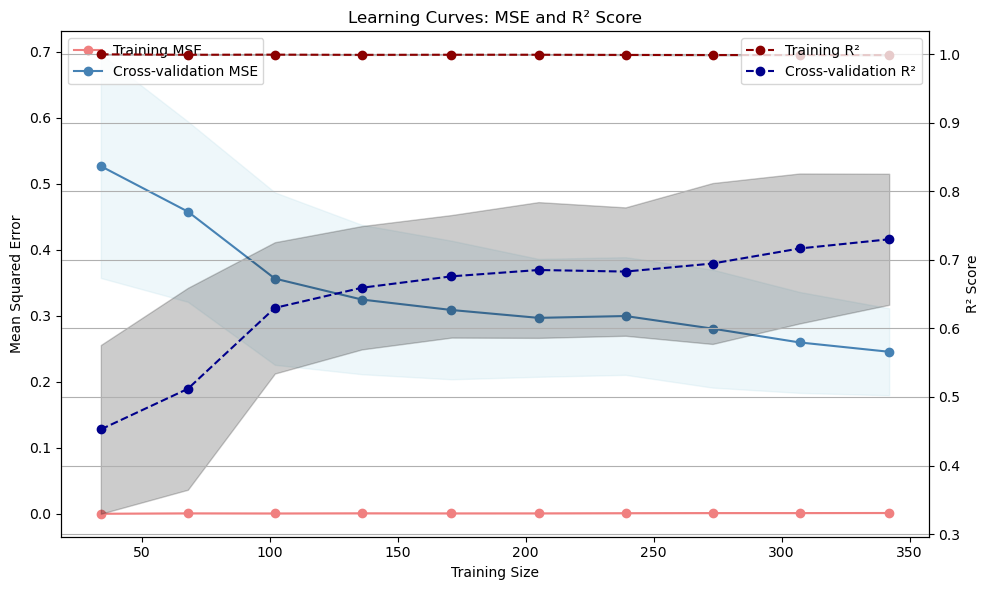

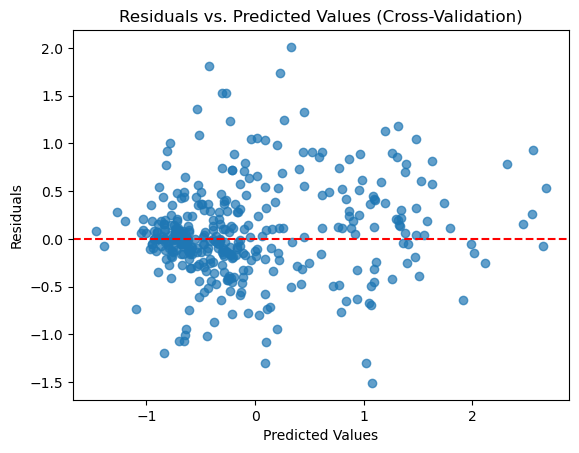

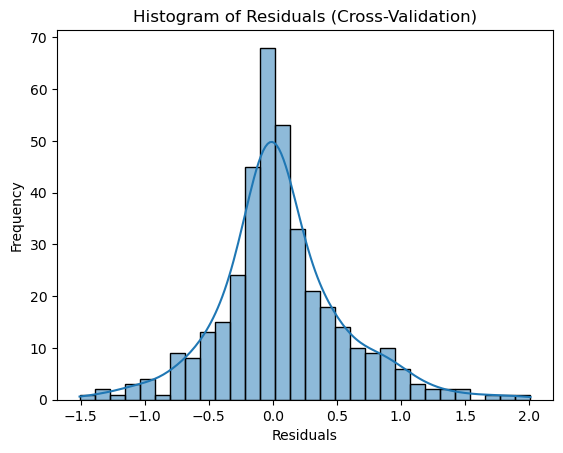

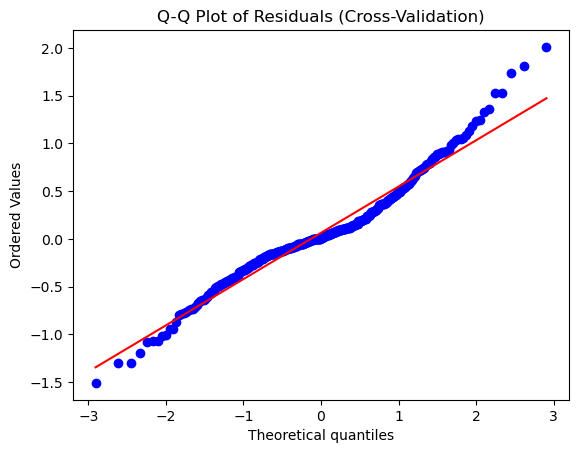

In [107]:
# Call the Function
model_analysis(best_model, r2_initial, mse_initial)

**Comment**
- Althought the scores have improved for the validation set, they are still poor.
- The gap between the curves has increased, meaning *overfitting* has increased.
- Let's try and tweak the parameters to decrease the *overfitting*.

In [108]:
best_params

{'algorithm': 'ball_tree',
 'leaf_size': 30,
 'n_neighbors': 7,
 'p': 2,
 'weights': 'distance'}

In [147]:
# Initialize the model
model = KNeighborsRegressor()

# Set up the Hyperparameter Grid
param_grid = {
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'leaf_size': [30],
    'n_neighbors': [41],
    'p': [1, 2],
    'weights': ['uniform']
}


# Call the Function
best_model, best_params = tune_hyperparameters(model, param_grid)

Fitting 10 folds for each of 8 candidates, totalling 80 fits
Average R² Score: 0.514 (± 0.086)
Average MSE Score: 0.468 (± 0.134)

Best Hyperparameters:
algorithm: auto
leaf_size: 30
n_neighbors: 41
p: 2
weights: uniform


Comparison between train and test scores:

R² Score - train: 0.566
R² Score - test: 0.640
MSE Score - train: 0.434
MSE Score - test: 0.420

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34           NaN             NaN          NaN            NaN
            68         0.676           0.784        0.241          0.190
           102         0.561           0.655        0.371          0.330
           136         0.529           0.638        0.385          0.344
           171         0.492           0.592        0.434          0.387
           205         0.487           0.571        0.470          0.407
           239         0.467           0.530        0.497          0.451
           273         0.458           0.501        0.530          0.482
           307         0.459           0.484        0.540          0.499
           342         0.447           0.468        0.552          0.514


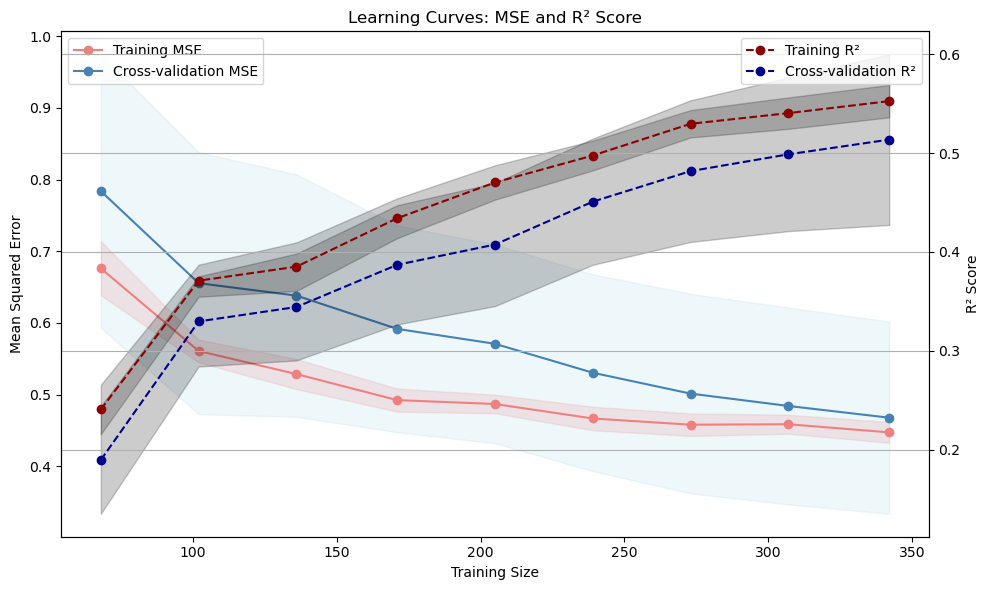

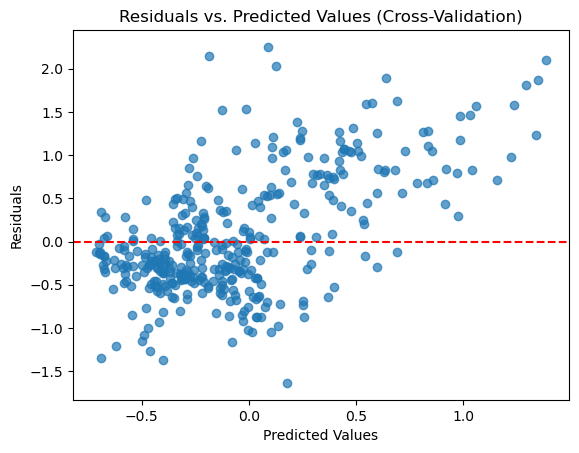

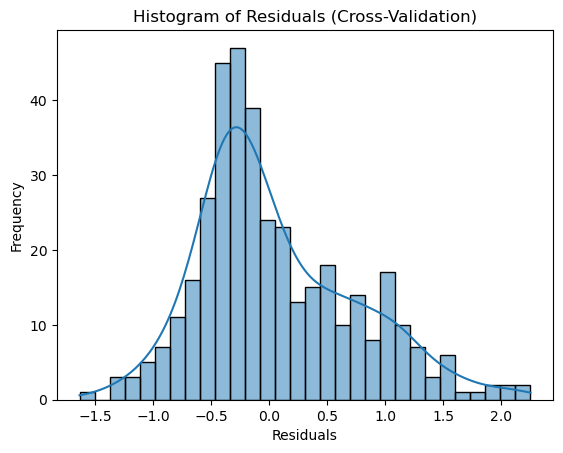

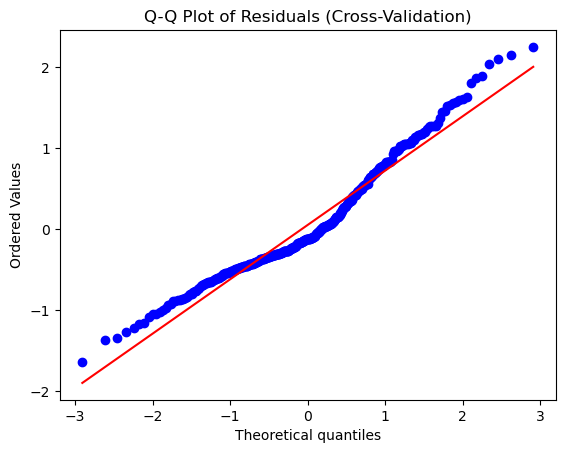

In [148]:
# Call the Function
model_analysis(best_model, r2_initial, mse_initial)

**Comment**
- Poor result
- Training set and validation set now are fairly close, but there is still a slight *overfitting*, but now the scores are really bad, indicating *underfitting*.

#### 4.5.5 Final Evaluation

We now run our parameter-optimized model with our test data.

In [149]:
# Call the Function
final_evaluation(best_model, r2_initial, mse_initial)

Initial R² Score - Test: 0.640
Tuned R² Score - Train: 0.566
Tuned R² Score - Test: 0.523
Performance change: R² Score - test: -18.3%

Initial MSE Score - Test: 0.420
Tuned MSE Score - Train: 0.434
Tuned MSE Score - Test: 0.557
Performance change: MSE Score - test: 32.6%


**Comment**
- This was tough to adapt. Not great scores on the test set.
- We won't be using this model. 

### 4.6 Random Forest Regressor

#### 4.6.1 Initial Model Training and Evaluation

In [150]:
# Initialize the Model
model = RandomForestRegressor(random_state=42)

# Call the Function
r2_initial, mse_initial = evaluate_model(model)

R² Score - test (untuned): 0.888
MSE Score - test (untuned): 0.131


**Comment**
<br> The result is quite strong

#### 4.6.2 Overfitting/Underfitting (untuned model)

To check for overfitting and underfitting, we will look at:
1. Compare Training and Test Performance
2. Learning Curves
3. Residual Analysis

Comparison between train and test scores:

R² Score - train: 0.985
R² Score - test: 0.888
MSE Score - train: 0.015
MSE Score - test: 0.131

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34         0.035           0.226        0.963          0.771
            68         0.023           0.174        0.974          0.824
           102         0.017           0.148        0.981          0.848
           136         0.013           0.124        0.985          0.870
           171         0.013           0.119        0.985          0.875
           205         0.015           0.120        0.984          0.876
           239         0.016           0.117        0.983          0.882
           273         0.015           0.103        0.984          0.894
           307         0.015           0.103        0.985          0.892
           342         0.015           0.098        0.985          0.898


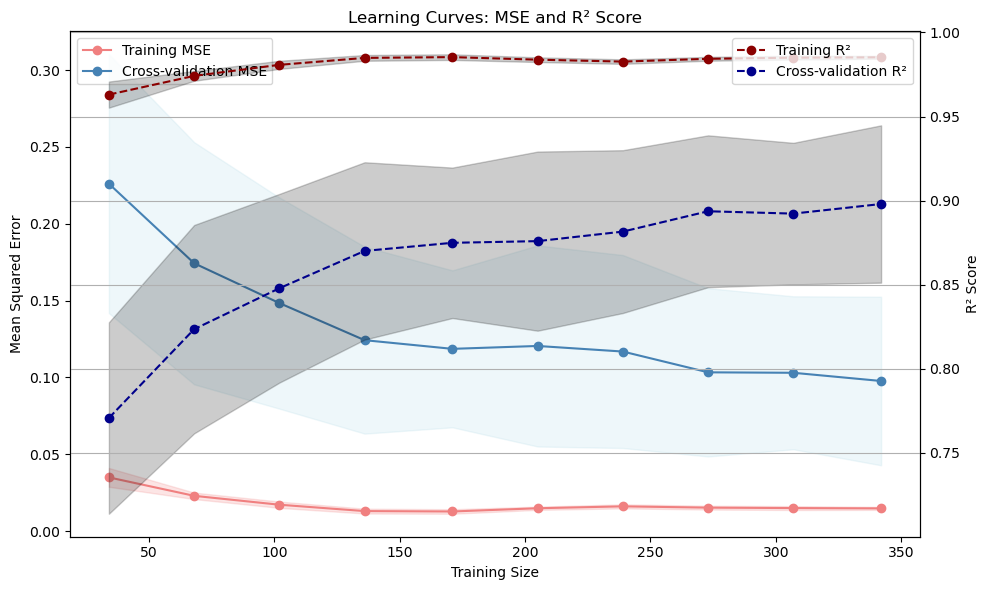

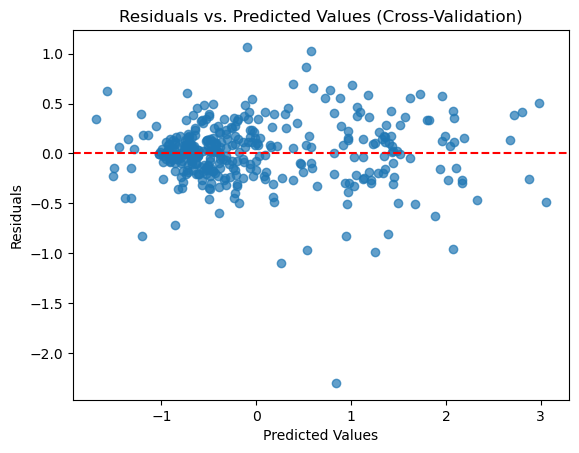

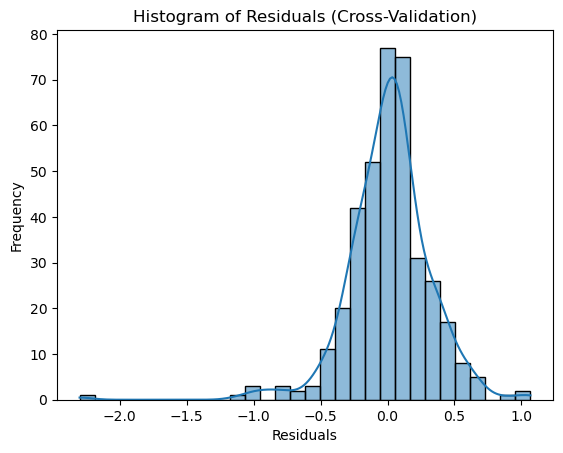

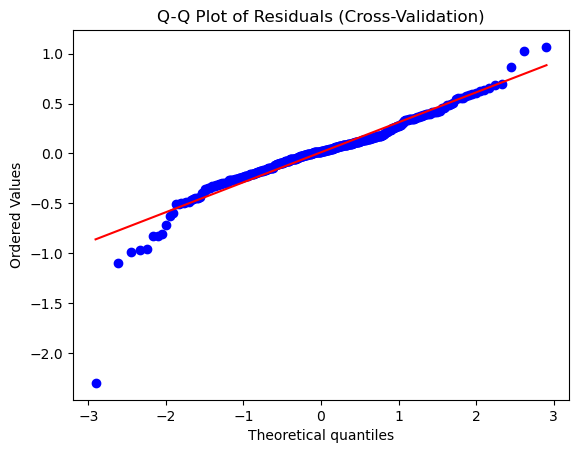

In [151]:
# Fit the Model to the Training Data
model.fit(X_train_scaled, y_train_scaled)

# Call the Function
model_analysis(model, r2_initial, mse_initial)

**Comment**
<br> *Compare Training and Test Performance*
- We seem to have a strong *overfitting* in the training set. The scores are too strong picking up all the noise.

*Learning Curve* 
- The `training score (MSE)` being close to 0 and the `Training score (R²)` being close to 1, indicates that the model is fitting the training data extremely well, which strongly supports the concern of *overfitting*.
- The `cross-validation score (MSE)` shows a decreasing trend as the training size increases. This indicates that as you train on more data, the model's ability to generalize improves, albeit slowly.

Regularization and tuning of hyperparameters is going to be important.

*Residual Plots*
<br> The plots look quite good.
- The *Residial Plot* has its points randomly scattered around the 0-line. This is good as it suggests that the model has captured the overall pattern well.
- The histogram looks as if the residuals have a somewhat normal distribution, but the frequencies drop off quite quickly.
- The Q-Q Plot has its points on the line, except for the ends of the theoretical quantiles. This indicates that I may have issues with the tails and outliers.  

#### 4.6.3 Hyperparameter Tuning

We will now try out some hyperparameters.

In [152]:
# Initialize the Model
model = RandomForestRegressor(random_state=42)

# Set up the Hyperparameter Grid
param_grid = {
    'bootstrap': [True, False],
    'max_depth': [2, 3, 4, 5, 6, 7, 8, 9, 10],
    'max_features': ['sqrt', 'log2', None],
    'min_samples_leaf': [1, 2, 3],
    'min_samples_split': [3, 4, 5, 6],
    'n_estimators': [50, 100, 200, 300]
}

# Call the Function
best_model, best_params = tune_hyperparameters(model, param_grid)

Fitting 10 folds for each of 2592 candidates, totalling 25920 fits
Average R² Score: 0.900 (± 0.045)
Average MSE Score: 0.096 (± 0.053)

Best Hyperparameters:
bootstrap: True
max_depth: 10
max_features: None
min_samples_leaf: 1
min_samples_split: 4
n_estimators: 200


**Comment**
- Slight improvement in scores.
- Let's look at learning curves

#### 4.6.4 Overfitting/Underfitting (tuned model)

Comparison between train and test scores:

R² Score - train: 0.979
R² Score - test: 0.888
MSE Score - train: 0.021
MSE Score - test: 0.131

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34         0.042           0.224        0.956          0.773
            68         0.028           0.168        0.968          0.831
           102         0.022           0.146        0.976          0.851
           136         0.017           0.121        0.980          0.874
           171         0.017           0.116        0.981          0.877
           205         0.020           0.120        0.979          0.876
           239         0.022           0.116        0.976          0.883
           273         0.021           0.105        0.979          0.893
           307         0.021           0.103        0.979          0.892
           342         0.021           0.096        0.979          0.900


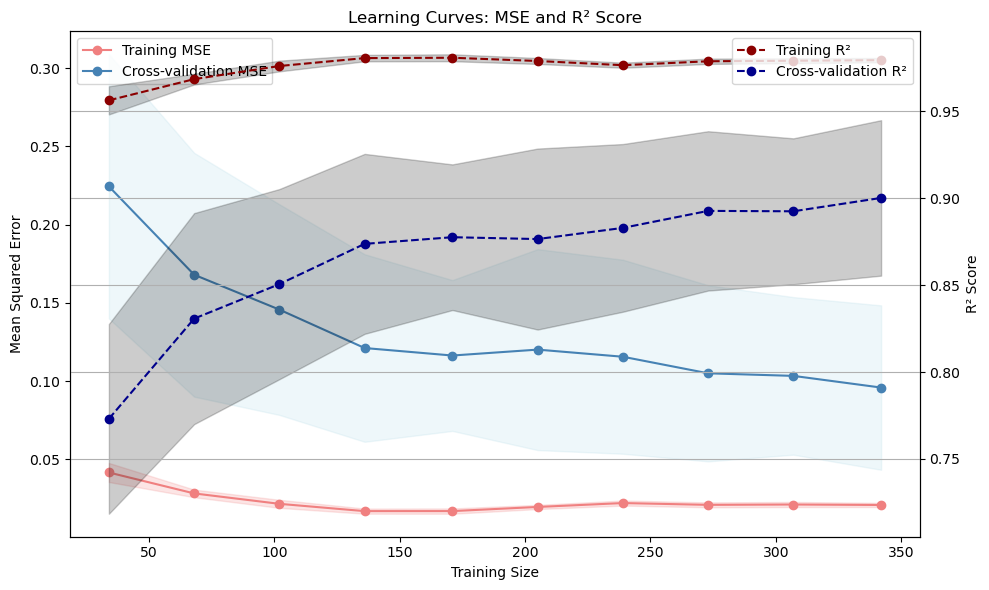

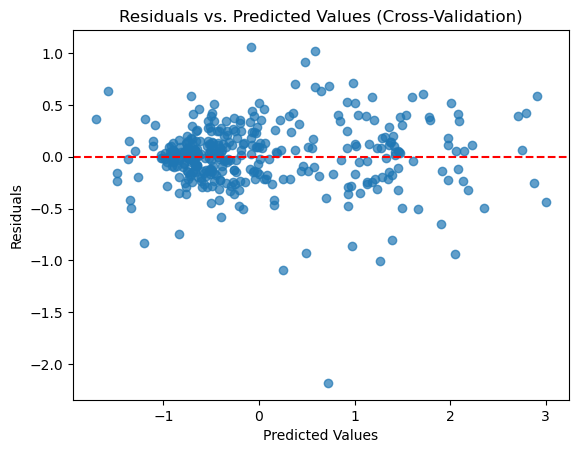

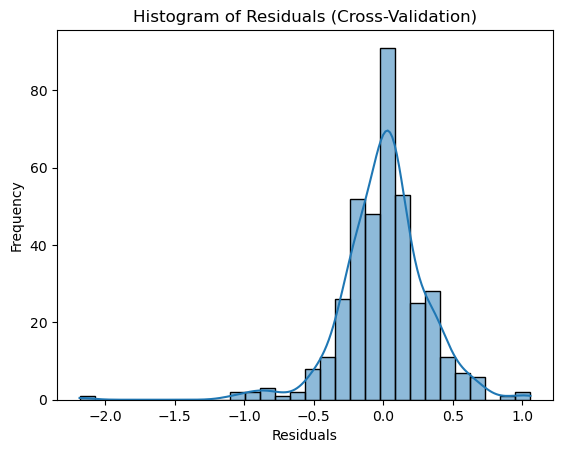

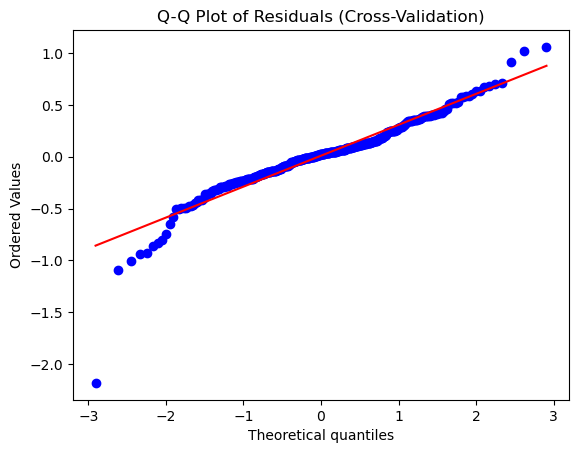

In [153]:
# Call the Function
model_analysis(best_model, r2_initial, mse_initial)

**Comments**
- The curves still indicate *overfitting*.
- Let's keep on optimizing, and then we look at tweaking back to downsize the *overfit*.

In [154]:
best_params

{'bootstrap': True,
 'max_depth': 10,
 'max_features': None,
 'min_samples_leaf': 1,
 'min_samples_split': 4,
 'n_estimators': 200}

In [157]:
# Initialize the Model
model = RandomForestRegressor(random_state=42)

# Set up the Hyperparameter Grid
param_grid = {
    'bootstrap': [True, False],
    'max_depth': [9, 10, 11],
    'max_features': ['sqrt', 'log2', None],
    'min_samples_leaf': [1, 2],
    'min_samples_split': [3, 4, 5],
    'n_estimators': [220, 225, 230]
}

# Call the Function
best_model, best_params = tune_hyperparameters(model, param_grid)

Fitting 10 folds for each of 324 candidates, totalling 3240 fits


C:\Users\gustm\anaconda3\Lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Average R² Score: 0.900 (± 0.045)
Average MSE Score: 0.096 (± 0.053)

Best Hyperparameters:
bootstrap: True
max_depth: 10
max_features: None
min_samples_leaf: 1
min_samples_split: 4
n_estimators: 225


Comparison between train and test scores:

R² Score - train: 0.979
R² Score - test: 0.888
MSE Score - train: 0.021
MSE Score - test: 0.131

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34         0.041           0.224        0.957          0.773
            68         0.028           0.168        0.968          0.830
           102         0.021           0.145        0.976          0.851
           136         0.017           0.121        0.980          0.874
           171         0.017           0.116        0.980          0.878
           205         0.020           0.121        0.979          0.876
           239         0.022           0.115        0.976          0.883
           273         0.021           0.105        0.979          0.893
           307         0.021           0.103        0.979          0.892
           342         0.021           0.096        0.979          0.900


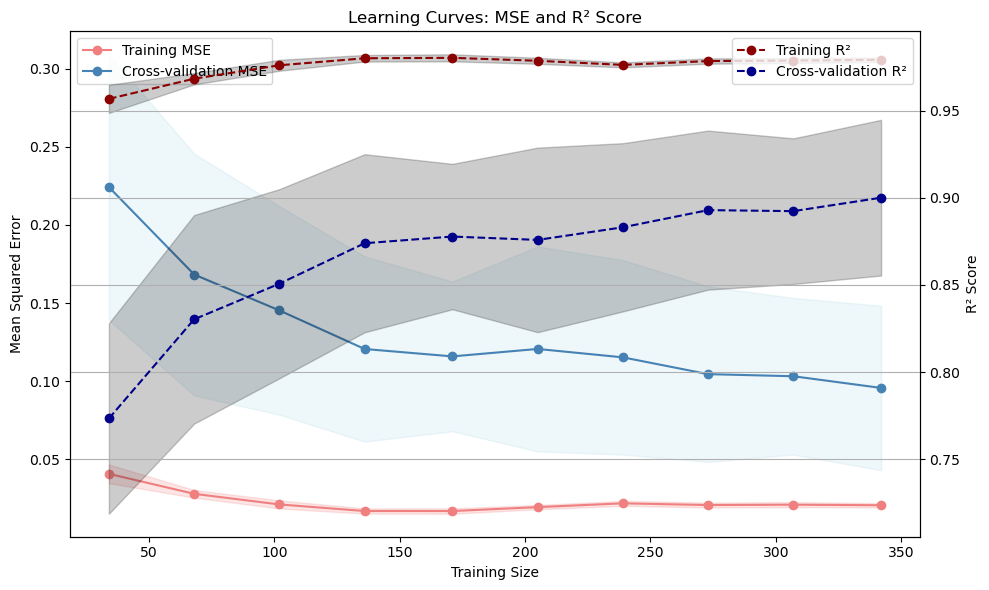

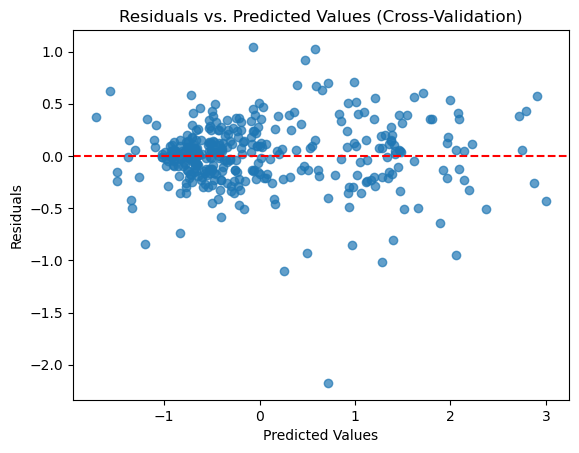

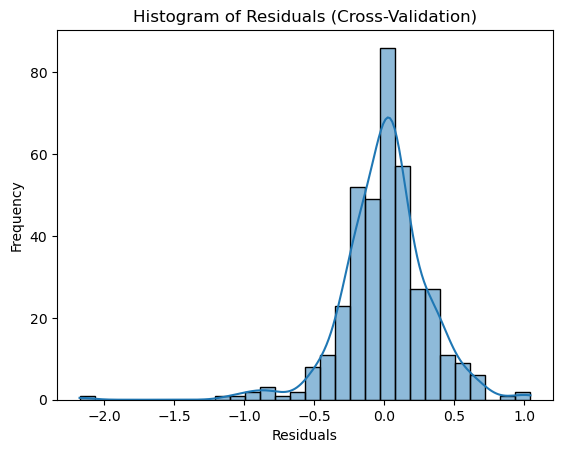

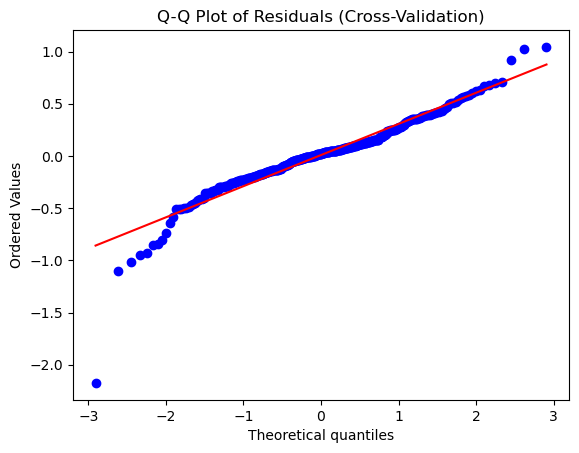

In [158]:
# Call the Function
model_analysis(best_model, r2_initial, mse_initial)

**Comment**
- So, we've now successfully optimized it, but lots of *overfitting*.
- Let's tweak parameters so that we can lessen the *overfit*. 

In [159]:
best_params

{'bootstrap': True,
 'max_depth': 10,
 'max_features': None,
 'min_samples_leaf': 1,
 'min_samples_split': 4,
 'n_estimators': 225}

In [190]:
# Initialize the Model
model = RandomForestRegressor(random_state=42)

# Set up the Hyperparameter Grid
param_grid = {
    'bootstrap': [True, False],
    'max_depth': [8, 10, 12],
    'max_features': [None],
    'min_samples_leaf': [14],
    'min_samples_split': [2, 3, 4, 5],
    'n_estimators': [200, 210, 230]
}

# Call the Function
best_model, best_params = tune_hyperparameters(model, param_grid)

Fitting 10 folds for each of 72 candidates, totalling 720 fits
Average R² Score: 0.857 (± 0.058)
Average MSE Score: 0.139 (± 0.072)

Best Hyperparameters:
bootstrap: True
max_depth: 8
max_features: None
min_samples_leaf: 14
min_samples_split: 2
n_estimators: 210


Comparison between train and test scores:

R² Score - train: 0.899
R² Score - test: 0.888
MSE Score - train: 0.101
MSE Score - test: 0.131

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34         0.956           1.029       -0.000         -0.071
            68         0.238           0.339        0.731          0.661
           102         0.164           0.259        0.816          0.740
           136         0.154           0.230        0.821          0.768
           171         0.135           0.205        0.844          0.793
           205         0.125           0.189        0.864          0.809
           239         0.128           0.171        0.862          0.827
           273         0.123           0.155        0.874          0.841
           307         0.114           0.144        0.886          0.852
           342         0.108           0.139        0.892          0.857


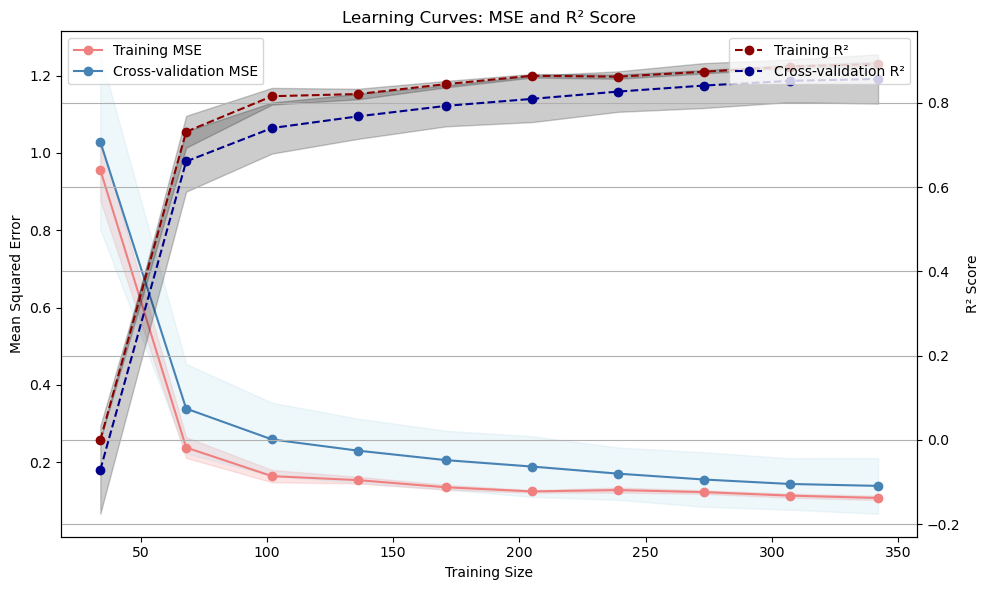

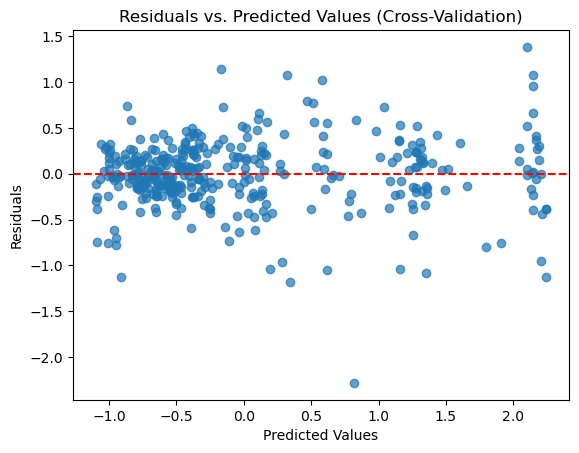

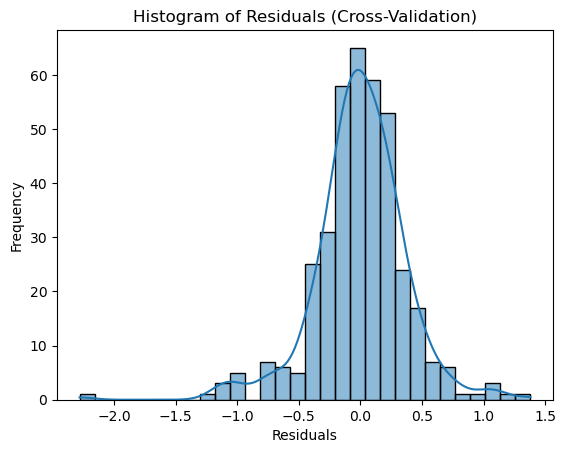

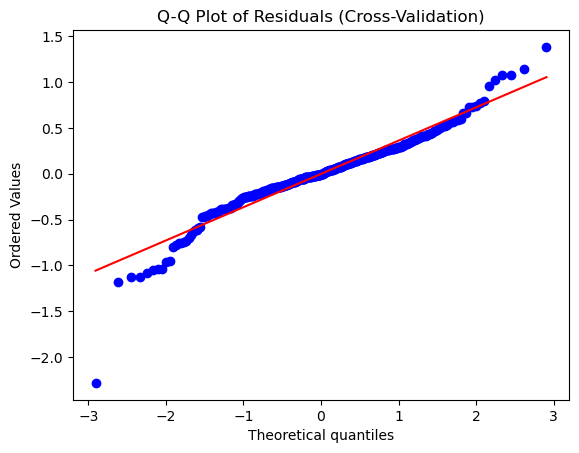

In [191]:
# Call the Function
model_analysis(best_model, r2_initial, mse_initial)

#### 4.6.5 Final Evaluation

We now run our parameter-optimized model with our test data.

In [192]:
# Call the Function
final_evaluation(best_model, r2_initial, mse_initial)

Initial R² Score - Test: 0.888
Tuned R² Score - Train: 0.899
Tuned R² Score - Test: 0.856
Performance change: R² Score - test: -3.6%

Initial MSE Score - Test: 0.131
Tuned MSE Score - Train: 0.101
Tuned MSE Score - Test: 0.168
Performance change: MSE Score - test: 28.6%


**Comment**
- The final score is acceptable.
- There's still a question about limited overfitting, but it is difficult to get rid of.

### 4.7 XGBoost

#### 4.7.1 Initial Model Training and Evaluation

In [193]:
# Initialize the Model
model = xgb.XGBRegressor(
    objective='reg:squarederror',  # Regression task
    random_state=42  # For reproducibility
)

# Call the Function
r2_initial, mse_initial = evaluate_model(model)

R² Score - test (untuned): 0.863
MSE Score - test (untuned): 0.160


**Comment**
- This result is a bit lower than several other models.

#### 4.7.2 Overfitting/Underfitting (untuned model)

To check for overfitting and underfitting, we will look at:
1. Compare Training and Test Performance
2. Learning Curves
3. Residual Analysis

Comparison between train and test scores:

R² Score - train: 0.999
R² Score - test: 0.863
MSE Score - train: 0.001
MSE Score - test: 0.160

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34         0.000           0.282        1.000          0.705
            68         0.001           0.280        0.999          0.721
           102         0.000           0.171        0.999          0.824
           136         0.001           0.138        0.999          0.858
           171         0.001           0.121        0.999          0.873
           205         0.001           0.134        0.999          0.862
           239         0.001           0.144        0.999          0.858
           273         0.001           0.138        0.999          0.863
           307         0.001           0.115        0.999          0.877
           342         0.001           0.111        0.999          0.886


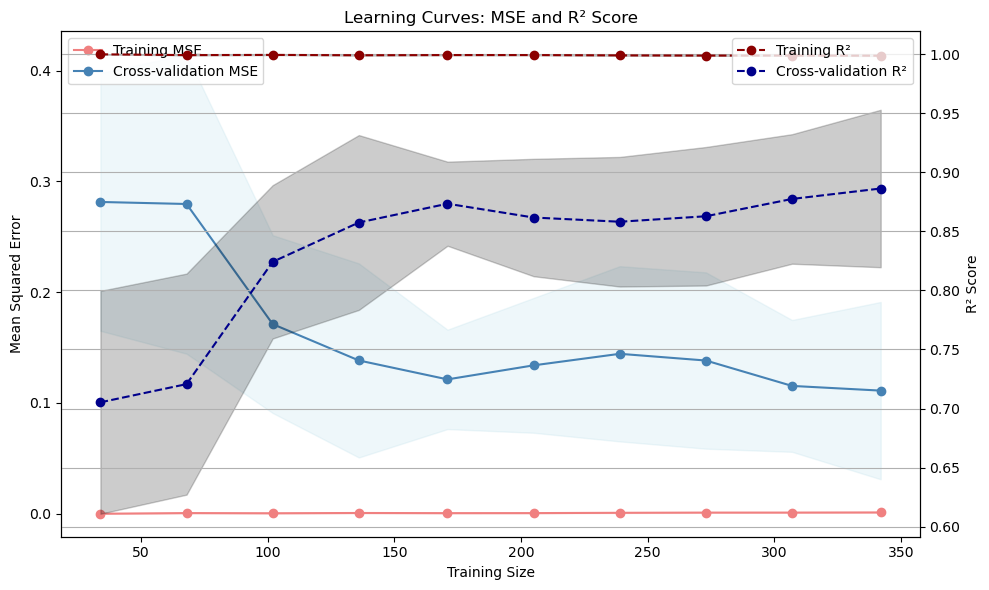

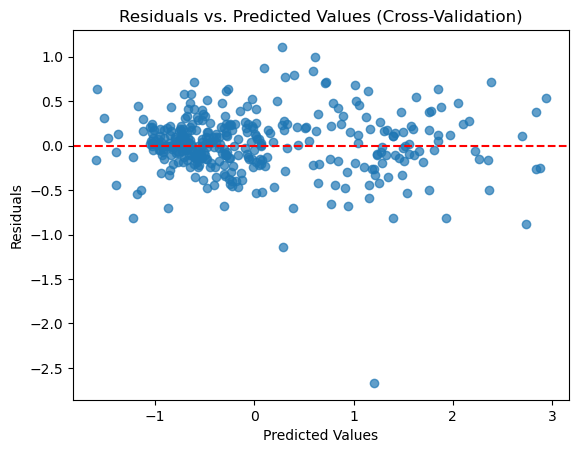

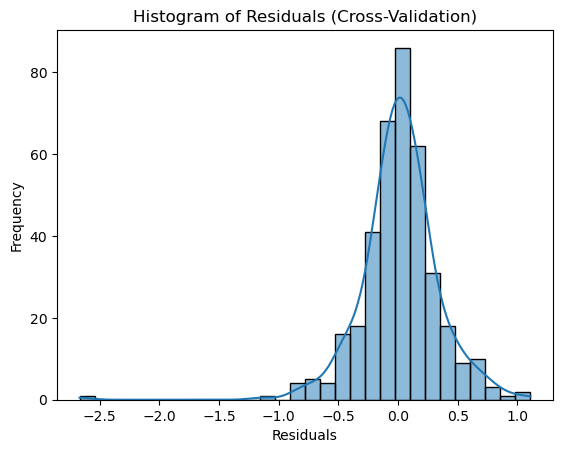

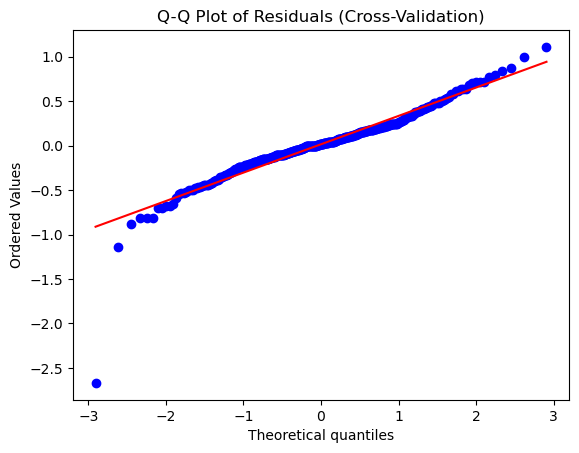

In [194]:
# Fit the Model to the Training Data
model.fit(X_train_scaled, y_train_scaled)

# Call the Function
model_analysis(model, r2_initial, mse_initial)

**Comment**
<br> *Compare Training and Test Performance*
- The scores for the training value indicates that the model fits the training data *extremely well*, almost perfectly. This indicates that it has likely learned the training data, including its noise.
- The R² score of 0.863 on the `Test Set` is still quite good, but the relatively higher MSE suggests that the model *does not generalize well* to unseen data.taThe sharp contrast between the training and test metrics indicates overfitting.
- The model has learned the training data too well, including its noise and outliers, which results in poor performance on the test set.

*Learning Curve* 
- The `training score (MSE)` being close to 0 and the `Training score (R²)` being close to 1, indicates that the model is fitting the training data extremely well, which strongly supports the concern of *overfitting*.
- The `cross-validation score (MSE)` shows a decreasing trend as the training size increases. This indicates that as you train on more data, the model's ability to generalize improves, albeit slowly.

Regularization and tuning of hyperparameters is going to be important.

*Residual Plots*
<br> The plots are better than for the `SGDRegressor model` and the `LinearRegressor() model`. 
- The *Residial Plot* has its points randomly scattered around the 0-line. This is good as it suggests that the model has captured the overall pattern well.
- The histogram looks as if the residuals have a normal distribution
- The Q-Q Plot has its points on the line, except for in the lower theoretical quantiles. This indicates that I may have issues with the tails and outliers.  

#### 4.7.3 Hyperparameter Tuning

We will now try out some hyperparameters.

In [196]:
# Initialize the Model
model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Set up the Hyperparameter Grid
param_grid = {
    'alpha': [0, 0.1],  # L1 regularization term
    'lambda': [0.009, 0.01, 0.011],  # L2 regularization term
    'learning_rate': [0.005, 0.1, 0.105],  # Step size shrinkage
    'max_depth': [3, 4, 5],  # Maximum tree depth
    'min_child_weight': [1, 2, 3],  # Minimum sum of instance weight needed in a child
    'n_estimators': [75, 80, 85],  # Number of boosting rounds
    'subsample': [0.45, 0.5, 0.55]  # Fraction of samples to be used for each tree
}

# Call the Function
best_model, best_params = tune_hyperparameters(model, param_grid)

Fitting 10 folds for each of 1458 candidates, totalling 14580 fits


C:\Users\gustm\anaconda3\Lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Average R² Score: 0.912 (± 0.045)
Average MSE Score: 0.083 (± 0.050)

Best Hyperparameters:
alpha: 0
lambda: 0.009
learning_rate: 0.1
max_depth: 4
min_child_weight: 2
n_estimators: 85
subsample: 0.5


**Comment**
<br> It still may be overfitting, as this is a rather complex model. Let's look at learning curves and if we need to, we will tweak parameters to lessen *overfit*.

#### 4.7.4 Overfitting/Underfitting (tuned model)

Comparison between train and test scores:

R² Score - train: 0.982
R² Score - test: 0.863
MSE Score - train: 0.018
MSE Score - test: 0.160

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34         0.002           0.266        0.998          0.723
            68         0.004           0.199        0.996          0.794
           102         0.004           0.159        0.995          0.833
           136         0.005           0.119        0.994          0.874
           171         0.008           0.108        0.991          0.886
           205         0.010           0.118        0.989          0.876
           239         0.012           0.105        0.987          0.893
           273         0.013           0.099        0.987          0.897
           307         0.014           0.087        0.986          0.907
           342         0.017           0.083        0.983          0.912


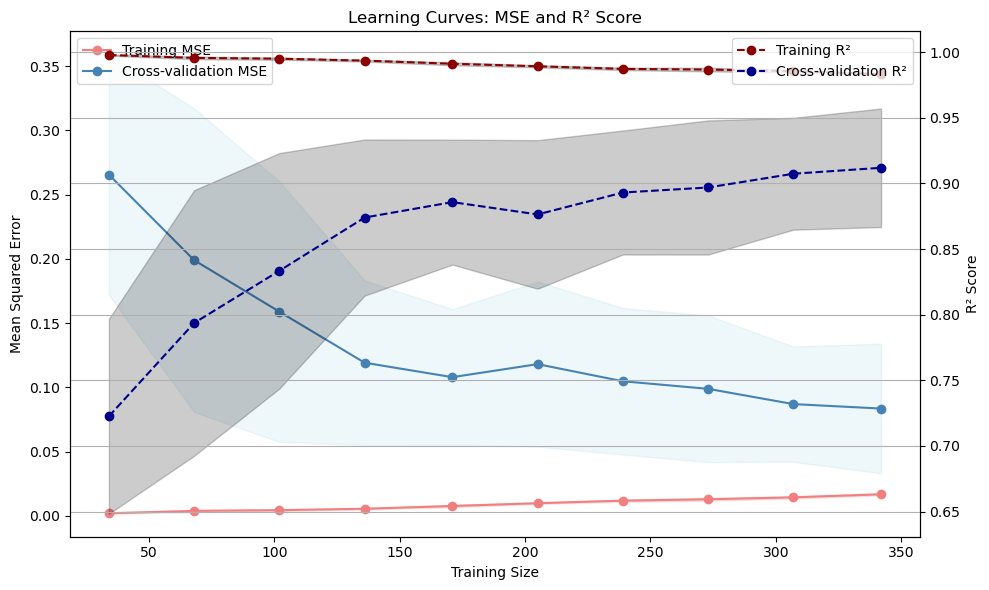

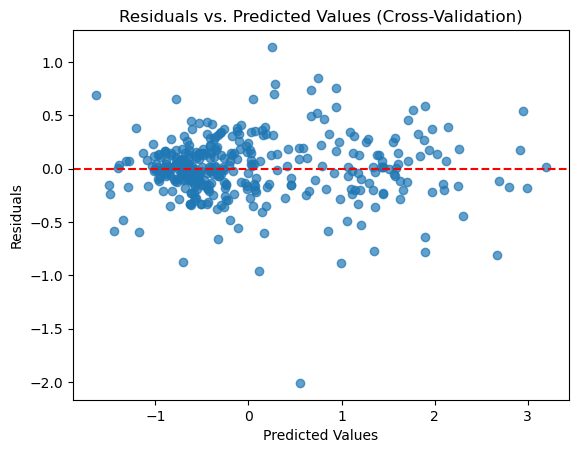

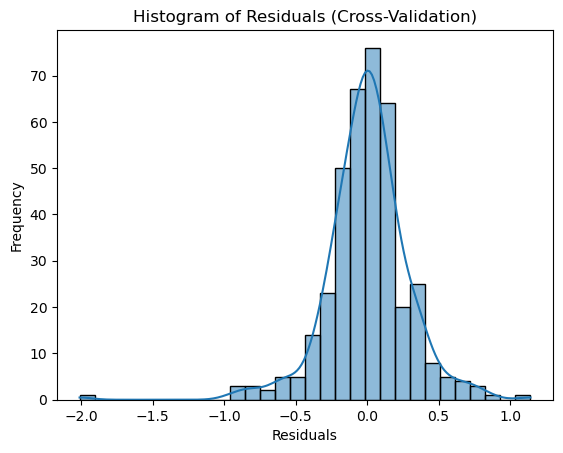

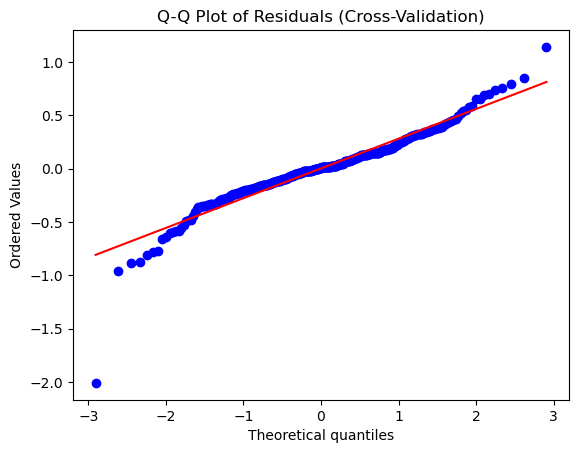

In [197]:
# Call the Function
model_analysis(best_model, r2_initial, mse_initial)

**Comment**
- We can still see how there is *overfitting* present.
- Let's tweak parameters 

In [251]:
# Initialize the Model
model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Set up the Hyperparameter Grid
param_grid = {
    'alpha': [15],  # L1 regularization term
    'lambda': [0],  # L2 regularization term
    'learning_rate': [0.35, 0.4, 0.45],  # Step size shrinkage
    'max_depth': [2, 3],  # Maximum tree depth
    'min_child_weight': [2, 3],  # Minimum sum of instance weight needed in a child
    'n_estimators': [100000],  # Number of boosting rounds
    'subsample': [0.7, 0.8, 0.9]  # Fraction of samples to be used for each tree
}

# Call the Function
best_model, best_params = tune_hyperparameters(model, param_grid)

Fitting 10 folds for each of 36 candidates, totalling 360 fits
Average R² Score: 0.861 (± 0.065)
Average MSE Score: 0.141 (± 0.085)

Best Hyperparameters:
alpha: 15
lambda: 0
learning_rate: 0.4
max_depth: 2
min_child_weight: 2
n_estimators: 100000
subsample: 0.8


Comparison between train and test scores:

R² Score - train: 0.896
R² Score - test: 0.863
MSE Score - train: 0.104
MSE Score - test: 0.160


C:\Users\gustm\anaconda3\Lib\site-packages\joblib\externals\loky\process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(



Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34         0.953           1.023        0.003         -0.063
            68         0.366           0.526        0.587          0.470
           102         0.228           0.339        0.745          0.665
           136         0.176           0.274        0.795          0.731
           171         0.149           0.241        0.829          0.764
           205         0.137           0.219        0.851          0.784
           239         0.133           0.191        0.857          0.813
           273         0.129           0.166        0.868          0.838
           307         0.118           0.155        0.882          0.846
           342         0.112           0.141        0.887          0.861


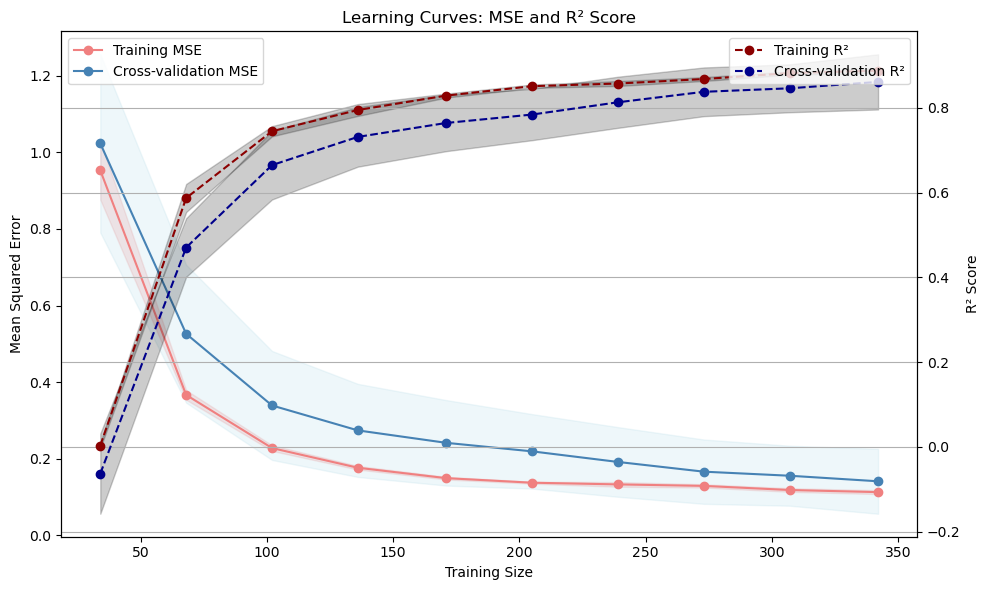

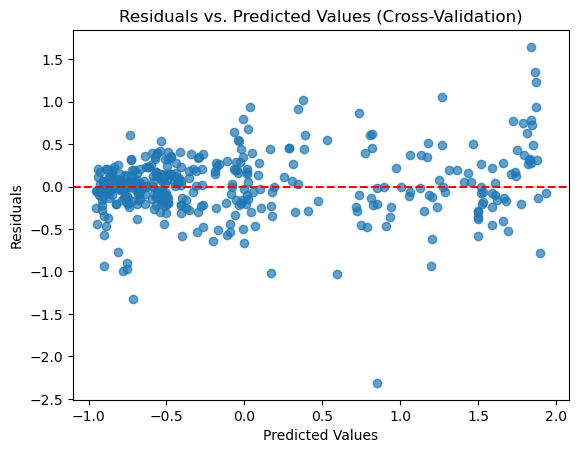

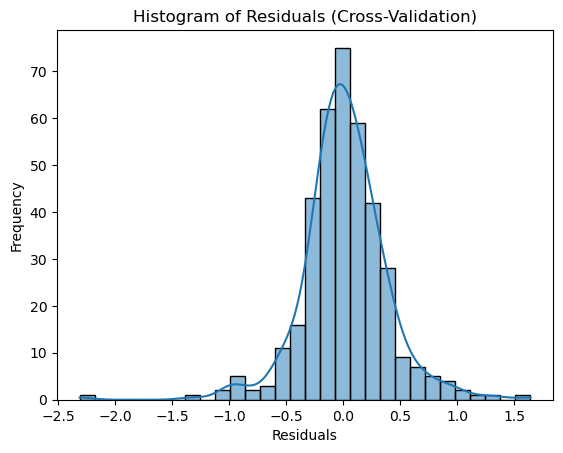

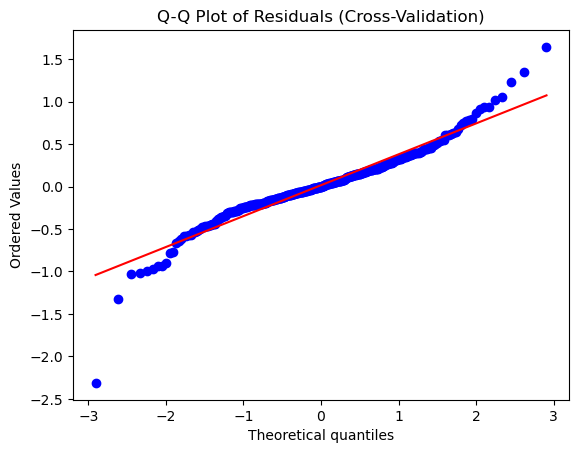

In [252]:
# Call the Function
model_analysis(best_model, r2_initial, mse_initial)

**Comment**
- Looks a lot better, but it's a difficult trade off with scores and overfitting.
- A slight overfitting still exists, and it's a complex model.

#### 4.7.5 Final Evaluation

We now run our parameter-optimized model with our test data.

In [253]:
# Call the Function
final_evaluation(best_model, r2_initial, mse_initial)

Initial R² Score - Test: 0.863
Tuned R² Score - Train: 0.896
Tuned R² Score - Test: 0.825
Performance change: R² Score - test: -4.4%

Initial MSE Score - Test: 0.160
Tuned MSE Score - Train: 0.104
Tuned MSE Score - Test: 0.204
Performance change: MSE Score - test: 27.7%


**Comment**
- We've been able to mimize overfitting while still keeping decent score (unfortunately a high MSE score).

### 4.8 Gradient Boosting Machines

#### 4.8.1 Initial Model Training and Evaluation

In [254]:
# Initialize the Model
model = GradientBoostingRegressor(random_state=42)  # For reproducibility

# Call the Function
r2_initial, mse_initial = evaluate_model(model)

R² Score - test (untuned): 0.878
MSE Score - test (untuned): 0.142


**Comment**
<br> This result looks decent. Let's see if we can improve it by tuning it.

#### 4.8.2 Overfitting/Underfitting (untuned model)

To check for overfitting and underfitting, we will look at:
1. Compare Training and Test Performance
2. Learning Curves
3. Residual Analysis

Comparison between train and test scores:

R² Score - train: 0.973
R² Score - test: 0.878
MSE Score - train: 0.027
MSE Score - test: 0.142

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34         0.000           0.237        1.000          0.756
            68         0.002           0.195        0.998          0.800
           102         0.004           0.130        0.995          0.867
           136         0.006           0.106        0.993          0.888
           171         0.009           0.102        0.990          0.893
           205         0.013           0.116        0.986          0.878
           239         0.016           0.118        0.983          0.879
           273         0.018           0.097        0.982          0.899
           307         0.021           0.094        0.979          0.902
           342         0.024           0.096        0.976          0.899


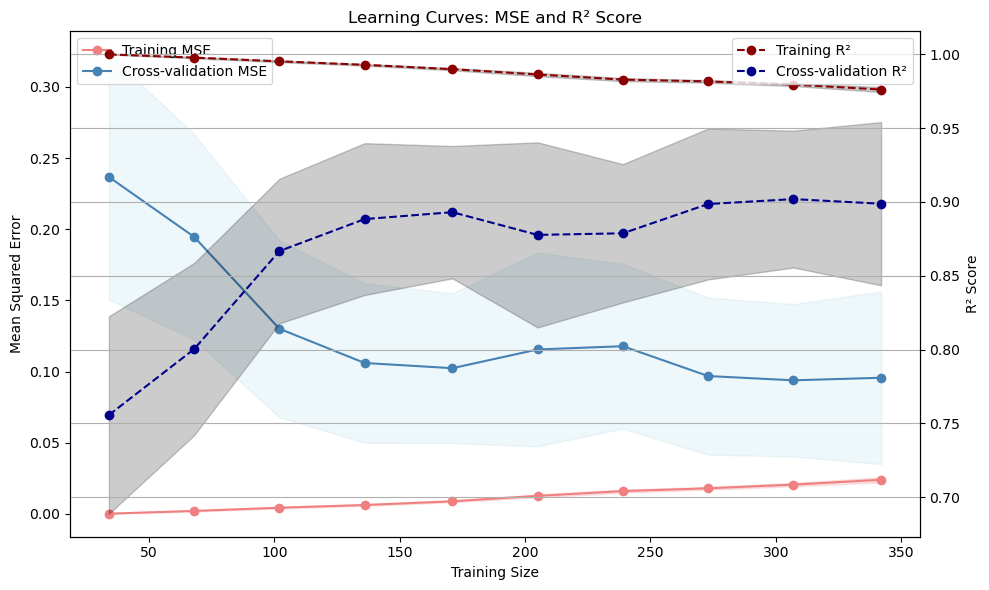

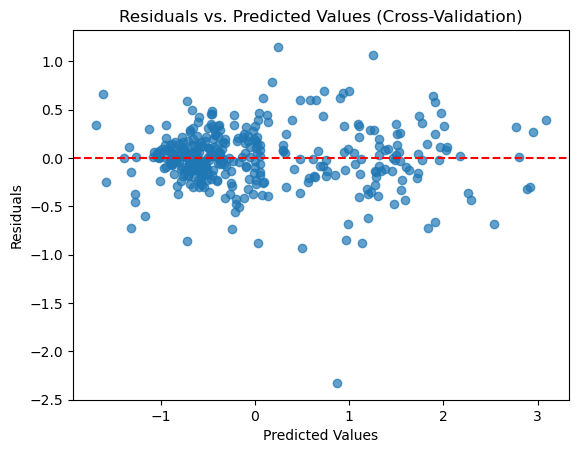

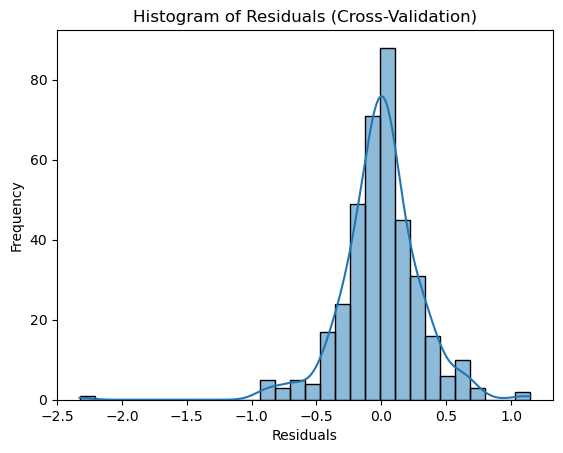

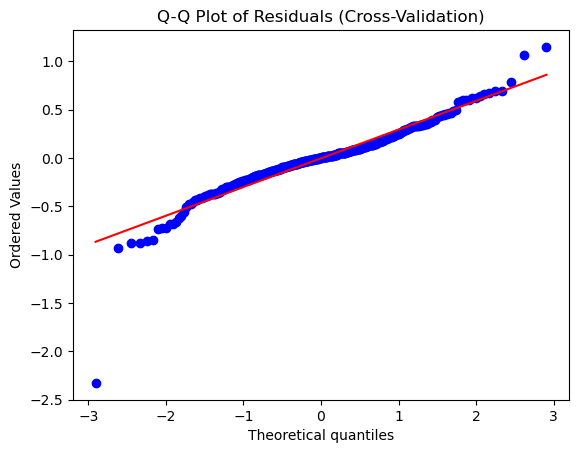

In [255]:
# Fit the Model to the Training Data
model.fit(X_train_scaled, y_train_scaled)

# Call the Function
model_analysis(model, r2_initial, mse_initial)

**Comment**
<br> *Compare Training and Test Performance*
- Overfitting is avaiable here. LEt's see what we can do.

*Learning Curve* 
- The `training score (MSE)` being close to 0 and the `Training score (R²)` being close to 1, indicates that the model is fitting the training data extremely well, which strongly supports the concern of *overfitting*.
- The `cross-validation score (MSE)` shows a decreasing trend as the training size increases. This indicates that as you train on more data, the model's ability to generalize improves, albeit slowly.

Regularization and tuning of hyperparameters is going to be important.

*Residual Plots*
<br> The plots are better than for the `SGDRegressor model` and the `LinearRegressor() model`. 
- The *Residial Plot* has its points randomly scattered around the 0-line. This is good as it suggests that the model has captured the overall pattern well.
- The histogram looks as if the residuals have a normal distribution
- The Q-Q Plot has its points on the line, except for in the lower theoretical quantiles. This indicates that I may have issues with the tails and outliers.  

#### 4.8.3 Hyperparameter Tuning

We will now try out some hyperparameters.

In [256]:
# Initialize the Model
model = GradientBoostingRegressor(random_state=42)

# Set up the Hyperparameter Grid
param_grid = {
    'alpha': [0.00001, 0.0001, 0.001],  # Loss regularization parameter (for Huber and quantile loss functions)
    'learning_rate': [0.09, 0.1, 0.11],  # Step size shrinkage
    'max_depth': [2, 3, 4],  # Maximum tree depth
    'min_samples_leaf': [1, 2, 3, 4],  # Minimum samples in a leaf node
    'min_samples_split': [3, 4, 5],  # Minimum samples required to split a node
    'n_estimators': [50, 55, 60],  # Number of boosting rounds (trees)
    'subsample': [0.45, 0.5, 0.55],  # Fraction of samples to be used for each tree
}

# Call the Function
best_model, best_params = tune_hyperparameters(model, param_grid)

Fitting 10 folds for each of 2916 candidates, totalling 29160 fits
Average R² Score: 0.905 (± 0.057)
Average MSE Score: 0.090 (± 0.062)

Best Hyperparameters:
alpha: 1e-05
learning_rate: 0.1
max_depth: 3
min_samples_leaf: 1
min_samples_split: 4
n_estimators: 55
subsample: 0.5


**Comment**
<br> It still may be overfitting, as this is a rather complex model. Let's look at learning curves and if we need to, we will tweak parameters to lessen *overfit*.

#### 4.8.4 Overfitting/Underfitting (tuned model)

Comparison between train and test scores:

R² Score - train: 0.960
R² Score - test: 0.878
MSE Score - train: 0.040
MSE Score - test: 0.142

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34         0.007           0.208        0.993          0.783
            68         0.011           0.168        0.987          0.829
           102         0.015           0.142        0.983          0.855
           136         0.017           0.113        0.981          0.882
           171         0.022           0.105        0.975          0.889
           205         0.027           0.117        0.971          0.879
           239         0.031           0.101        0.967          0.895
           273         0.033           0.101        0.966          0.894
           307         0.037           0.102        0.963          0.893
           342         0.039           0.090        0.961          0.905


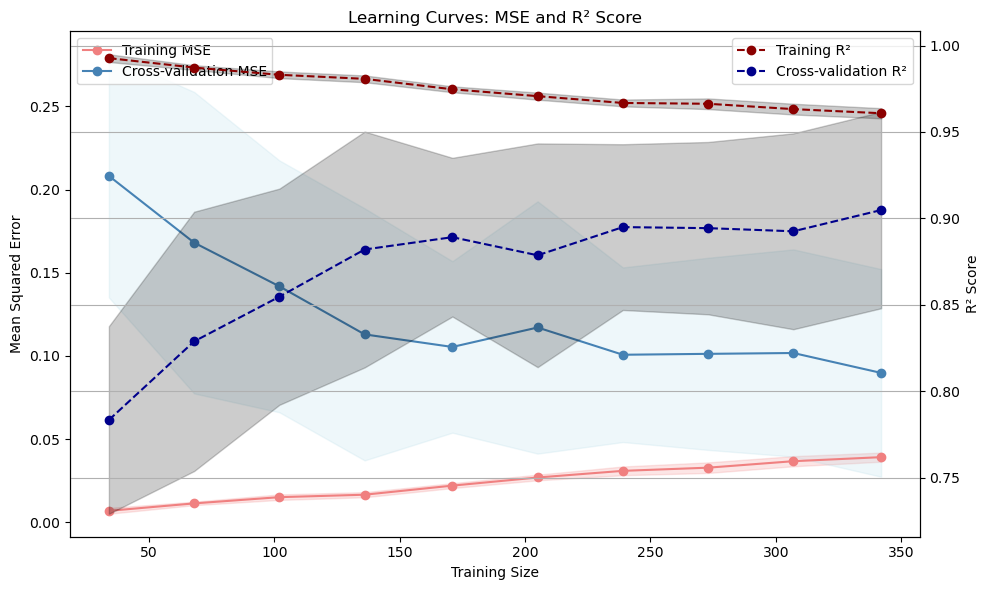

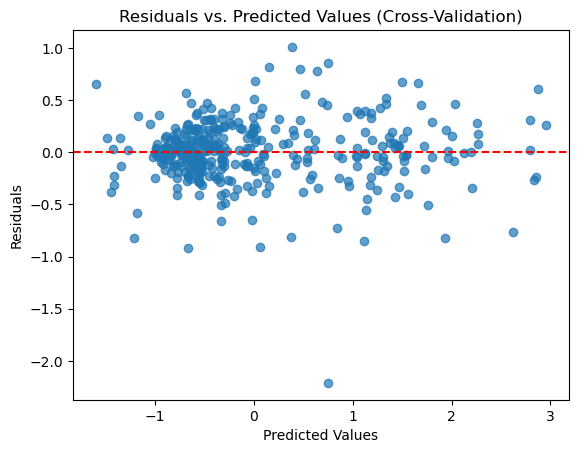

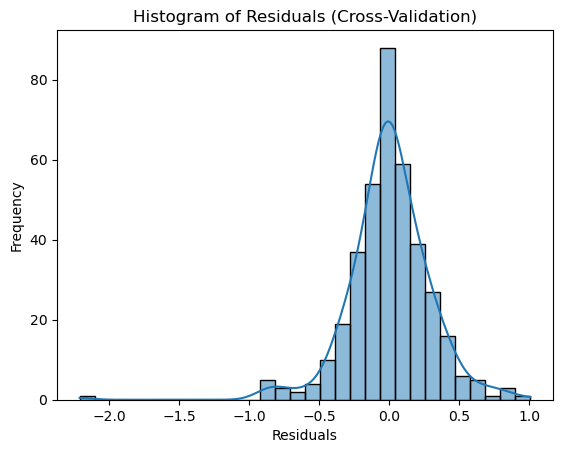

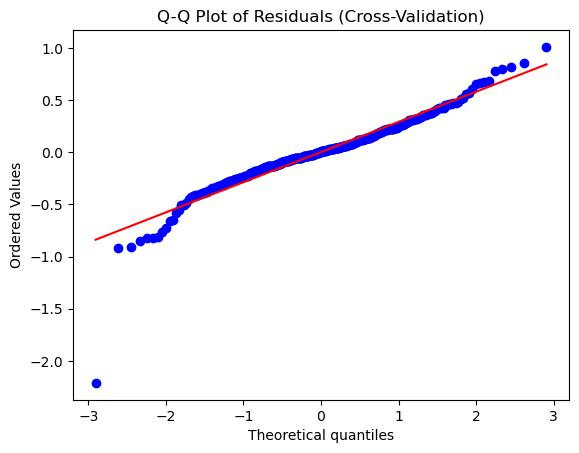

In [257]:
# Call the Function
model_analysis(best_model, r2_initial, mse_initial)

**Comment**
- There still is *overfitting* involved.
- Let's tweak some parameters.

In [299]:
# Initialize the Model
model = GradientBoostingRegressor(random_state=42)

# Set up the Hyperparameter Grid
param_grid = {
    'alpha': [0.0001],  # Loss regularization parameter (for Huber and quantile loss functions)
    'learning_rate': [0.10, 0.11, 0.12, 0.13, 0.14, 0.15],  # Step size shrinkage
    'max_depth': [2, 3, 4, 5, 6],  # Maximum tree depth
    'min_samples_leaf': [8],  # Minimum samples in a leaf node
    'min_samples_split': [4],  # Minimum samples required to split a node
    'n_estimators': [45, 46, 47, 48, 49, 50],  # Number of boosting rounds (trees)
    'subsample': [0.47],  # Fraction of samples to be used for each tree
}

# Call the Function
best_model, best_params = tune_hyperparameters(model, param_grid)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits
Average R² Score: 0.899 (± 0.058)
Average MSE Score: 0.097 (± 0.067)

Best Hyperparameters:
alpha: 0.0001
learning_rate: 0.12
max_depth: 5
min_samples_leaf: 8
min_samples_split: 4
n_estimators: 48
subsample: 0.47


Comparison between train and test scores:

R² Score - train: 0.960
R² Score - test: 0.878
MSE Score - train: 0.040
MSE Score - test: 0.142

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34         0.959           1.019       -0.003         -0.056
            68         0.078           0.222        0.912          0.778
           102         0.052           0.188        0.941          0.810
           136         0.044           0.162        0.949          0.836
           171         0.041           0.149        0.953          0.849
           205         0.041           0.142        0.955          0.855
           239         0.041           0.124        0.956          0.875
           273         0.038           0.115        0.961          0.883
           307         0.038           0.103        0.962          0.893
           342         0.038           0.097        0.962          0.899


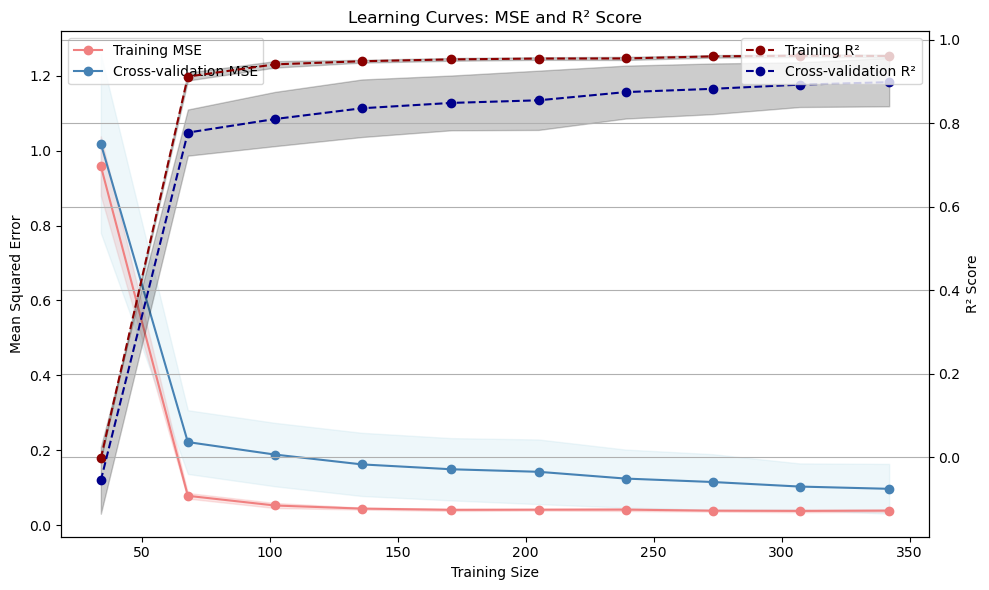

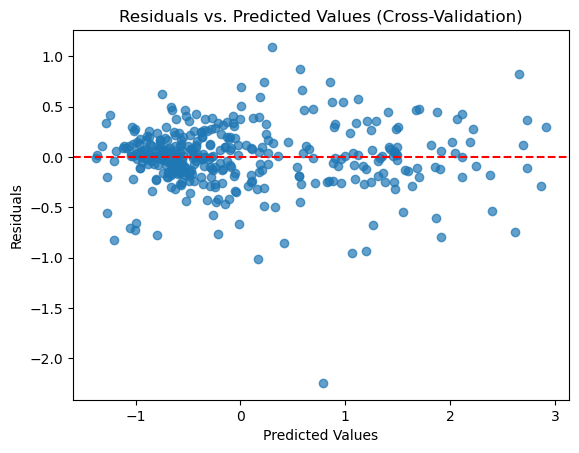

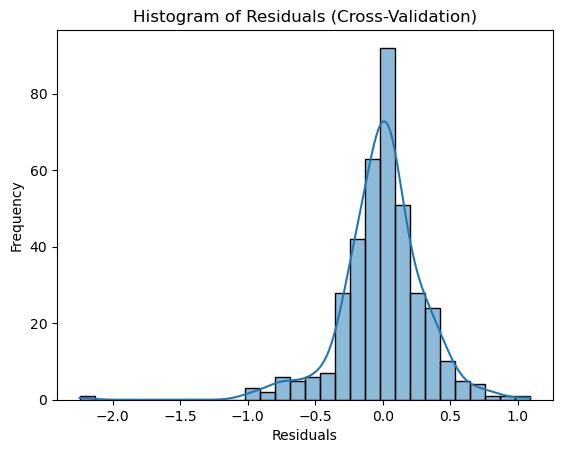

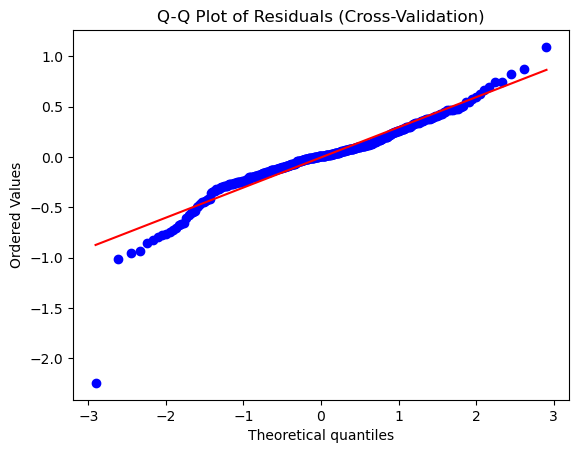

In [300]:
# Call the Function
model_analysis(best_model, r2_initial, mse_initial)

**Comment**
<br> After some adjustments of `min_samle_split` (increase to 4), `min_sample_split` (increased to 8), and `subsample`(from 0.50 to 0.47), we have taken care of most of the overfitting.
<br> Note that the learning curves now converge and are close to each other, which indicates a fairly good model fit.
<br> Let's look at the numbers.

*Training set (excl. validation set):*
<br> R² Score: 0.976, MSE Score: 0.024 (before tuning)
<br> R² Score: 0.962, MSE Score: 0.038 (after tuning)

*Change (Training set):*
<br> R² Score: -1.4%, MSE Score: +58.3%

*Validation set (cv test):*
<br> R² Score: 0.899, MSE Score: 0.096 (before tuning)
<br> R² Score: 0.899, MSE Score: 0.097 (after tuning)

*Change (Validation set):*
<br> R² Score: +0%, MSE Score: +1%

*Percental differences between `Training`and `Validation` scores (tuned) - Overfitting or Not (R² Score: <5%, MSE Score: <10%)*
<br> R² Score: 7% (max 5% to be ok)
<br> MSE Score: -61% (max -10% to be ok)

**Conclusion**
- Interesting here is that we get a great learning model, fast learning the datasets to a large degree and with great accuracy.
- We have great scores, but perhaps a bit of overfitting, that may go away if we had more data  to train the model on.
- The scores aren't improved a lot, but the overfitting was managed.
- Although we are not within the boundries for not seing overfitting, we are happy to have handled the *overfitting*
- We have to be ok with some degree of *overfitting* when applying a complex model to a small dataset 

#### 4.8.5 Final Evaluation

We now run our parameter-optimized model with our test data.

In [301]:
# Call the Function
final_evaluation(best_model, r2_initial, mse_initial)

Initial R² Score - Test: 0.878
Tuned R² Score - Train: 0.960
Tuned R² Score - Test: 0.877
Performance change: R² Score - test: -0.2%

Initial MSE Score - Test: 0.142
Tuned MSE Score - Train: 0.040
Tuned MSE Score - Test: 0.144
Performance change: MSE Score - test: 1.6%


**Comment**
- Quite a good result.

### 4.9 Support Vector Machine (SVM) with regression (SVR) 

#### 4.9.1 Initial Model Training and Evaluation

In [302]:
# Initialize the Model
model = SVR()

# Call the Function
r2_initial, mse_initial = evaluate_model(model)

R² Score - test (untuned): 0.767
MSE Score - test (untuned): 0.273


**Comment**
<br> The result is no that strong. The MSE is quite high.

#### 4.9.2 Overfitting/Underfitting (untuned model)

To check for overfitting and underfitting, we will look at:
1. Compare Training and Test Performance
2. Learning Curves
3. Residual Analysis

Comparison between train and test scores:

R² Score - train: 0.943
R² Score - test: 0.767
MSE Score - train: 0.057
MSE Score - test: 0.273

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34         0.077           0.379        0.919          0.604
            68         0.063           0.306        0.929          0.677
           102         0.059           0.261        0.934          0.728
           136         0.069           0.231        0.920          0.750
           171         0.065           0.189        0.925          0.802
           205         0.064           0.167        0.931          0.826
           239         0.061           0.161        0.934          0.833
           273         0.056           0.134        0.943          0.855
           307         0.055           0.122        0.945          0.867
           342         0.058           0.119        0.942          0.870


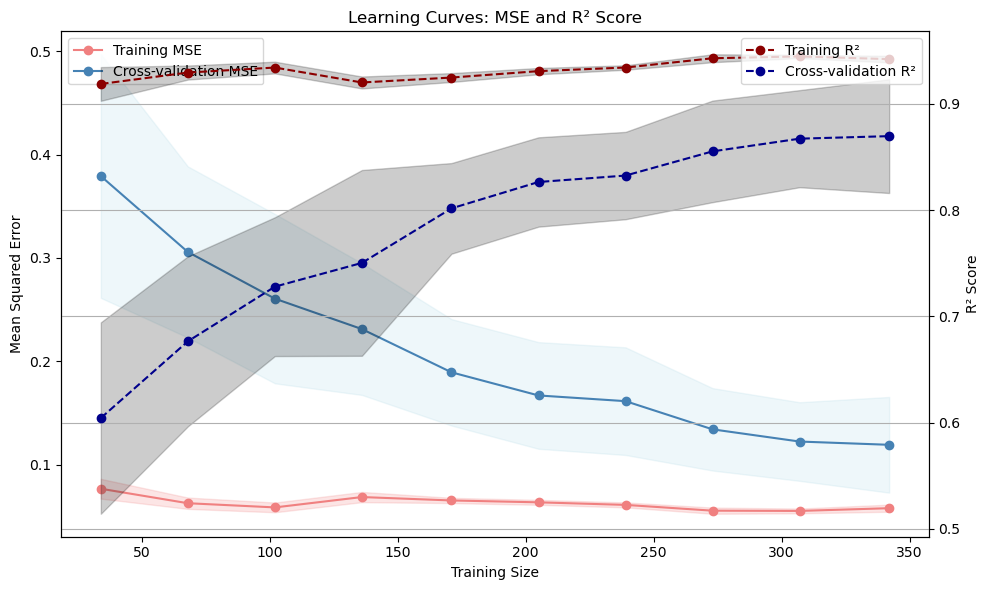

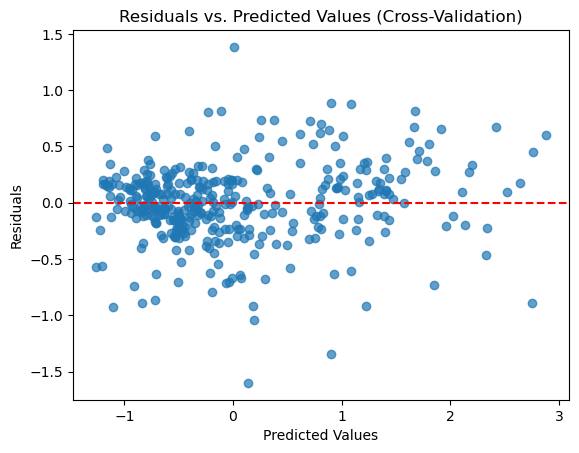

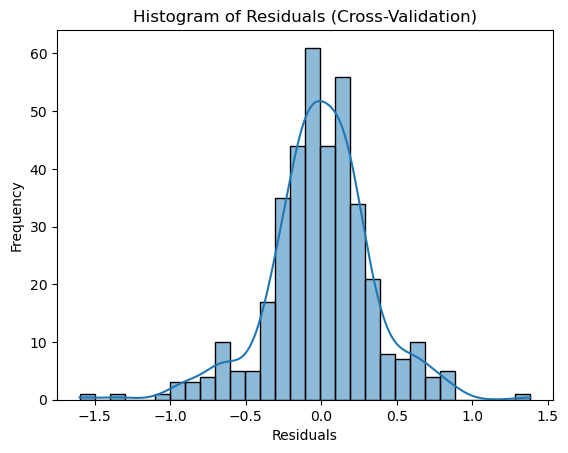

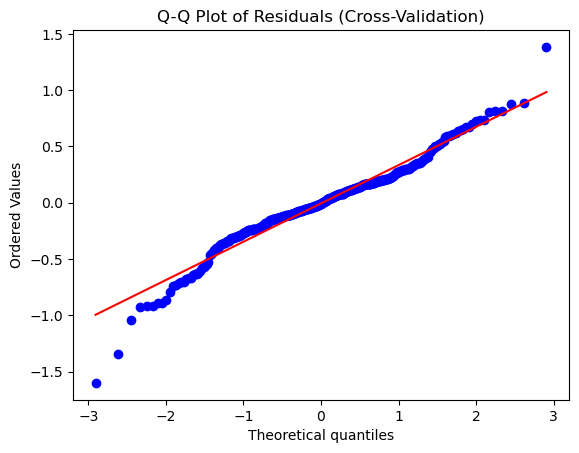

In [303]:
# Fit the Model to the Training Data
model.fit(X_train_scaled, y_train_scaled)

# Call the Function
model_analysis(model, r2_initial, mse_initial)

**Comment**
<br> *Compare Training and Test Performance*
- The scores for the training value indicates that the model fits the training data *extremely well*, almost perfectly. This indicates that it has likely learned the training data, including its noise.
- The R² score of 0.767 on the `Test Set` is ok, but the relatively higher MSE suggests that the model *does not generalize well* to unseen data.

The sharp contrast between the training and test metrics indicates overfitting. The model has learned the training data too well, including its noise and outliers, which results in poor performance on the test set.

*Learning Curve* 
- The `training score (MSE)` being close to 0 and the `Training score (R²)` being close to 1, indicates that the model is fitting the training data extremely well, which strongly supports the concern of *overfitting*.
- The `cross-validation score (MSE)` shows a decreasing trend as the training size increases. This indicates that as you train on more data, the model's ability to generalize improves, albeit slowly.

Regularization and tuning of hyperparameters is going to be important.

*Residual Plots*
<br> The plots are better than for the `SGDRegressor model` and the `LinearRegressor() model`. 
- The *Residial Plot* has its points randomly scattered around the 0-line. This is good as it suggests that the model has captured the overall pattern well.
- The histogram looks as if the residuals have a normal distribution
- The Q-Q Plot has its points on the line, except for in the lower theoretical quantiles. This indicates that I may have issues with the tails and outliers.  

#### 4.9.3 Hyperparameter Tuning

We will now try out some hyperparameters.

In [304]:
# Initialize the Model
model = SVR()

# Set up the Hyperparameter Grid
param_grid = {
    'C': [0.1, 0.5, 1, 2],
    'epsilon': [0.04, 0.05, 0.06],
    'gamma': ['scale', 'auto'],  # Only relevant for 'rbf', 'poly', and 'sigmoid' kernels
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid']
}

# Call the Function
best_model, best_params = tune_hyperparameters(model, param_grid)

Fitting 10 folds for each of 96 candidates, totalling 960 fits
Average R² Score: 0.880 (± 0.055)
Average MSE Score: 0.110 (± 0.052)

Best Hyperparameters:
C: 2
epsilon: 0.06
gamma: auto
kernel: rbf


#### 4.9.4 Overfitting/Underfitting (tuned model)

Comparison between train and test scores:

R² Score - train: 0.957
R² Score - test: 0.767
MSE Score - train: 0.043
MSE Score - test: 0.273

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34         0.031           0.309        0.967          0.676
            68         0.034           0.278        0.961          0.704
           102         0.036           0.229        0.960          0.758
           136         0.040           0.195        0.954          0.783
           171         0.040           0.161        0.954          0.828
           205         0.039           0.144        0.958          0.847
           239         0.038           0.138        0.959          0.852
           273         0.036           0.122        0.963          0.867
           307         0.038           0.114        0.962          0.875
           342         0.042           0.110        0.958          0.880


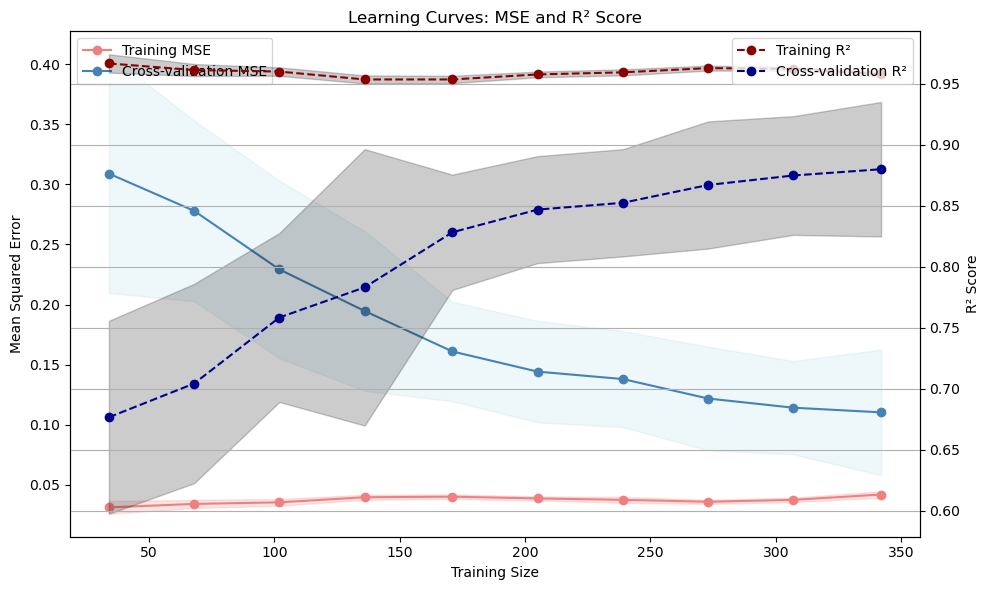

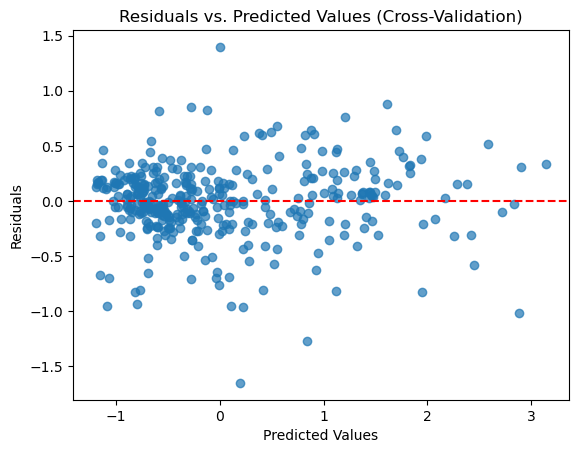

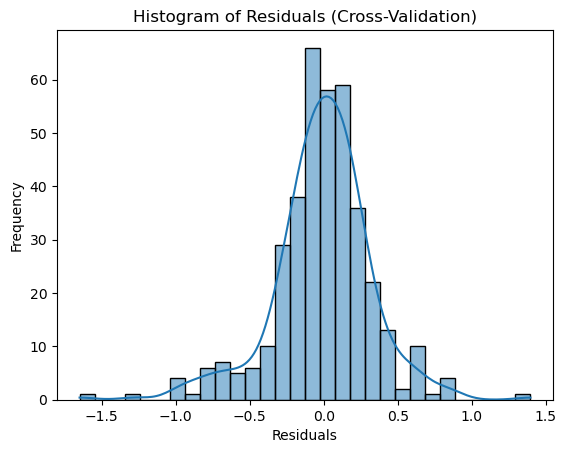

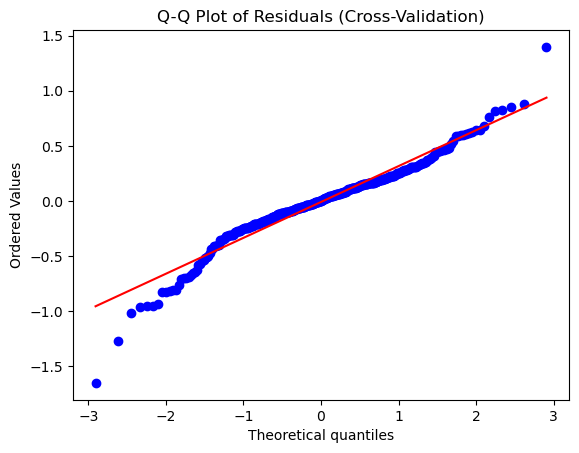

In [305]:
# Call the Function
model_analysis(best_model, r2_initial, mse_initial)

**Comment**
- It is indeed still overfitting.
- Let's tweak some parameters.

In [342]:
# Initialize the Model
model = SVR()

# Set up the Hyperparameter Grid
param_grid = {
    'C': [0.9],
    'epsilon': [0.14, 0.15, 0.16],
    'gamma': ['scale', 'auto'],  # Only relevant for 'rbf', 'poly', and 'sigmoid' kernels
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid']
}

# Call the Function
best_model, best_params = tune_hyperparameters(model, param_grid)

Fitting 10 folds for each of 24 candidates, totalling 240 fits
Average R² Score: 0.873 (± 0.043)
Average MSE Score: 0.120 (± 0.047)

Best Hyperparameters:
C: 0.9
epsilon: 0.15
gamma: scale
kernel: linear


Comparison between train and test scores:

R² Score - train: 0.890
R² Score - test: 0.767
MSE Score - train: 0.110
MSE Score - test: 0.273

Learning Curves:

 Training Size  Training MSE  Validation MSE  Training R²  Validation R²
            34         0.087           0.225        0.909          0.749
            68         0.104           0.158        0.884          0.829
           102         0.100           0.132        0.888          0.859
           136         0.094           0.125        0.891          0.868
           171         0.094           0.124        0.892          0.869
           205         0.099           0.125        0.893          0.868
           239         0.111           0.124        0.880          0.869
           273         0.108           0.123        0.889          0.869
           307         0.108           0.120        0.891          0.872
           342         0.109           0.120        0.891          0.873


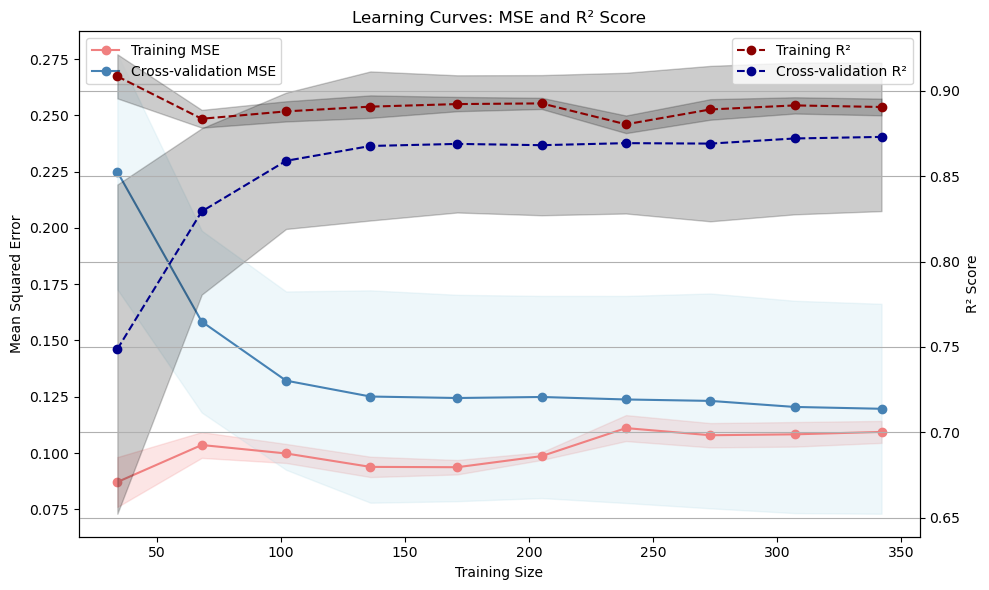

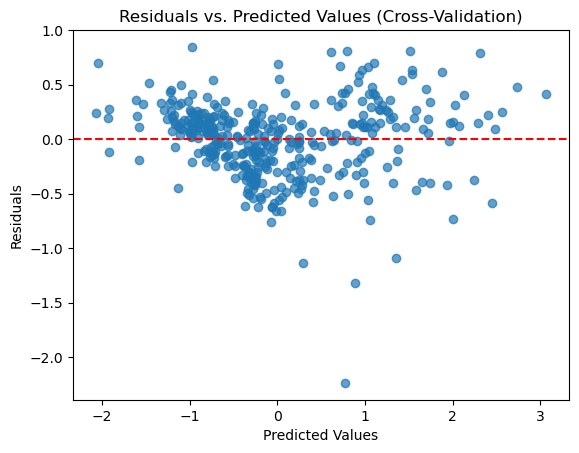

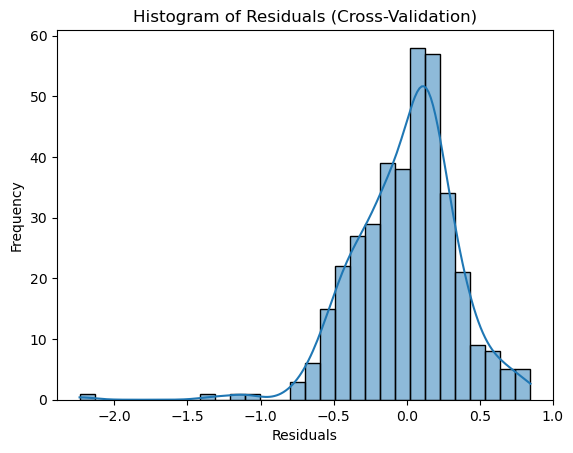

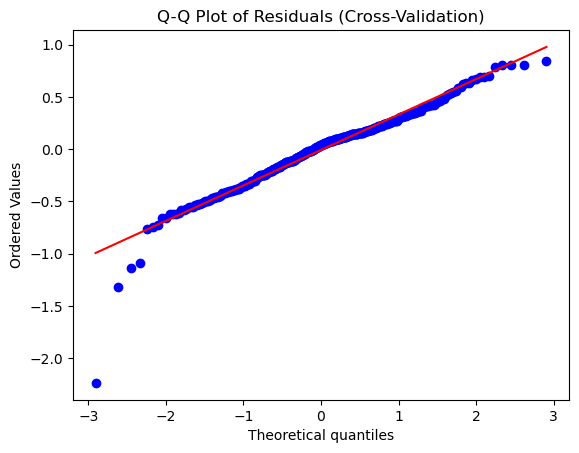

In [343]:
# Call the Function
model_analysis(best_model, r2_initial, mse_initial)

**Comment**
- Lowering C from 5 to 0.9 helped.

#### 4.9.5 Final Evaluation

We now run our parameter-optimized model with our test data.

In [344]:
# Call the Function
final_evaluation(best_model, r2_initial, mse_initial)

Initial R² Score - Test: 0.767
Tuned R² Score - Train: 0.890
Tuned R² Score - Test: 0.913
Performance change: R² Score - test: 19.0%

Initial MSE Score - Test: 0.273
Tuned MSE Score - Train: 0.110
Tuned MSE Score - Test: 0.102
Performance change: MSE Score - test: -62.5%


**Comment**
- That's actaully a very good score. 

## 5. Comparing Models

We will now compare the scores of the models.

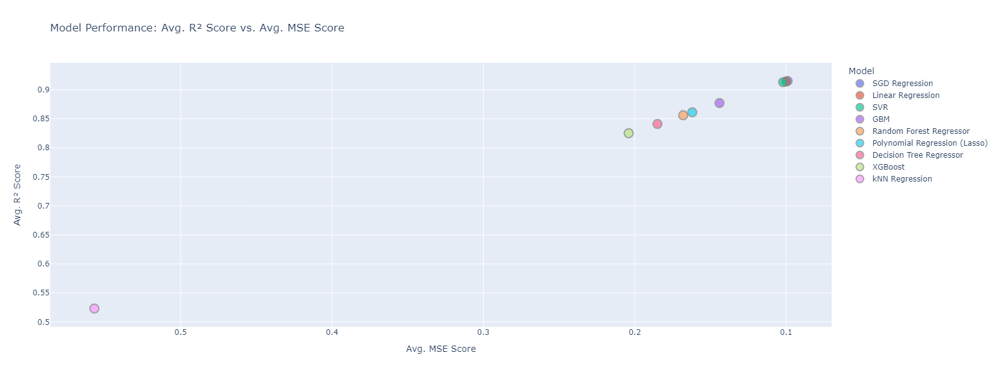

In [345]:
data = {
    'Model': ['SGD Regression', 'Linear Regression', 'SVR', 'GBM', 
              'Random Forest Regressor', 'Decision Tree Regressor',
              'Polynomial Regression (Lasso)', 'XGBoost', 'kNN Regression'],
    'Avg. R² Score': [0.915, 0.914, 0.913, 0.877, 
                      0.830, 0.856, 0.841, 0.825, 0.523],
    'Avg. MSE Score': [0.099, 0.100, 0.102, 0.144, 
                       0.198, 0.168, 0.185, 0.204, 0.557]
}

# Create a DataFrame
df = pd.DataFrame(data)

# Create the scatter plot with tooltips using Plotly
fig = px.scatter(df, 
                 x='Avg. MSE Score', 
                 y='Avg. R² Score', 
                 color='Model', 
                 size=[5] * len(df),
                 size_max=10, 
                 hover_name='Model', 
                 hover_data={'Avg. R² Score': True, 'Avg. MSE Score': True},
                 labels={'Avg. MSE Score': 'Avg. MSE Score', 
                         'Avg. R² Score': 'Avg. R² Score'},
                 title='Model Performance: Avg. R² Score vs. Avg. MSE Score',
                 width=1000,   # Adjust width here
                 height=600)  # Adjust height here

# Add black border around points
fig.update_traces(marker=dict(line=dict(width=2, color='grey')))

# Invert the x-axis
fig.update_xaxes(autorange='reversed')

# Show the plot
fig.show()


| Model                      | Avg. R² Score | Avg. MSE Score |
|----------------------------|---------------|----------------|
| SGD Regression              | 0.915         | 0.099          |
| Linear Regression           | 0.914         | 0.100          |
| SVR                         | 0.913         | 0.102          |
| GBM                         | 0.877         | 0.144          |
| Random Forest Regressor      | 0.856         | 0.168          |
| Decision Tree Regressor      | 0.841         | 0.185          |
| Polynomial Regression (Lasso)| 0.830         | 0.198          |
| XGBoost                     | 0.825         | 0.204          |
| kNN Regression              | 0.523         | 0.557          |


**Comment**
<br> The top 3 models are a cut above all other models - `SGD Regression`, `Linear Regression`, and `Support Vector Machines (SVM) with Regression (SVR)`.
<br> The worst one, is really bad - `kNN Regression`.
<br> The others are quite alright.

## 6. Ensemble Methods

Since we have similar results, but different candidate models, we'd like to draw on their respective strengths.
<br> *Weighted Average* is a good ensemble method that is quite easy to implement, while *Stacking* may combine the strengths of each model effectively, at the expense of computational power.
<br> We will focus on *weighted* this time.
<br> *Staking* is saved for another time.

### 6.1 Weighted Ensemble

Let's optimize the weights by using Scipy's Optimize.
<br> As we are a bit unsure about including `GMB` with its lowere scores, let's see what happens if we remove it from the analysis.
<br> This first code includes all four interesting models - the three best ones, and `GBM`.

In [361]:
# Initialize models with optimal parameters
sgd_model = SGDRegressor(penalty='elasticnet', alpha=0.01, eta0=0.001, l1_ratio=1, learning_rate='constant', max_iter=80, tol=1e-05, random_state=42)
elastic_net_model = ElasticNet(alpha=0.01, l1_ratio=1, max_iter=1000, tol=1e-09, random_state=42)
svr_model = SVR(C=0.9, epsilon=0.15, gamma='scale', kernel='linear')
#gbm_model = GradientBoostingRegressor(alpha=0.0001, learning_rate=0.12, max_depth=5, min_samples_leaf=8, min_samples_split=4, n_estimators=48, subsample=0.47, random_state=42)

# Train optimal models on the training set
trained_sgd = sgd_model.fit(X_train_scaled, y_train_scaled)
trained_elastic_net = elastic_net_model.fit(X_train_scaled, y_train_scaled)
trained_svr = svr_model.fit(X_train_scaled, y_train_scaled)
#trained_gbm = gbm_model.fit(X_train_scaled, y_train_scaled)

# Predict on the test set (to optimize weights)
predictions_train = {
    'SGD Regression': trained_sgd.predict(X_test_scaled),
    'Elastic Net': trained_elastic_net.predict(X_test_scaled),
    'SVR': trained_svr.predict(X_test_scaled),
    #'GBM': trained_gbm.predict(X_test_scaled)
}

# List of models for reference
models = list(predictions_train.keys())

# Define a custom scorer function for R² on test data
def neg_r2_loss_train(weights):
    # Normalize the weights to ensure they sum to 1
    weights = np.array(weights)
    weights /= np.sum(weights)
    
    # Calculate the weighted predictions on test data
    weighted_preds_train = sum(weights[i] * predictions_train[model_name] for i, model_name in enumerate(models))
    
    # Return the negative R² score on test data
    return -r2_score(y_test_scaled, weighted_preds_train)

# Initial guess for the weights (equal weighting)
initial_weights = [1/len(predictions_train)] * len(predictions_train)

# Bounds to ensure weights are non-negative
bounds = [(0, 1)] * len(predictions_train)

# Constraint to ensure the weights sum to 1
constraints = {'type': 'eq', 'fun': lambda w: np.sum(w) - 1}

# Use minimize function to find the best weights based on test set
result = minimize(neg_r2_loss_train, initial_weights, bounds=bounds, constraints=constraints, method='SLSQP')

# Extract the best weights and round them to 3 decimal places
best_weights = np.round(result.x, 3)

# Save the best weights to a file
joblib.dump(best_weights, 'best_weights.pkl')

# Evaluate R² on the training set with optimized weights
optimized_preds_train = sum(best_weights[i] * predictions_train[model_name] for i, model_name in enumerate(models))
r2_weighted_optimized_train = r2_score(y_test_scaled, optimized_preds_train)

# Print the optimized weights and R² score
print(f"Optimal Weights: {best_weights}")
print(f"R² Score on Training Set (Optimized Weighted Averaging): {r2_weighted_optimized_train:.4f}")


Optimal Weights: [0.566 0.328 0.106]
R² Score on Training Set (Optimized Weighted Averaging): 0.9150


**Comment**
- We can see that it prefers 56.6% `SGD Regression` + 32.8% `Elastic Net Linear Regression`, and 10.6% `SVR`.
- `SGD` is the dominant model, while `SVR` isn't favoured.

In [362]:
# Initialize models with optimal parameters
sgd_model = SGDRegressor(penalty='elasticnet', alpha=0.01, eta0=0.001, l1_ratio=1, learning_rate='constant', max_iter=80, tol=1e-05, random_state=42)
elastic_net_model = ElasticNet(alpha=0.01, l1_ratio=1, max_iter=1000, tol=1e-09, random_state=42)
svr_model = SVR(C=0.9, epsilon=0.15, gamma='scale', kernel='linear')
gbm_model = GradientBoostingRegressor(alpha=0.0001, learning_rate=0.12, max_depth=5, min_samples_leaf=8, min_samples_split=4, n_estimators=48, subsample=0.47, random_state=42)

# Train optimal models on the training set
trained_sgd = sgd_model.fit(X_train_scaled, y_train_scaled)
trained_elastic_net = elastic_net_model.fit(X_train_scaled, y_train_scaled)
trained_svr = svr_model.fit(X_train_scaled, y_train_scaled)
trained_gbm = gbm_model.fit(X_train_scaled, y_train_scaled)

# Predict on the test set (to optimize weights)
predictions_train = {
    'SGD Regression': trained_sgd.predict(X_test_scaled),
    'Elastic Net': trained_elastic_net.predict(X_test_scaled),
    'SVR': trained_svr.predict(X_test_scaled),
    'GBM': trained_gbm.predict(X_test_scaled)
}

# List of models for reference
models = list(predictions_train.keys())

# Define a custom scorer function for R² on test data
def neg_r2_loss_train(weights):
    # Normalize the weights to ensure they sum to 1
    weights = np.array(weights)
    weights /= np.sum(weights)
    
    # Calculate the weighted predictions on test data
    weighted_preds_train = sum(weights[i] * predictions_train[model_name] for i, model_name in enumerate(models))
    
    # Return the negative R² score on test data
    return -r2_score(y_test_scaled, weighted_preds_train)

# Initial guess for the weights (equal weighting)
initial_weights = [1/len(predictions_train)] * len(predictions_train)

# Bounds to ensure weights are non-negative
bounds = [(0, 1)] * len(predictions_train)

# Constraint to ensure the weights sum to 1
constraints = {'type': 'eq', 'fun': lambda w: np.sum(w) - 1}

# Use minimize function to find the best weights based on test set
result = minimize(neg_r2_loss_train, initial_weights, bounds=bounds, constraints=constraints, method='SLSQP')

# Extract the best weights and round them to 3 decimal places
best_weights = np.round(result.x, 3)

# Save the best weights to a file
joblib.dump(best_weights, 'best_weights.pkl')

# Evaluate R² on the training set with optimized weights
optimized_preds_train = sum(best_weights[i] * predictions_train[model_name] for i, model_name in enumerate(models))
r2_weighted_optimized_train = r2_score(y_test_scaled, optimized_preds_train)

# Print the optimized weights and R² score
print(f"Optimal Weights: {best_weights}")
print(f"R² Score on Training Set (Optimized Weighted Averaging): {r2_weighted_optimized_train:.4f}")


Optimal Weights: [0.496 0.258 0.    0.246]
R² Score on Training Set (Optimized Weighted Averaging): 0.9195


**Conclusion**
- As we can see, it want to run 49.6% `SGD Regression` + 25.8% `Elastic Net Linear Regression`, and 24.6% `GBM`.
- It discards `SVR`.
- The `R² Score` increases slightly from 0.9150 to 0.9195, by keeping the `GBM` model in the evaluation.

**Conclusion**
- We will use option 2, and include the `GBM` model.

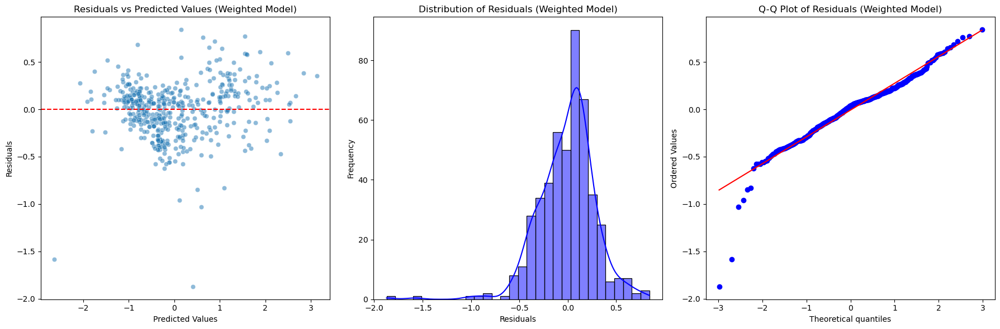

In [364]:
# Load the optimized weights
best_weights = joblib.load('best_weights.pkl')

# Combine training and test data for features and target
X_scaled = np.vstack((X_train_scaled, X_test_scaled))  # Assembling scaled features
y_scaled = np.concatenate((y_train_scaled, y_test_scaled))  # Assembling scaled targets

# Generate predictions using the ensemble model with optimized weights on the entire dataset
y_pred_weighted_all = (best_weights[0] * sgd_model.predict(X_scaled) +
                       best_weights[1] * elastic_net_model.predict(X_scaled) +
                       best_weights[2] * svr_model.predict(X_scaled) +
                       best_weights[3] * gbm_model.predict(X_scaled))

# Compute residuals
residuals_weighted_all = y_scaled - y_pred_weighted_all  # Assuming y_scaled is your target variable for the entire dataset

# Create a figure with three subplots: residuals vs. predicted values, histogram of residuals, and Q-Q plot
plt.figure(figsize=(18, 6))

# Residuals vs. Predicted Values Plot
plt.subplot(1, 3, 1)
sns.scatterplot(x=y_pred_weighted_all, y=residuals_weighted_all, alpha=0.5)
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residuals vs Predicted Values (Weighted Model)')

# Histogram of Residuals
plt.subplot(1, 3, 2)
sns.histplot(residuals_weighted_all, kde=True, color='blue', bins=30)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Distribution of Residuals (Weighted Model)')

# Q-Q Plot of Residuals
plt.subplot(1, 3, 3)
stats.probplot(residuals_weighted_all, dist="norm", plot=plt)
plt.title('Q-Q Plot of Residuals (Weighted Model)')

# Adjust layout to ensure everything fits well
plt.tight_layout()
plt.show()


**Comment**
- It looks quite decent.
- The residual plot looks alright, although the may still be some non-linear that is not being picked up by the model.
- The distribution of residuals seems to be slightly negatively skewed, and this is confirmed in the Q-Q Plot.
- We may have a hard time with smaller priced apartments.

## 7. Final Model Training 

We will now train the model on the full dataset (Training and Test set) to create the final model.

### 7.1 Train Full Dataset 

In [365]:
# Initialize models with optimal parameters
sgd_model = SGDRegressor(penalty='elasticnet', alpha=0.01, eta0=0.001, 
                         l1_ratio=1, learning_rate='constant', max_iter=80, 
                         tol=1e-05, random_state=42)

elastic_net_model = ElasticNet(alpha=0.01, l1_ratio=1, max_iter=1000, 
                                tol=1e-09, random_state=42)

svr_model = SVR(C=0.9, epsilon=0.15, gamma='scale', kernel='linear')

gbm_model = GradientBoostingRegressor(alpha=0.0001, learning_rate=0.12, 
                                       max_depth=5, min_samples_leaf=8, 
                                       min_samples_split=4, n_estimators=48, 
                                       subsample=0.47, random_state=42)

# Train models on the entire dataset
trained_sgd = sgd_model.fit(X_scaled, y_scaled)
trained_elastic_net = elastic_net_model.fit(X_scaled, y_scaled)
trained_svr = svr_model.fit(X_scaled, y_scaled)
trained_gbm = gbm_model.fit(X_scaled, y_scaled)

# Generate predictions using the ensemble model with optimized weights
y_pred_weighted_final = (best_weights[0] * trained_sgd.predict(X_scaled) +
                         best_weights[1] * trained_elastic_net.predict(X_scaled) +
                         best_weights[2] * trained_svr.predict(X_scaled) +
                         best_weights[3] * trained_gbm.predict(X_scaled))

# Calculate R² score and MSE
final_r2_score = r2_score(y_scaled, y_pred_weighted_final)
final_mse = mean_squared_error(y_scaled, y_pred_weighted_final)

# Save the final ensemble model
joblib.dump({
    'weights': best_weights,
    'sgd_model': trained_sgd,
    'elastic_net_model': trained_elastic_net,
    'svr_model': trained_svr,
    'gbm_model': trained_gbm
}, 'final_weighted_ensemble_model.pkl')

# Print final scores
print("Final Weighted Ensemble model trained on the entire dataset.")
print(f"Final R² Score: {final_r2_score:.4f}")
print(f"Final MSE: {final_mse:.4f}")


Final Weighted Ensemble model trained on the entire dataset.
Final R² Score: 0.9194
Final MSE: 0.0833


**Comment**
- That is a good final number that indicates a strong performance of the optimized weighted averaging ensemble.

## 8. Final Model Check

### 8.1 Cross-validation

We will perform a cross-validation step to see if the ensemble model generalizes well.

In [20]:
# Load the final ensemble model
ensemble_model = joblib.load('final_weighted_ensemble_model.pkl')

# Access the individual components
best_weights = ensemble_model['weights']
trained_sgd = ensemble_model['sgd_model']
trained_elastic_net = ensemble_model['elastic_net_model']
trained_svr = ensemble_model['svr_model']
trained_gbm = ensemble_model['gbm_model']

# Combine training and test data for features and target
X_scaled = np.vstack((X_train_scaled, X_test_scaled))  # Assembling scaled features
y_scaled = np.concatenate((y_train_scaled, y_test_scaled))  # Assembling scaled targets

# Custom function to predict using the ensemble
def ensemble_predict(X):
    sgd_pred = trained_sgd.predict(X)
    elastic_net_pred = trained_elastic_net.predict(X)
    svr_pred = trained_svr.predict(X)
    gbm_pred = trained_gbm.predict(X)
    
    # Weighted average of predictions
    final_pred = (best_weights[0] * sgd_pred + 
                  best_weights[1] * elastic_net_pred + 
                  best_weights[2] * svr_pred + 
                  best_weights[3] * gbm_pred)
    
    return final_pred

# Define custom cross-validation scoring
def custom_ensemble_cross_val(X, y, cv):
    scores = []
    for train_idx, val_idx in cv.split(X):
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]
        
        # Make predictions on validation set
        y_pred = ensemble_predict(X_val)
        
        # Calculate R² score
        r2 = r2_score(y_val, y_pred)
        scores.append(r2)
    
    return np.array(scores)

# Get cross-validation R² scores
scores = custom_ensemble_cross_val(X_scaled, y_scaled, kfold)

print("Cross-Validation R² Scores:", scores)
print("Mean R² Score:", scores.mean())

Cross-Validation R² Scores: [0.89616325 0.94353109 0.90728979 0.89843839 0.93935544 0.95302843
 0.93340796 0.94637948 0.8670424  0.89157472]
Mean R² Score: 0.9176210928556573


**Comment**
<br> These cross-validation R² scores look excellent! 
<br> They are all quite close to the final R² score of 0.9194, which indicates that the model generalizes well across different data splits.
- The scores are consistently high, ranging from approximately 0.867 to 0.953, showing stability in the model’s performance.
- The mean R² score of 0.9176 is very close to the original final R² score, which suggests that the ensemble model is reliable and likely not overfitting.

We are ready to test the model on unseen data.